# scGEN Benchmarking pipeline

## Introduction-Dependencies

In [1]:
# Importing necessary libraries
import pertpy as pp
import torch
import os
import random
import scanpy as sc
import sys
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sys.path.append('./')
# from scGen_class_v2 import scGenPerturbationAnalysis


from scvi import REGISTRY_KEYS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import sparse, stats

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
pwd

'/home/ubuntu/Perturb_Bench/BioHackathon/tools/Complex_generative/scGen'

To commence the benchmarking pipeline on `scGEN`, we will load a small dataset that will help us set up and expand the whole pipeline.
The pipeline should be a **gallery** of:
* **Statistical metrics** evaluating the predictions of `scGEN`
  * R2 after bootstrapping
  * distance metrics
  * PCC?
  * [add more] 
* Some **biological outputs** that will reveal how close to the underlying biological ground truth the predictions are
  * Gene Regulatory Network (GRN) reconstruction through `Decoupler`, `scMINER` etc..
  * Pathway Enrichment
  * Marker Genes

The **datasets** that will be tested should capture a wide array of perturbations beyond the simple scenario of IFN-stimulated PBMCs that has been widely used. Datasets with tens or hundreds of perturbations are out of scope for scGEN and similar models. However, relevant datasets could capture:
* cross-studies benchmarking
* cross-species benchmarking
* temporal perturbations
* disease as the perturbation with patients introducing batch effect


## Module 0: Data Preparation

Here we load the dataset that we want to use for benchmarking

In [9]:
covid_data = sc.read('data/stephenson_2021_subsampled.h5ad')
covid_data

AnnData object with n_obs × n_vars = 62509 × 16299
    obs: 'Collection_Day', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'author_cell_type', 'organism', 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'cell_type', 'dataset_group'
    var: 'gene_id', 'gene_name'
    uns: 'log1p', 'umap'
    obsm: 'X_scVI', 'X_umap'

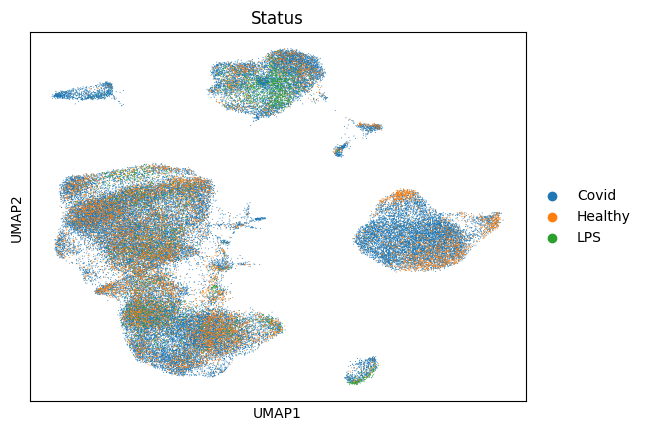

In [12]:
sc.pl.umap(covid_data, color = ['Status'])

We will keep two perturbations for starters: **control vs LPS** and we will see which PCs we can introduce to accommodate all cell types

In [26]:
# 0) your experiment knobs
pca_components = 50
ctrl_key      = "nan"
stim_key      = "10h"
condition_col = "time_after_LPS"
celltype_col  = "author_cell_type"

# 1) prefilter once
covid_data = pp.dt.stephenson_2021_subsampled()
norm_data  = covid_data[covid_data.obs["disease"] == "normal"].copy()
sc.pp.subsample(norm_data, n_obs=3000)

# 2) determine which cell types to benchmark
pivot = (
    norm_data
    .obs[[celltype_col, condition_col]]
    .value_counts()
    .unstack(fill_value=0)
)
common_celltypes = pivot.query(f"`{ctrl_key}`>5 and `{stim_key}`>5").index.tolist()

# 3) compute the *smallest* eval set size across all types
eval_sizes = []
for ct in common_celltypes:
    # build Boolean masks
    mask_ctrl = (
        (norm_data.obs[celltype_col] == ct) &
        (norm_data.obs[condition_col] == ctrl_key)
    )
    mask_stim = (
        (norm_data.obs[celltype_col] == ct) &
        (norm_data.obs[condition_col] == stim_key)
    )
    # sum() directly on the mask gives an int count of True values
    n_ctrl = mask_ctrl.sum()
    n_stim = mask_stim.sum()
    # scGen.predict will output one predicted per ctrl cell
    n_pred = n_ctrl

    eval_sizes.append(n_ctrl + n_stim + n_pred)

# 4) clamp the requested PCA dims
fixed_rank = min(min(eval_sizes) - 1, pca_components)
print(f"Using fixed PCA components = {fixed_rank} for every cell type")

Using fixed PCA components = 30 for every cell type


In [18]:
norm_data

AnnData object with n_obs × n_vars = 3000 × 16299
    obs: 'Collection_Day', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'author_cell_type', 'organism', 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'cell_type', 'dataset_group'
    var: 'gene_id', 'gene_name'
    uns: 'log1p', 'umap'
    obsm: 'X_scVI', 'X_umap'

In [28]:
counts = norm_data.obs[celltype_col].value_counts()
top5   = counts.head(5).index.tolist()

# 2) subset the AnnData in one go
norm_data = norm_data[norm_data.obs[celltype_col].isin(top5)].copy()

# 3) verify
print("Kept cell counts:")
print(norm_data.obs[celltype_col].value_counts())

Kept cell counts:
author_cell_type
NK_16hi      463
CD4.Naive    355
B_naive      295
CD4.CM       246
CD8.Naive    222
Name: count, dtype: int64


In [29]:
sc.pp.highly_variable_genes(
    norm_data,
    n_top_genes=5000,
    flavor="seurat_v3",   # or “cell_ranger”/“seurat” depending on your preference
    subset=True           # subset in place
)

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:73: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [30]:
norm_data

AnnData object with n_obs × n_vars = 1581 × 5000
    obs: 'Collection_Day', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'author_cell_type', 'organism', 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'cell_type', 'dataset_group'
    var: 'gene_id', 'gene_name', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'umap', 'hvg'
    obsm: 'X_scVI', 'X_umap'

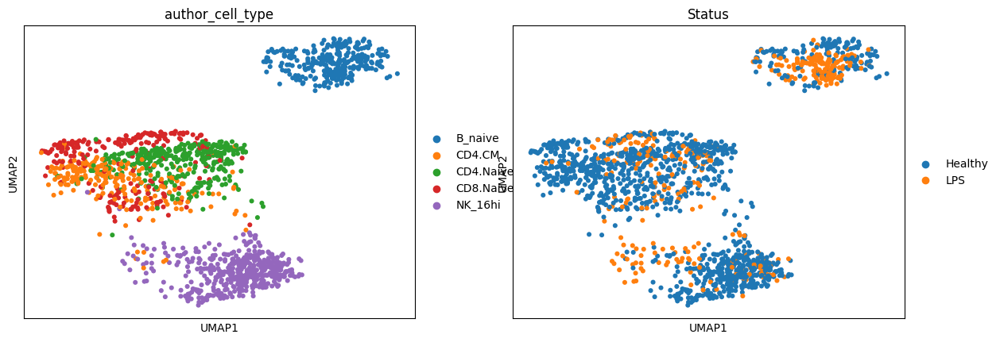

In [35]:
sc.pl.umap(norm_data, color=["author_cell_type", "Status"])

In [7]:
common_celltypes = norm_data.obs[celltype_col].unique().tolist()
print("Now benchmarking these cell types:", common_celltypes)

Now benchmarking these cell types: ['B_naive', 'NK_16hi', 'CD4.Naive', 'CD4.CM', 'CD8.Naive']


In [33]:
# norm_data.write_h5ad("data/toy_LPS.h5ad")

In [3]:
norm_data = sc.read("data/toy_LPS.h5ad")
norm_data

AnnData object with n_obs × n_vars = 1581 × 5000
    obs: 'Collection_Day', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'author_cell_type', 'organism', 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'cell_type', 'dataset_group'
    var: 'gene_id', 'gene_name', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Status_colors', 'cell_type_colors', 'hvg', 'log1p', 'umap'
    obsm: 'X_scVI', 'X_umap'

## Module 0.5 scgen_class.py

In [2]:
import pertpy as pt
import scanpy as sc
from scvi import REGISTRY_KEYS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

class scGenPerturbationAnalysis:
    """
    A class to perform perturbation analysis using scGen on single-cell RNA-seq data.

    This class encapsulates the full analysis pipeline from data loading and preprocessing
    to model training, prediction, and evaluation.

    Attributes:
    - data: The original AnnData object containing the dataset.
    - train_set: The training dataset after excluding specific cells.
    - scgen_model: The trained scGen model.
    - latent_adata: AnnData object containing latent representations.
    - pred: AnnData object containing predicted cells.
    - delta: The perturbation vector learned by the model.
    - eval_adata: AnnData object used for evaluating predictions.
    - diff_genes: List of differentially expressed genes.
    - r2_value: R^2 value from mean expression correlation plot.
    - r_value_diff: R value for differentially expressed genes.
    - perturbation_score: Perturbation score computed using a distance metric.
    """

    def __init__(self, data):
        """
        Initialize the scGenPerturbationAnalysis class with the input data.

        Parameters:
        - data: AnnData object containing single-cell RNA-seq data.
        """
        self.data = data.copy()
        self.train_set = None
        self.scgen_model = None
        self.latent_adata = None
        self.pred = None
        self.delta = None
        self.eval_adata = None
        self.diff_genes = None
        self.r2_value = None
        self.r_value_diff = None
        self.perturbation_score = None

    def explore_data(self, groupby_cols=None, plot_cols=None, value_count_cols=None):
        """
        Perform basic exploration of the data, including printing counts, value counts, and plotting UMAPs.

        Parameters:
        - groupby_cols: List of column names to group by for counts (default: None).
        - plot_cols: List of column names to use for UMAP coloring (default: None).
        - value_count_cols: List of column names to display value counts (default: None).
        """
        print("Exploring data...")

        # Group by specified columns to understand sample distribution
        if groupby_cols is not None:
            combined_counts = self.data.obs.groupby(groupby_cols).size()
            combined_counts_df = combined_counts.reset_index(name='counts')
            print(f"Counts by {groupby_cols}:")
            print(combined_counts_df)
            print()
        else:
            print("No groupby columns provided for counts.")
            print()

        # Display value counts for specified columns
        if value_count_cols is not None:
            for col in value_count_cols:
                if col in self.data.obs.columns:
                    print(f"Value counts for '{col}':")
                    print(self.data.obs[col].value_counts())
                    print()
                else:
                    print(f"Column '{col}' not found in data.obs.")
        else:
            print("No columns provided for value counts.")
            print()

        # Visualize UMAP embeddings colored by specified annotations
        if plot_cols is not None:
            for col in plot_cols:
                if col in self.data.obs.columns:
                    sc.pl.umap(self.data, color=col, show=True)
                else:
                    print(f"Column '{col}' not found in data.obs.")
        else:
            print("No columns provided for UMAP plotting.")
        print()

    def filter_data(self, filter_conditions=None, verify_counts=False, count_groupby_cols=None):
        """
        Filter the data based on user-defined conditions.

        Parameters:
        - filter_conditions: Dictionary where keys are column names and values are the desired values to keep.
                            Values can be single values or lists of values.
                            Example: {'disease': ['normal', 'covid19']}
        - verify_counts: Boolean indicating whether to verify the filtering by checking counts (default: False).
        - count_groupby_cols: List of column names to group by when checking counts (default: None).
                            If None and verify_counts is True, defaults to filter_conditions.keys() if filter_conditions is provided.
                            If both are None, counts will not be printed.
        """
        print("Filtering data based on user-defined conditions...")
        if filter_conditions is not None:
            query_parts = []
            for col, vals in filter_conditions.items():
                if isinstance(vals, list):
                    # If vals is a list, create an OR condition for all values
                    vals_formatted = ', '.join([f'"{val}"' for val in vals])
                    query_parts.append(f'({col} in [{vals_formatted}])')
                else:
                    # Single value condition
                    query_parts.append(f'({col} == "{vals}")')
            query = " & ".join(query_parts)
            self.data = self.data[self.data.obs.eval(query)].copy()
            print(f"Filtered data with conditions: {filter_conditions}")
            print()
        else:
            print("No filter conditions provided. Data remains unfiltered.")
            print()

        # Verify the filtering by checking counts
        if verify_counts:
            if count_groupby_cols is None:
                if filter_conditions is not None:
                    count_groupby_cols = list(filter_conditions.keys())
                else:
                    print("No groupby columns provided for counts.")
                    count_groupby_cols = []
            if count_groupby_cols:
                print("Counts after filtering:")
                print(self.data.obs.groupby(count_groupby_cols).size().reset_index(name='counts'))
                print()
            else:
                print("No columns provided for grouping counts.")
                print()

    def normalize_and_visualize(self, normalize=True, log_transform=True, target_sum=1e4, plot_cols=None):
        """
        Normalize the data and visualize UMAP embeddings.

        Parameters:
        - normalize: Whether to normalize the data (default: True).
        - log_transform: Whether to log-transform the data (default: True).
        - target_sum: Target sum for normalization (default: 1e4).
        - plot_cols: List of column names to use for UMAP coloring (default: None).
        """
        if normalize:
            print("Normalizing data...")
            sc.pp.normalize_total(self.data, target_sum=target_sum)
            print(f"Data normalized to total counts per cell with target sum {target_sum}.")
            print()
        else:
            print("Normalization skipped.")
            print()
            
        if log_transform:
            sc.pp.log1p(self.data)
            print("Data log-transformed (log1p).")
            print()
        else:
            print("Log transformation skipped.")
            print()
            
        # Visualize UMAP embedding colored by specified columns
        if plot_cols is not None:
            for col in plot_cols:
                if col in self.data.obs.columns:
                    sc.pl.umap(self.data, color=col, show=True)
                else:
                    print(f"Column '{col}' not found in data.obs.")
        else:
            print("No columns provided for UMAP plotting.")
        print()

    def preprocess_data(
        self,
        highly_variable_genes=True,
        n_top_genes=2000,
        remove_conditions=None,
        subsample_n=None
    ):
        """
        Preprocess the data for scGen, including selecting highly variable genes,
        removing specific conditions, and subsampling.

        Parameters:
        - highly_variable_genes: Whether to select highly variable genes (default: True).
        - n_top_genes: Number of top variable genes to select (default: 2000).
        - remove_conditions: Dictionary of conditions to remove.
                             Example: {'time_after_LPS': ['90m']}
        - subsample_n: Number of observations to subsample (default: None).
        """
        print("Preprocessing data for scGen...")

        if highly_variable_genes:
            sc.pp.highly_variable_genes(self.data, n_top_genes=n_top_genes)
            print(f"Selected top {n_top_genes} highly variable genes.")
            print()
        else:
            print("Selection of highly variable genes skipped.")
            print()

        if remove_conditions is not None:
            for col, values in remove_conditions.items():
                if col in self.data.obs.columns:
                    self.data = self.data[~self.data.obs[col].isin(values)].copy()
                    print(f"Removed cells where '{col}' is in {values}.")
                else:
                    print(f"Column '{col}' not found in data.obs.")
            print()
        else:
            print("No conditions provided for removal.")
            print()

        if subsample_n is not None:
            sc.pp.subsample(self.data, n_obs=subsample_n)
            print(f"Subsampled data to {subsample_n} observations.")
            print()
        else:
            print("Subsampling skipped.")
            print()

        # Keep a copy of the raw data
        self.data.raw = self.data.copy()
        print("Preprocessing completed.")
        print()

    def prepare_training_set(self, exclude_query=None):
        """
        Prepare the training set by excluding specific cells based on a custom query.

        Parameters:
        - exclude_query: A string representing the query to exclude cells.
                        Example: '(cell_type == "B_naive") & (time_after_LPS == "10h")'
        """
        print("Preparing training set by excluding specific conditions...")
        if exclude_query is not None:
            self.train_set = self.data[~self.data.obs.eval(exclude_query)].copy()
            print(f"Excluded cells where: {exclude_query}")
            print()
        else:
            self.train_set = self.data.copy()
            print("No exclusion query provided. Using full dataset as training set.")
            print()

    def setup_anndata(self, batch_key=None, labels_key=None):
        """
        Set up the AnnData object for scGen.

        Parameters:
        - batch_key: Column name in obs to use as batch key (default: None).
        - labels_key: Column name in obs to use as labels key (default: None).
        """
        print("Setting up AnnData for scGen...")
        if batch_key is None or labels_key is None:
            print("Both 'batch_key' and 'labels_key' must be provided.")
            return
        pt.tl.Scgen.setup_anndata(
            self.train_set,
            batch_key=batch_key,
            labels_key=labels_key
        )
        print(f"AnnData set up for scGen with batch_key='{batch_key}' and labels_key='{labels_key}'.")
        print()

    def train_model(
        self,
        max_epochs=20,
        batch_size=32,
        early_stopping=True,
        accelerator="cpu",
        devices="auto",
        **kwargs
    ):
        """
        Initialize and train the scGen model.

        Parameters:
        - max_epochs: Maximum number of epochs to train (default: 20).
        - batch_size: Batch size for training (default: 32).
        - early_stopping: Whether to use early stopping (default: True).
        - accelerator: Device to use for training ('cpu' or 'gpu', default: 'cpu').
        - devices: Devices to use ('auto' or specific device, default: 'auto').
        - **kwargs: Additional keyword arguments for scGen training.
        """
        print("Initializing and training scGen model...")
        # Initialize the scGen model with the training data
        self.scgen_model = pt.tl.Scgen(self.train_set)
        print("scGen model initialized.")
        print()

        # Train the scGen model with specified parameters
        self.scgen_model.train(
            max_epochs=max_epochs,
            batch_size=batch_size,
            early_stopping=early_stopping,
            accelerator=accelerator,
            devices=devices,
            **kwargs
        )
        print("scGen model trained.")
        print()

        # Save the trained model
        self.scgen_model.save("model_perturbation_prediction.pt", overwrite=True)
        print("scGen model saved to 'model_perturbation_prediction.pt'.")
        print()

    def visualize_latent_space(self, plot_cols=None):
        """
        Get the latent representation from the model and visualize using UMAP.

        Parameters:
        - plot_cols: List of column names to use for UMAP coloring (default: None).
        """
        print("Visualizing latent space...")
        # Obtain the latent representations from the trained model
        latent_X = self.scgen_model.get_latent_representation()
        # Create a new AnnData object with the latent representations
        self.latent_adata = sc.AnnData(X=latent_X, obs=self.train_set.obs.copy())
        print("Latent representations obtained.")
        print()

        # Compute the neighborhood graph and UMAP embedding
        sc.pp.neighbors(self.latent_adata)
        sc.tl.umap(self.latent_adata)
        print("UMAP embedding computed.")
        print()

        # Plot the UMAP embedding colored by specified columns
        if plot_cols is not None:
            for col in plot_cols:
                if col in self.latent_adata.obs.columns:
                    sc.pl.umap(
                        self.latent_adata,
                        color=col,
                        wspace=0.4,
                        frameon=False,
                        show=True
                    )
                else:
                    print(f"Column '{col}' not found in latent_adata.obs.")
        else:
            print("No columns provided for UMAP plotting.")
        print("Latent space visualized.")
        print()

    def make_prediction(
        self,
        ctrl_key=None,
        stim_key=None,
        celltype_to_predict=None,
        condition_col=None,
        cell_type_col=None
    ):
        """
        Predict the stimulated state of specific cell types.

        Parameters:
        - ctrl_key: The control condition key (e.g., 'nan').
        - stim_key: The stimulated condition key (e.g., '10h').
        - celltype_to_predict: The cell type to predict (e.g., 'B_naive').
        - condition_col: The column name for conditions in obs (default: None).
        - cell_type_col: The column name for cell types in obs (default: None).
        """
        print("Making predictions...")
        if None in [ctrl_key, stim_key, celltype_to_predict, condition_col, cell_type_col]:
            print("All parameters must be provided for prediction.")
            return

        # Predict the stimulated state using the trained scGen model
        self.pred, self.delta = self.scgen_model.predict(
            ctrl_key=ctrl_key,
            stim_key=stim_key,
            celltype_to_predict=celltype_to_predict
        )

        #     # Predict the stimulated state using the trained scGen model
        # # First build the AnnData slice we want to predict:
        # adata_pred = self.train_set[
        #     self.train_set.obs[cell_type_col] == celltype_to_predict
        # ].copy()
        # if adata_pred.n_obs == 0:
        #     raise ValueError(
        #     f"No cells found in the training set for cell type '{celltype_to_predict}'"
        #     )

        # # Now call predict with that adata
        # self.pred, self.delta = self.scgen_model.predict(
        #     ctrl_key=ctrl_key,
        #     stim_key=stim_key,
        #     adata_to_predict=adata_pred,
        #     celltype_to_predict=celltype_to_predict
        # )





        
        # Assign a label to the predicted cells
        self.pred.obs[condition_col] = 'predicted'
        print("Predictions made.")
        print()

    def evaluate_prediction(
        self,
        condition_col=None,
        cell_type_col=None,
        control_condition=None,
        stimulated_condition=None,
        celltype_to_evaluate=None,
        pca_components=50
    ):
        """
        Evaluate the prediction by combining control, real stimulated, and predicted data.

        Parameters:
        - condition_col: The column name for conditions in obs (default: None).
        - cell_type_col: The column name for cell types in obs (default: None).
        - control_condition: The control condition key (e.g., 'nan').
        - stimulated_condition: The stimulated condition key (e.g., '10h').
        - celltype_to_evaluate: The cell type to evaluate (e.g., 'B_naive').
        - pca_components: Number of PCA components to compute (default: 50).
        """
        print("Evaluating predictions...")
        if None in [condition_col, cell_type_col, control_condition, stimulated_condition, celltype_to_evaluate]:
            print("All parameters must be provided for evaluation.")
            return

        # Extract control cells
        ctrl_adata = self.data[
            (self.data.obs[cell_type_col] == celltype_to_evaluate) &
            (self.data.obs[condition_col] == control_condition)
        ].copy()

        # Extract real stimulated cells
        stim_adata = self.data[
            (self.data.obs[cell_type_col] == celltype_to_evaluate) &
            (self.data.obs[condition_col] == stimulated_condition)
        ].copy()

        # Concatenate control, stimulated, and predicted data
        self.eval_adata = ctrl_adata.concatenate(stim_adata, self.pred)
        print("Evaluation data prepared.")
        print()

        # Perform PCA on the evaluation data
        sc.tl.pca(self.eval_adata, n_comps=pca_components)
        # Plot PCA colored by condition
        sc.pl.pca(
            self.eval_adata,
            color=condition_col,
            frameon=False,
            show=True
        )
        print("PCA plot created.")
        print()

        # Compute neighbors and UMAP for the evaluation data
        sc.pp.neighbors(self.eval_adata)
        sc.tl.umap(self.eval_adata)
        # Plot UMAP colored by condition
        sc.pl.umap(
            self.eval_adata,
            color=condition_col,
            frameon=False,
            show=True
        )
        print("UMAP plot created.")
        print()

    

    def identify_diff_genes(
        self,
        cell_type_col=None,
        condition_col=None,
        celltype_of_interest=None,
        method='wilcoxon'
    ):
        """
        Identify differentially expressed genes between control and stimulated cells.

        Parameters:
        - cell_type_col: The column name for cell types in obs (default: None).
        - condition_col: The column name for conditions in obs (default: None).
        - celltype_of_interest: The cell type to analyze (e.g., 'B_naive').
        - method: The method for differential expression (default: 'wilcoxon').
        """
        print("Identifying differentially expressed genes...")
        if None in [cell_type_col, condition_col, celltype_of_interest]:
            print("All parameters must be provided for identifying differentially expressed genes.")
            return

        # Select cells of the specified cell type
        cells_of_interest = self.data[self.data.obs[cell_type_col] == celltype_of_interest].copy()
        # Visualize UMAP of the cells
        sc.pl.umap(
            cells_of_interest,
            color=condition_col,
            frameon=False,
            show=True
        )
        print(f"UMAP of '{celltype_of_interest}' cells plotted.")
        print()

        # Perform differential expression analysis
        sc.tl.rank_genes_groups(cells_of_interest, groupby=condition_col, method=method)
        # Extract the names of differentially expressed genes
        groups = cells_of_interest.obs[condition_col].unique().tolist()
        if len(groups) >= 2:
            self.diff_genes = cells_of_interest.uns["rank_genes_groups"]["names"][groups[1]]
            print("Differentially expressed genes identified:")
            print(self.diff_genes)
        else:
            print("Not enough groups for differential expression analysis.")
        print()


    def _bootstrapped_r2(self, adata, real_key, pred_key, n_rounds: int = 100):
        """Return mean ± SD of bootstrapped R² between *pred* and *real*.

        Parameters
        ----------
        adata : AnnData
            Must contain `obs['condition']` with *real_key* and *pred_key*.
        real_key / pred_key : str
            Labels in `adata.obs['condition']`.
        n_rounds : int
            Number of bootstrap rounds (default 100).
        """
        real = adata[adata.obs["condition"] == real_key]
        pred = adata[adata.obs["condition"] == pred_key]

        # Dense matrices speed up later operations.
        X_real = real.X.toarray() if sparse.issparse(real.X) else real.X
        X_pred = pred.X.toarray() if sparse.issparse(pred.X) else pred.X

        r2_vals = np.empty(n_rounds)
        for i in range(n_rounds):
            idx_pred = np.random.choice(X_pred.shape[0], int(0.8 * X_pred.shape[0]), replace=False)
            idx_real = np.random.choice(X_real.shape[0], int(0.8 * X_real.shape[0]), replace=False)
            x_bar = X_pred[idx_pred].mean(axis=0)
            y_bar = X_real[idx_real].mean(axis=0)
            _slope, _intercept, r, _p, _stderr = stats.linregress(x_bar, y_bar)
            r2_vals[i] = r ** 2
        return r2_vals.mean(), r2_vals.std()

        # X_real = real.X.A if sparse.issparse(real.X) else real.X
        # X_pred = pred.X.A if sparse.issparse(pred.X) else pred.X

        # r2_vals = np.empty(n_rounds)
        # rng = np.random.default_rng()

        # for i in range(n_rounds):
        #     idx_pred = rng.choice(X_pred.shape[0], int(0.8 * X_pred.shape[0]), replace=False)
        #     idx_real = rng.choice(X_real.shape[0], int(0.8 * X_real.shape[0]), replace=False)
        #     x_bar = X_pred[idx_pred].mean(axis=0)
        #     y_bar = X_real[idx_real].mean(axis=0)
        #     _, _, r, _, _ = stats.linregress(x_bar, y_bar)
        #     r2_vals[i] = r ** 2
        # return float(r2_vals.mean()), float(r2_vals.std())


        


    # def plot_mean_correlation(
    #     self,
    #     condition_col=None,
    #     stimulated_condition=None,
    #     x_label='Predicted',
    #     y_label='Ground Truth',
    #     top_genes=10
    # ):
    #     """
    #     Plot mean gene expression correlation between predicted and real stimulated cells.

    #     Parameters:
    #     - condition_col: The column name for conditions in obs (default: None).
    #     - stimulated_condition: The stimulated condition key (e.g., '10h').
    #     - x_label: Label for the x-axis (default: 'Predicted').
    #     - y_label: Label for the y-axis (default: 'Ground Truth').
    #     - top_genes: Number of top differentially expressed genes to highlight (default: 10).
    #     """
    #     print("Plotting mean gene expression correlation...")
    #     if None in [condition_col, stimulated_condition]:
    #         print("Both 'condition_col' and 'stimulated_condition' must be provided.")
    #         return

    #     # Get the original condition key used in scGen
    #     condition_key = self.scgen_model.adata_manager.get_state_registry(REGISTRY_KEYS.BATCH_KEY).original_key

    #     # Plot mean expression correlation for all genes
    #     self.r2_value = self.scgen_model.plot_reg_mean_plot(
    #         self.eval_adata,
    #         condition_key=condition_key,
    #         axis_keys={"x": "predicted", "y": stimulated_condition},
    #         labels={"x": x_label, "y": y_label},
    #         path_to_save="./reg_mean.pdf",
    #         show=True,
    #         legend=False
    #     )
    #     print(f"Mean expression correlation (R^2 value): {self.r2_value}")
    #     print()

    #     # Plot mean expression correlation for top differentially expressed genes
    #     if self.diff_genes is not None:
    #         self.r2_value, self.r_value_diff = self.scgen_model.plot_reg_mean_plot(
    #             self.eval_adata,
    #             condition_key=condition_key,
    #             axis_keys={"x": "predicted", "y": stimulated_condition},
    #             gene_list=self.diff_genes[:top_genes],
    #             top_100_genes=self.diff_genes,
    #             x_coeff=0.4,
    #             y_coeff=0.75,
    #             labels={"x": x_label, "y": y_label},
    #             path_to_save="./reg_mean_diff_genes.pdf",
    #             show=True,
    #             legend=False
    #         )
    #         print(f"Mean expression correlation for top {top_genes} genes (R^2 value): {self.r2_value}")
    #         print()
    #     else:
    #         print("No differentially expressed genes available for plotting.")
    #         print()

    # New addition to capture variance in R2-------------------------------------
    def plot_mean_correlation(
        self,
        condition_col: str = None,
        stimulated_condition: str = None,
        x_label: str = "Predicted",
        y_label: str = "Ground Truth",
        top_genes: int = 10,
        n_bootstraps: int = 100,
    ):
        """Scatter of mean expression + bootstrapped R² (tutorial style).

        Stores
        -------
        self.r2_value : float
        self.r2_std   : float
        """
        if None in [condition_col, stimulated_condition]:
            print("Both 'condition_col' and 'stimulated_condition' must be provided.")
            return

        # ---- Bootstrapped R² -----------------------------------------
        adata_r2 = self.eval_adata[
            (self.eval_adata.obs[condition_col] == stimulated_condition)
            | (self.eval_adata.obs[condition_col] == "predicted")
        ].copy()
        adata_r2.obs.rename({condition_col: "condition"}, axis=1, inplace=True)

        self.r2_value, self.r2_std = self._bootstrapped_r2(
            adata=adata_r2,
            real_key=stimulated_condition,
            pred_key="predicted",
            n_rounds=n_bootstraps,
        )


        print(f"Bootstrapped R²: {self.r2_value:.4f} ± {self.r2_std:.4f}")

        # ---- Original reg‑mean scatter (for visual parity) -----------
        cond_key = self.scgen_model.adata_manager.get_state_registry(
            REGISTRY_KEYS.BATCH_KEY
        ).original_key

        self.scgen_model.plot_reg_mean_plot(
            self.eval_adata,
            condition_key=cond_key,
            axis_keys={"x": "predicted", "y": stimulated_condition},
            gene_list=self.diff_genes[:top_genes] if self.diff_genes is not None else None,
            labels={"x": x_label, "y": y_label},
            path_to_save="./reg_mean.pdf",
            show=True,
            legend=False,
        )


    

    def compute_distance_metric(
        self,
        condition_col=None,
        control_condition=None,
        stimulated_condition=None,
        pca_components=50,
        metric='edistance'
    ):
        """
        Compute a distance metric to evaluate prediction accuracy.

        Parameters:
        - condition_col: The column name for conditions in obs (default: None).
        - control_condition: The control condition key (e.g., 'nan').
        - stimulated_condition: The stimulated condition key (e.g., '10h').
        - pca_components: Number of PCA components to compute (default: 50).
        - metric: The distance metric to use ('edistance' or 'mmd', default: 'edistance').
        """
        print("Computing distance metric...")
        if None in [condition_col, control_condition, stimulated_condition]:
            print("All parameters must be provided for computing distance metric.")
            return

        # Perform PCA on the evaluation data
        sc.tl.pca(self.eval_adata, n_comps=pca_components)
        print(f"PCA with {pca_components} components computed.")
        print()

        # Extract the subsets for real stimulated, control, and predicted data
        stim_adata2 = self.eval_adata[self.eval_adata.obs[condition_col] == stimulated_condition]
        ctrl_adata2 = self.eval_adata[self.eval_adata.obs[condition_col] == control_condition]
        pred_adata2 = self.eval_adata[self.eval_adata.obs[condition_col] == 'predicted']

        # Initialize the distance metric
        distance_metric = pt.tools.Distance(metric=metric)
        print(f"Distance metric '{metric}' initialized.")
        print()

        # Extract PCA embeddings for each subset
        pert_pca = np.array(stim_adata2.obsm["X_pca"])  # Real perturbed data
        pred_pca = np.array(pred_adata2.obsm["X_pca"])  # Simulated perturbed data
        ctrl_pca = np.array(ctrl_adata2.obsm["X_pca"])  # Control data

        # Compute the perturbation score using the distance metric
        self.perturbation_score = distance_metric.compare_distance(
            pert=pert_pca,
            pred=pred_pca,
            ctrl=ctrl_pca,
            mode="simple"
        )
        print(f"Perturbation score computed: {self.perturbation_score}")
        print()

    def run_all(self, params):
        """
        Run all steps of the analysis in sequence using provided parameters.

        Parameters:
        - params: Dictionary containing parameters for each method.
        """
        self.explore_data(
            groupby_cols=params.get('explore_data', {}).get('groupby_cols'),
            plot_cols=params.get('explore_data', {}).get('plot_cols')
        )
        self.filter_data(
            filter_conditions=params.get('filter_data', {}).get('filter_conditions')
        )
        self.normalize_and_visualize(
            normalize=params.get('normalize_and_visualize', {}).get('normalize', True),
            target_sum=params.get('normalize_and_visualize', {}).get('target_sum', 1e4),
            plot_cols=params.get('normalize_and_visualize', {}).get('plot_cols')
        )
        self.preprocess_data(
            highly_variable_genes=params.get('preprocess_data', {}).get('highly_variable_genes', True),
            n_top_genes=params.get('preprocess_data', {}).get('n_top_genes', 2000),
            remove_conditions=params.get('preprocess_data', {}).get('remove_conditions'),
            subsample_n=params.get('preprocess_data', {}).get('subsample_n')
        )
        self.prepare_training_set(
            exclude_conditions=params.get('prepare_training_set', {}).get('exclude_conditions')
        )
        self.setup_anndata(
            batch_key=params.get('setup_anndata', {}).get('batch_key'),
            labels_key=params.get('setup_anndata', {}).get('labels_key')
        )
        self.train_model(
            **params.get('train_model', {})
        )
        self.visualize_latent_space(
            plot_cols=params.get('visualize_latent_space', {}).get('plot_cols')
        )
        self.make_prediction(
            ctrl_key=params.get('make_prediction', {}).get('ctrl_key'),
            stim_key=params.get('make_prediction', {}).get('stim_key'),
            celltype_to_predict=params.get('make_prediction', {}).get('celltype_to_predict'),
            condition_col=params.get('make_prediction', {}).get('condition_col'),
            cell_type_col=params.get('make_prediction', {}).get('cell_type_col')
        )
        self.evaluate_prediction(
            condition_col=params.get('evaluate_prediction', {}).get('condition_col'),
            cell_type_col=params.get('evaluate_prediction', {}).get('cell_type_col'),
            control_condition=params.get('evaluate_prediction', {}).get('control_condition'),
            stimulated_condition=params.get('evaluate_prediction', {}).get('stimulated_condition'),
            celltype_to_evaluate=params.get('evaluate_prediction', {}).get('celltype_to_evaluate'),
            pca_components=params.get('evaluate_prediction', {}).get('pca_components', 50)
        )
        self.identify_diff_genes(
            cell_type_col=params.get('identify_diff_genes', {}).get('cell_type_col'),
            condition_col=params.get('identify_diff_genes', {}).get('condition_col'),
            celltype_of_interest=params.get('identify_diff_genes', {}).get('celltype_of_interest'),
            method=params.get('identify_diff_genes', {}).get('method', 'wilcoxon')
        )
        self.plot_mean_correlation(
            condition_col=params.get('plot_mean_correlation', {}).get('condition_col'),
            stimulated_condition=params.get('plot_mean_correlation', {}).get('stimulated_condition'),
            x_label=params.get('plot_mean_correlation', {}).get('x_label', 'Predicted'),
            y_label=params.get('plot_mean_correlation', {}).get('y_label', 'Ground Truth'),
            top_genes=params.get('plot_mean_correlation', {}).get('top_genes', 10)
        )
        self.compute_distance_metric(
            condition_col=params.get('compute_distance_metric', {}).get('condition_col'),
            control_condition=params.get('compute_distance_metric', {}).get('control_condition'),
            stimulated_condition=params.get('compute_distance_metric', {}).get('stimulated_condition'),
            pca_components=params.get('compute_distance_metric', {}).get('pca_components', 50),
            metric=params.get('compute_distance_metric', {}).get('metric', 'edistance')
        )
        print("All analysis steps completed.")

## Module 1: Run model for R2 and distance metrics

In [4]:
# ── reproducibility ──────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ── GPU settings ─────────────────────────────────────────────────────────────
os.environ["CUDA_VISIBLE_DEVICES"] = "0"        # pick your GPU
DEVICE_COUNT = torch.cuda.device_count()
assert DEVICE_COUNT, "No CUDA-visible device!"

In [5]:
n_epochs       = 20
batch_size     = 64
pca_components = 30          # for evaluation & distance metrics
ctrl_key       = "nan"       # time_after_LPS == nan
stim_key       = "10h"
condition_col  = "time_after_LPS"
celltype_col   = "author_cell_type"

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  4.03it/s, v_num=1, train_loss_step=6.29e+3, train_loss_epoch=7.53e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s, v_num=1, train_loss_step=6.29e+3, train_loss_epoch=7.53e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


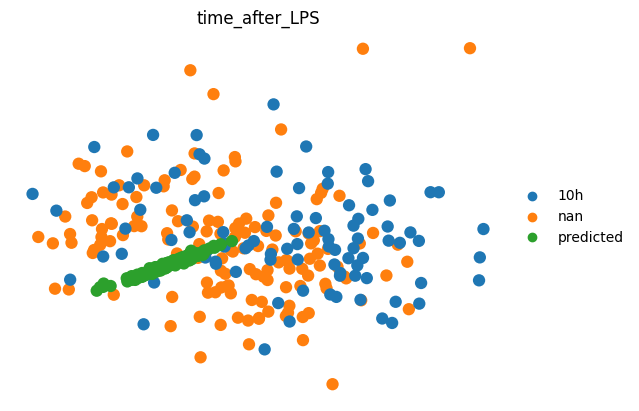

PCA plot created.



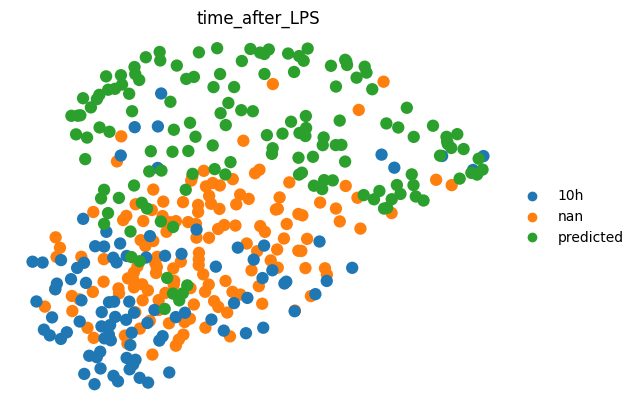

UMAP plot created.

Bootstrapped R²: 0.9422 ± 0.0014


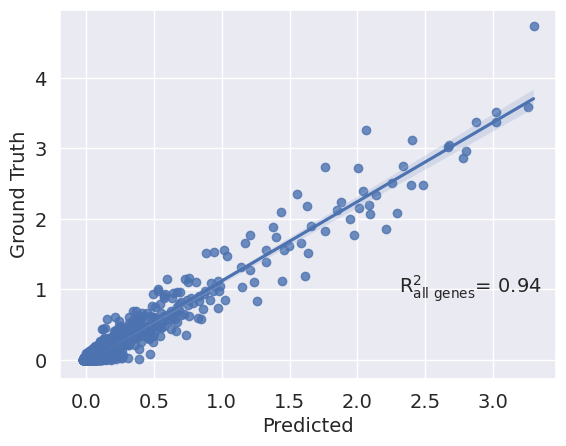

NameError: name 'metric' is not defined

In [43]:
import pandas as pd

results = []

# We’ll loop twice: once for the top-100 DEGs, once for all genes
for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # pick HVGs or all genes
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes          = hvgs if hvgs is not None else norm_data.n_vars,
            remove_conditions    = None,
            subsample_n          = None,
        )
        analysis.prepare_training_set(
            exclude_query = f'({celltype_col} == "{celltype}") & ({condition_col} == "{stim_key}")'
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs = n_epochs,
            batch_size = batch_size,
            accelerator = "gpu",
            devices = 1,
        )
        analysis.make_prediction(
            ctrl_key           = ctrl_key,
            stim_key           = stim_key,
            celltype_to_predict= celltype,
            condition_col      = condition_col,
            cell_type_col      = celltype_col,
        )
        analysis.evaluate_prediction(
            condition_col       = condition_col,
            cell_type_col       = celltype_col,
            control_condition   = ctrl_key,
            stimulated_condition= stim_key,
            celltype_to_evaluate= celltype,
            pca_components      = pca_components,
        )
        analysis.plot_mean_correlation(
            condition_col       = condition_col,
            stimulated_condition= stim_key,
        )

        # stash the results, **including** our Type label
        results.append({
            "celltype_to_predict": celltype,
            "Type"               : gene_label,
            "r2_value"           : analysis.r2_value,
            "r2_std"             : analysis.r2_std,
            "edistance"          : analysis.perturbation_score if metric=="edistance" else None, 
            "mmd"                : analysis.perturbation_score if metric=="mmd" else None,
            "euclidean"          : analysis.perturbation_score if metric=="euclidean" else None
        })

# build the long‐form DataFrame
results_df = pd.DataFrame(results)

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  4.11it/s, v_num=1, train_loss_step=7.65e+3, train_loss_epoch=7.51e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s, v_num=1, train_loss_step=7.65e+3, train_loss_epoch=7.51e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


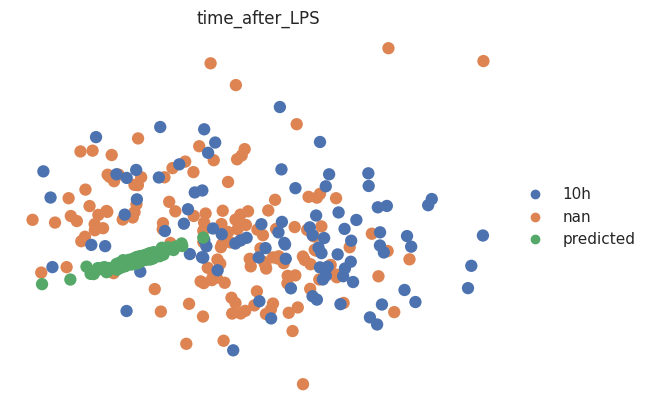

PCA plot created.



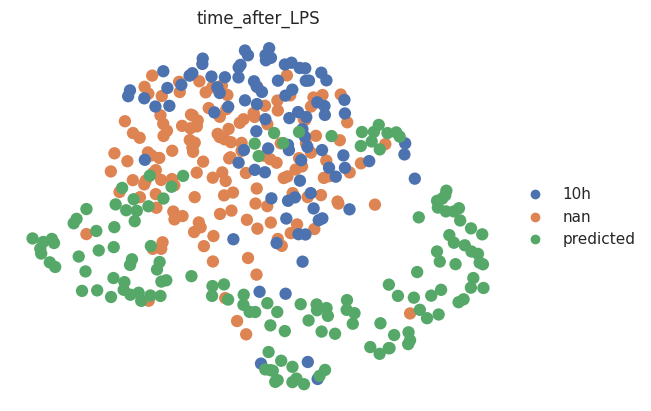

UMAP plot created.

Bootstrapped R²: 0.9314 ± 0.0015


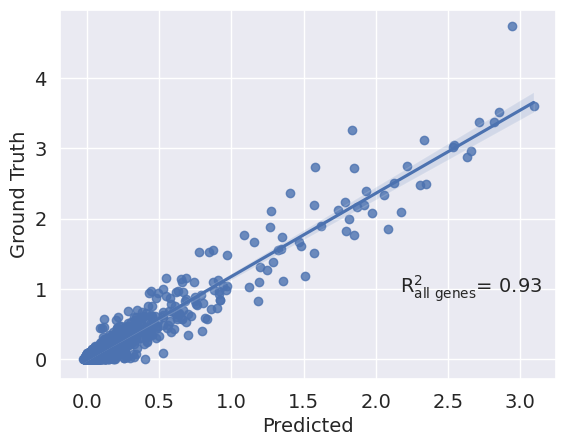

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.6481612418840734

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.6481612160334878

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2838072776794434

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch li

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  4.06it/s, v_num=1, train_loss_step=5.43e+3, train_loss_epoch=7.53e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s, v_num=1, train_loss_step=5.43e+3, train_loss_epoch=7.53e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


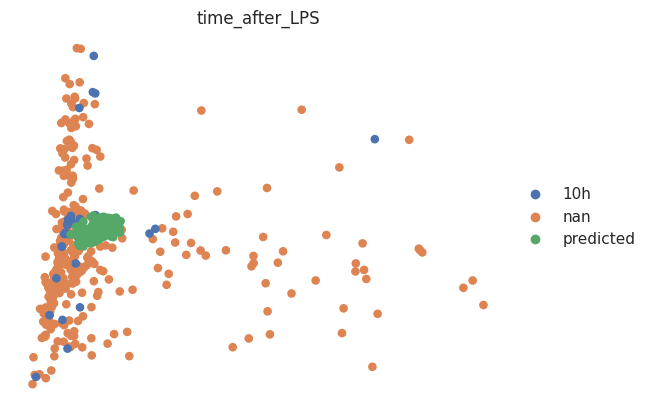

PCA plot created.



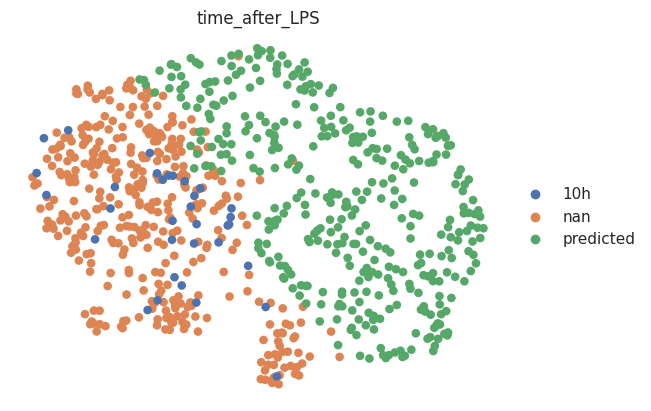

UMAP plot created.

Bootstrapped R²: 0.9291 ± 0.0030


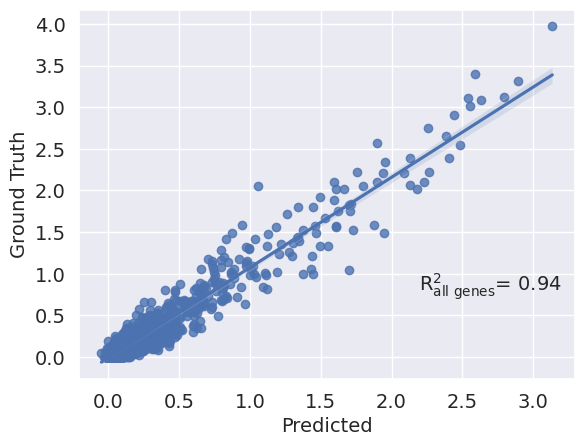

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.2417079692491613

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.2417082614005848

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1143195629119873

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  3.83it/s, v_num=1, train_loss_step=5.8e+3, train_loss_epoch=7.65e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s, v_num=1, train_loss_step=5.8e+3, train_loss_epoch=7.65e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


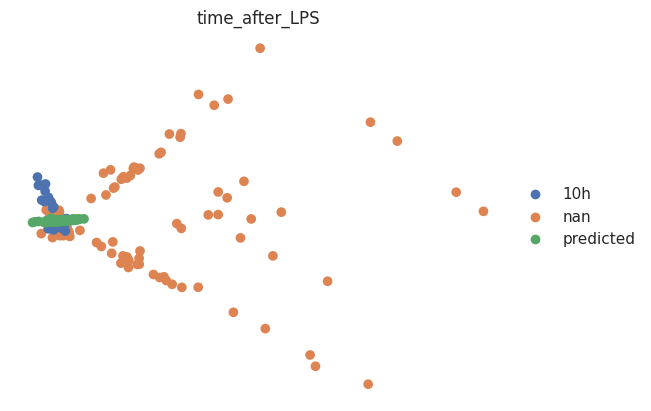

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


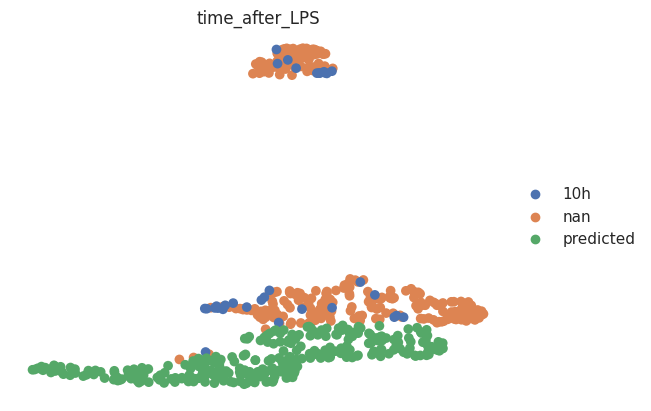

UMAP plot created.

Bootstrapped R²: 0.9365 ± 0.0023


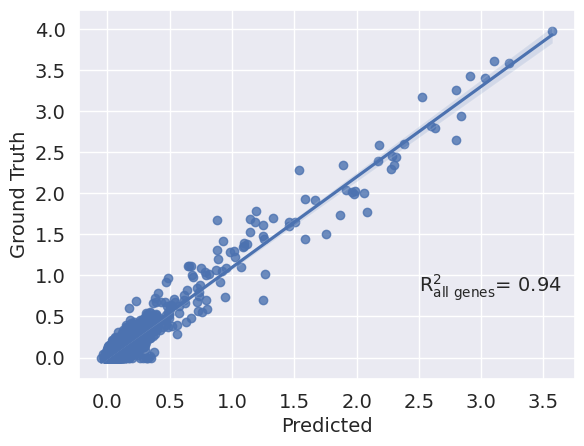

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.4862145296697864

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.4862145914046345

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2191039323806763

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lig

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.97it/s, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=7.56e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=7.56e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


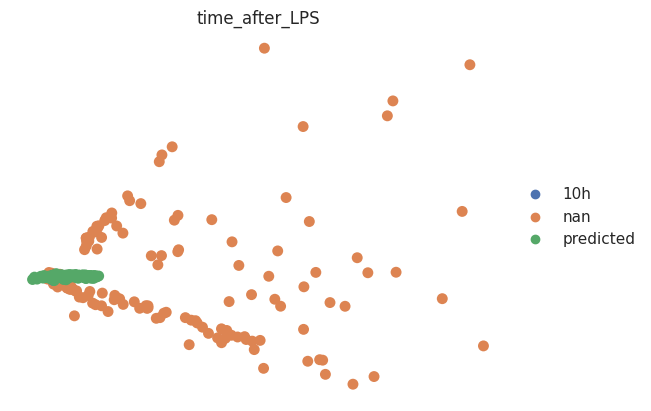

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


PCA plot created.



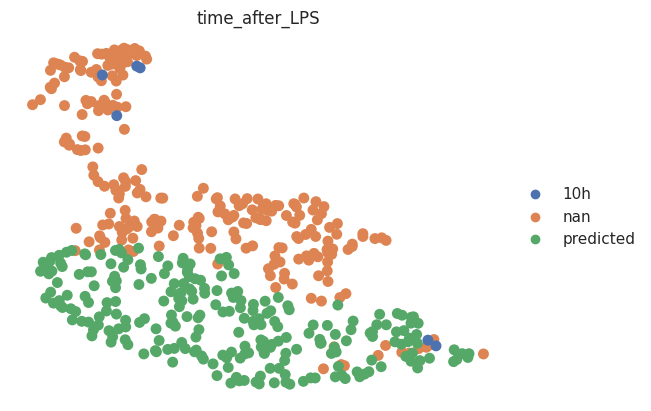

UMAP plot created.

Bootstrapped R²: 0.7715 ± 0.0294


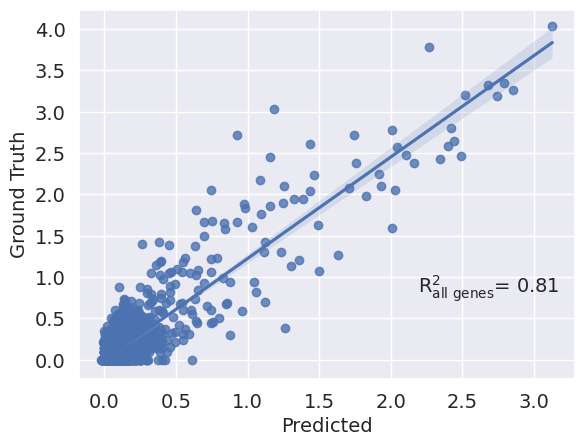

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.1522147239951877

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.152214923290693

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.4670428037643433

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch l

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  3.78it/s, v_num=1, train_loss_step=6.59e+3, train_loss_epoch=7.66e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s, v_num=1, train_loss_step=6.59e+3, train_loss_epoch=7.66e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


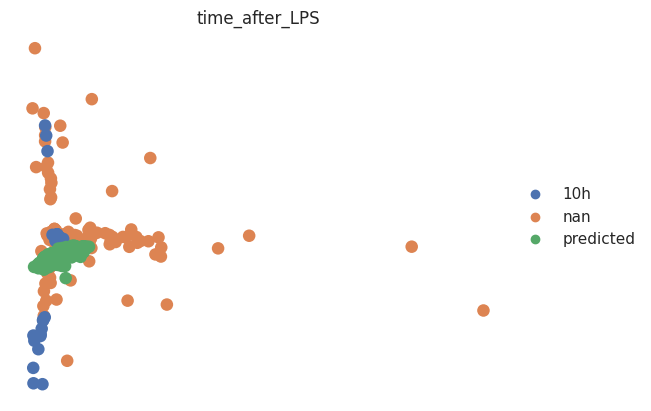

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


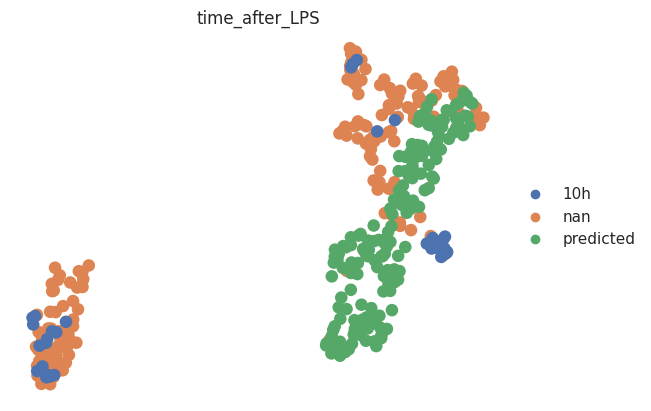

UMAP plot created.

Bootstrapped R²: 0.9208 ± 0.0028


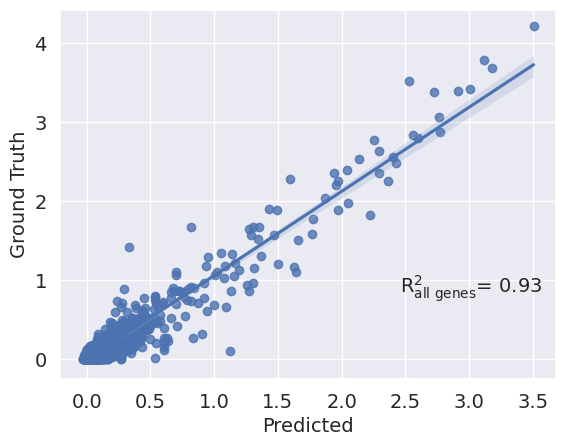

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.0062259504769893

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.006226126770032

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.4164130687713623

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  3.92it/s, v_num=1, train_loss_step=7.31e+3, train_loss_epoch=7.56e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s, v_num=1, train_loss_step=7.31e+3, train_loss_epoch=7.56e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


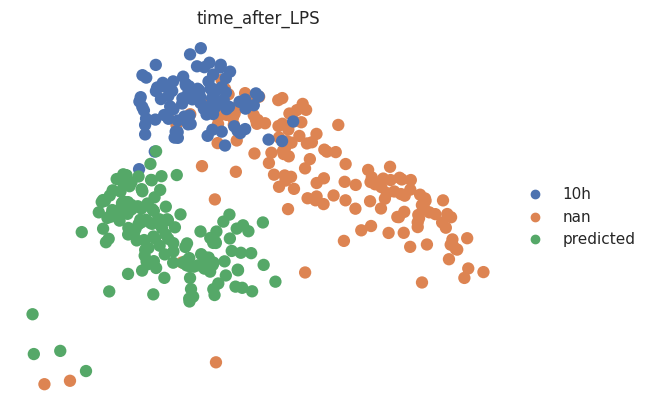

PCA plot created.



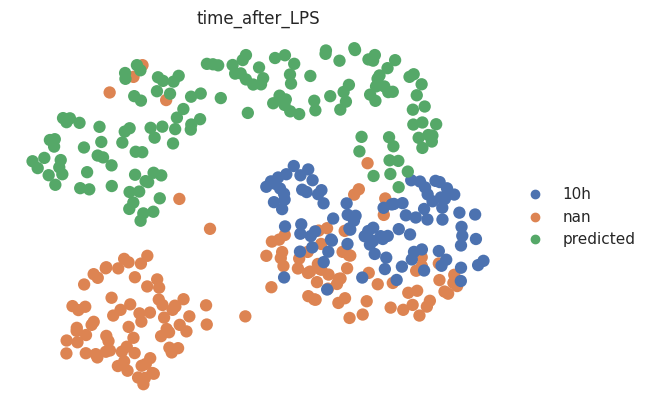

UMAP plot created.

Bootstrapped R²: 0.9557 ± 0.0011


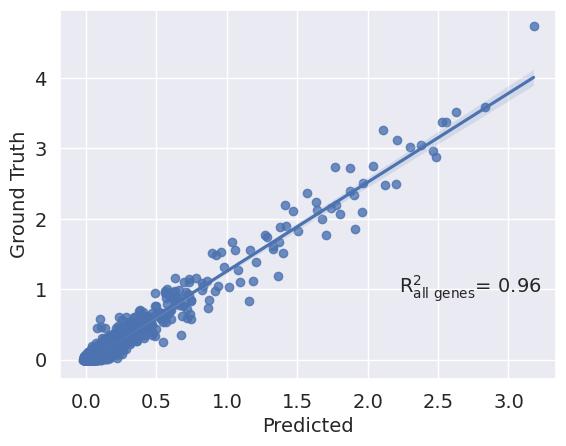

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.8258694638899188

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.8258694447886361

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.9087735414505005

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorc

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.98it/s, v_num=1, train_loss_step=6.17e+3, train_loss_epoch=7.51e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s, v_num=1, train_loss_step=6.17e+3, train_loss_epoch=7.51e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


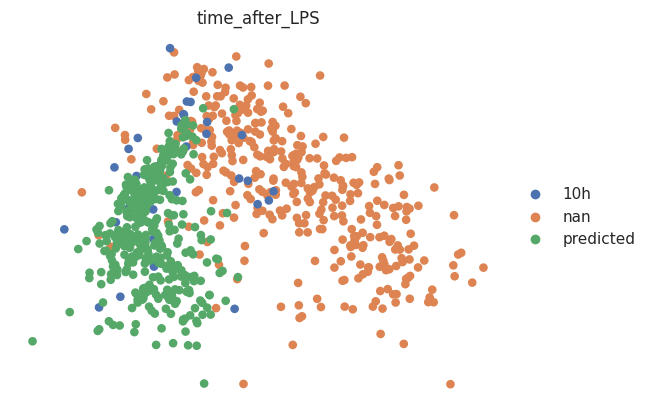

PCA plot created.



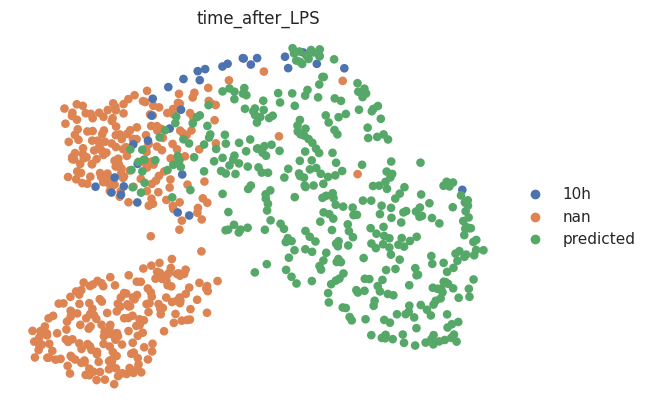

UMAP plot created.

Bootstrapped R²: 0.9303 ± 0.0032


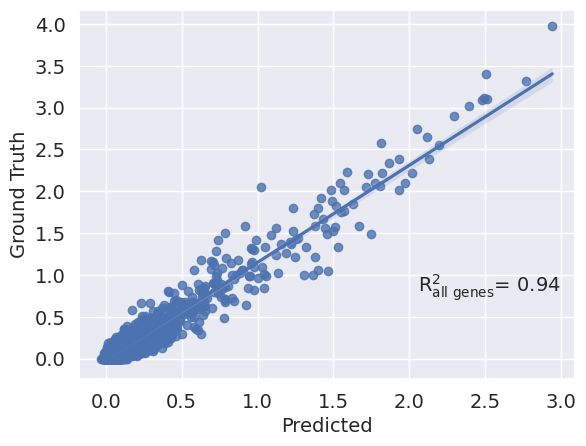

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.0086825421878003

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.0086824780734631

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.0043320655822754

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pyto

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.86it/s, v_num=1, train_loss_step=5.96e+3, train_loss_epoch=7.61e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=5.96e+3, train_loss_epoch=7.61e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


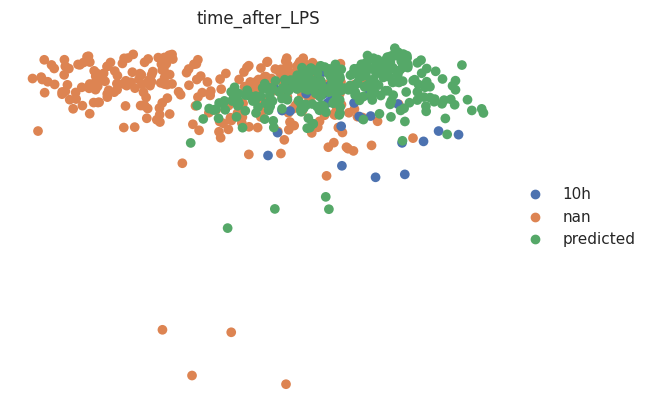

PCA plot created.



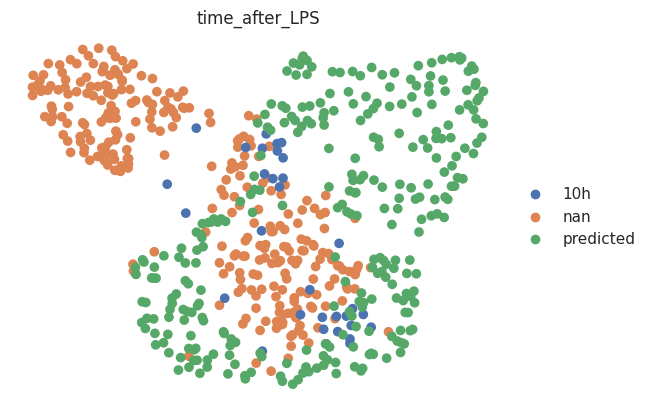

UMAP plot created.

Bootstrapped R²: 0.9407 ± 0.0023


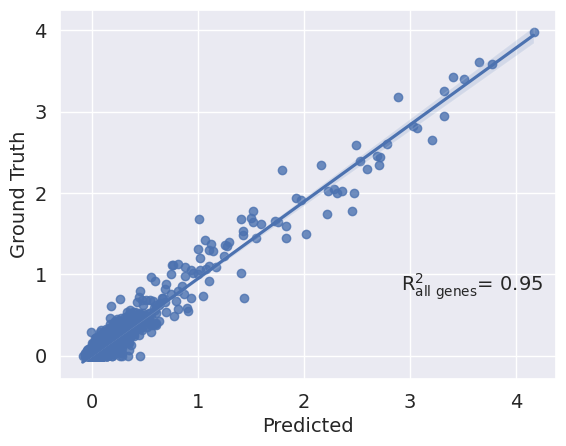

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.3745697781041766

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3745696352130827

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1724201440811157

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.56it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=7.66e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=7.66e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


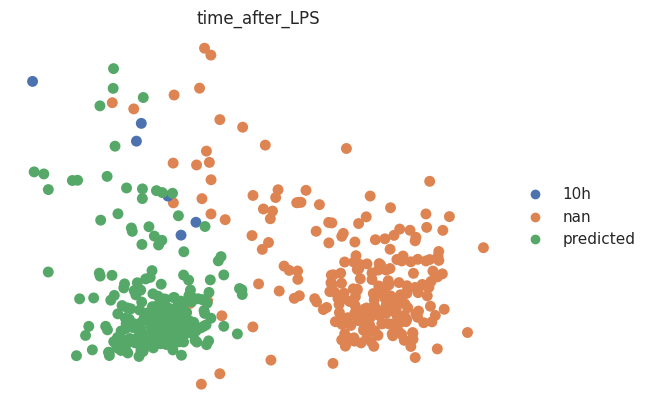

PCA plot created.



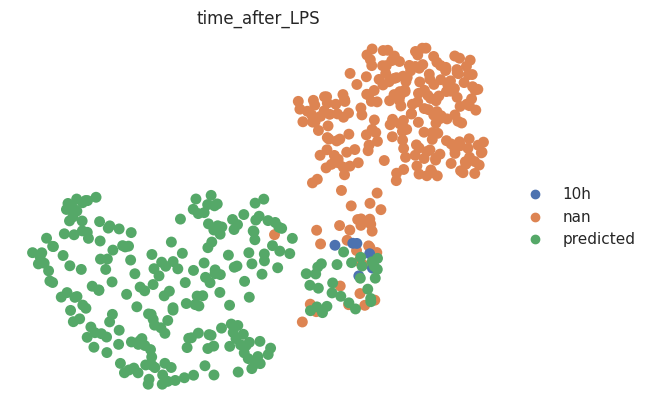

UMAP plot created.

Bootstrapped R²: 0.7691 ± 0.0299


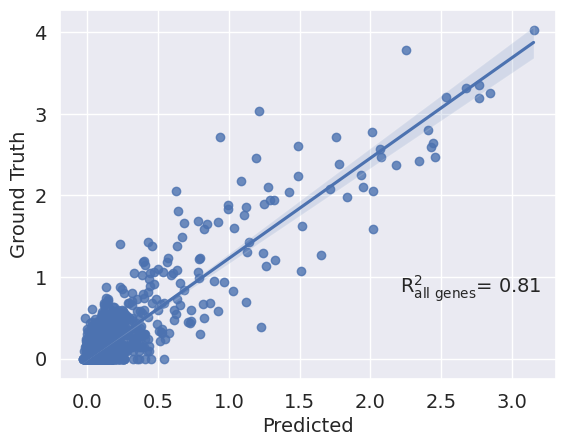

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.9349058232382241

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.9349058723341592

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.3910092115402222

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pyto

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.80it/s, v_num=1, train_loss_step=6.36e+3, train_loss_epoch=7.58e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s, v_num=1, train_loss_step=6.36e+3, train_loss_epoch=7.58e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


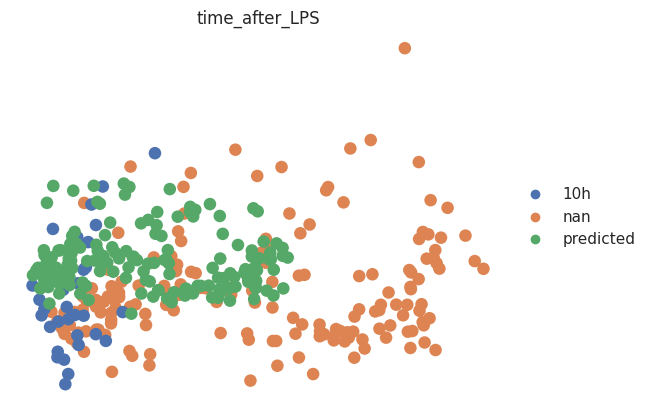

PCA plot created.



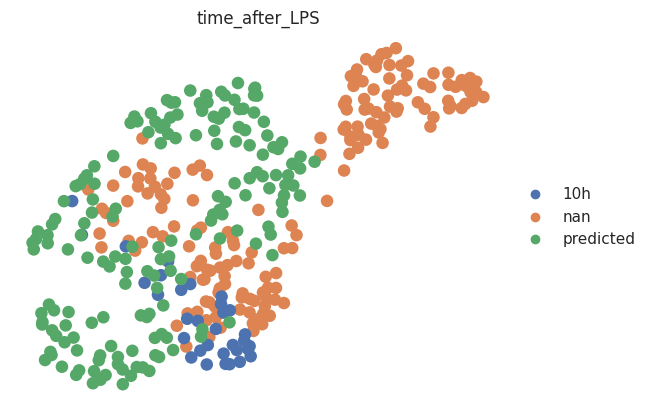

UMAP plot created.

Bootstrapped R²: 0.9253 ± 0.0030


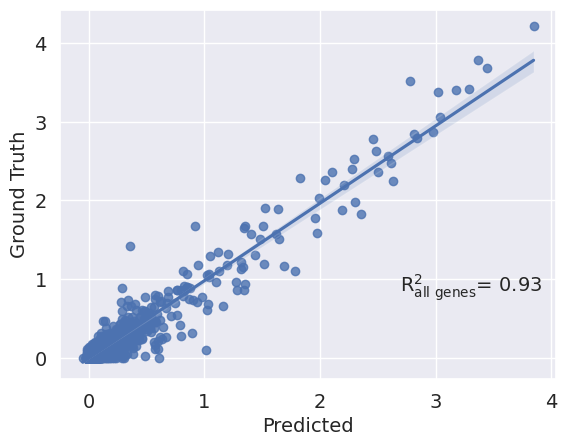

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.3436041541237185

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3436041530932366

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1591392755508423



,celltype_to_predict,Type,r2_value,r2_std,edistance,mmd,euclidean
0,B_naive,top 100 DEGs,0.931425,0.001549,1.648161,1.648161,1.283807
1,NK_16hi,top 100 DEGs,0.929126,0.002962,1.241708,1.241708,1.114320
2,CD4.Naive,top 100 DEGs,0.936478,0.002321,1.486215,1.486215,1.219104
3,CD4.CM,top 100 DEGs,0.771491,0.029428,2.152215,2.152215,1.467043
4,CD8.Naive,top 100 DEGs,0.920754,0.002844,2.006226,2.006226,1.416413
5,B_naive,all genes,0.955705,0.001135,0.825869,0.825869,0.908774
6,NK_16hi,all genes,0.930326,0.003203,1.008683,1.008682,1.004332
7,CD4.Naive,all genes,0.940712,0.002341,1.374570,1.374570,1.172420
8,CD4.CM,all genes,0.769085,0.029935,1.934906,1.934906,1.391009
9,CD8.Naive,all genes,0.925288,0.002977,1.343604,1.343604,1.159139


In [51]:
# Refactored Module 2+3: R² and Distance Metrics in One Pass

import numpy as np
import pandas as pd

results = []

for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # 1️⃣ Preprocess & train
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes          = hvgs if hvgs is not None else norm_data.n_vars,
            remove_conditions    = None,
            subsample_n          = None,
        )
        analysis.prepare_training_set(
            exclude_query=f'({celltype_col} == "{celltype}") & ({condition_col} == "{stim_key}")'
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs=n_epochs, batch_size=batch_size,
            accelerator="gpu", devices=1
        )

        # 2️⃣ Prediction & R²
        analysis.make_prediction(
            ctrl_key=ctrl_key, stim_key=stim_key,
            celltype_to_predict=celltype,
            condition_col=condition_col, cell_type_col=celltype_col
        )
        analysis.evaluate_prediction(
            condition_col=condition_col, cell_type_col=celltype_col,
            control_condition=ctrl_key, stimulated_condition=stim_key,
            celltype_to_evaluate=celltype, pca_components=pca_components
        )
        analysis.plot_mean_correlation(
            condition_col=condition_col, stimulated_condition=stim_key
        )
        r2_mean, r2_sd = analysis.r2_value, analysis.r2_std

        # 3️⃣ Distance metrics
        dist_scores = {}
        for metric_name in ["edistance", "mmd", "euclidean"]:
            analysis.compute_distance_metric(
                condition_col=condition_col,
                control_condition=ctrl_key,
                stimulated_condition=stim_key,
                pca_components=pca_components,
                metric=metric_name
            )
            dist_scores[metric_name] = analysis.perturbation_score

        # 4️⃣ Record results
        row = {
            "celltype_to_predict": celltype,
            "Type": gene_label,
            "r2_value": r2_mean,
            "r2_std": r2_sd
        }
        row.update(dist_scores)
        results.append(row)

results_df = pd.DataFrame(results)
results_df

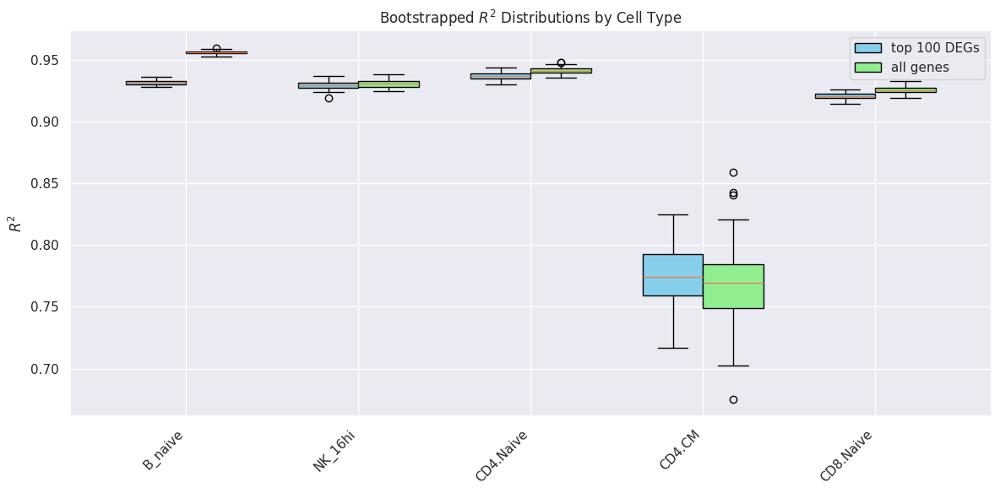

In [52]:
simulations = []
for _, row in results_df.iterrows():
    for _ in range(100):
        simulations.append({
            "Cell Type": row["celltype_to_predict"],
            "Type"     : row["Type"],
            "R2"       : np.random.normal(row["r2_value"], row["r2_std"])
        })
sim_df = pd.DataFrame(simulations)

# 2) Prepare boxplot data
cell_types = results_df['celltype_to_predict'].unique()
positions = np.arange(len(cell_types))
width = 0.35

data_top100 = [sim_df[(sim_df['Cell Type']==ct) & (sim_df['Type']=='top 100 DEGs')]['R2']
               for ct in cell_types]
data_all    = [sim_df[(sim_df['Cell Type']==ct) & (sim_df['Type']=='all genes')]['R2']
               for ct in cell_types]

# 3) Plot side-by-side boxplots
fig, ax = plt.subplots(figsize=(12,6))
b1 = ax.boxplot(data_top100, positions=positions - width/2, widths=width, patch_artist=True)
b2 = ax.boxplot(data_all,    positions=positions + width/2, widths=width, patch_artist=True)

# 4) Style
for box in b1['boxes']:
    box.set(facecolor='skyblue')
for box in b2['boxes']:
    box.set(facecolor='lightgreen')

ax.set_xticks(positions)
ax.set_xticklabels(cell_types, rotation=45, ha='right')
ax.set_ylabel(r'$R^2$')
ax.set_title('Bootstrapped $R^2$ Distributions by Cell Type')
ax.legend([b1["boxes"][0], b2["boxes"][0]], ['top 100 DEGs','all genes'], loc='upper right')
plt.tight_layout()
plt.show()

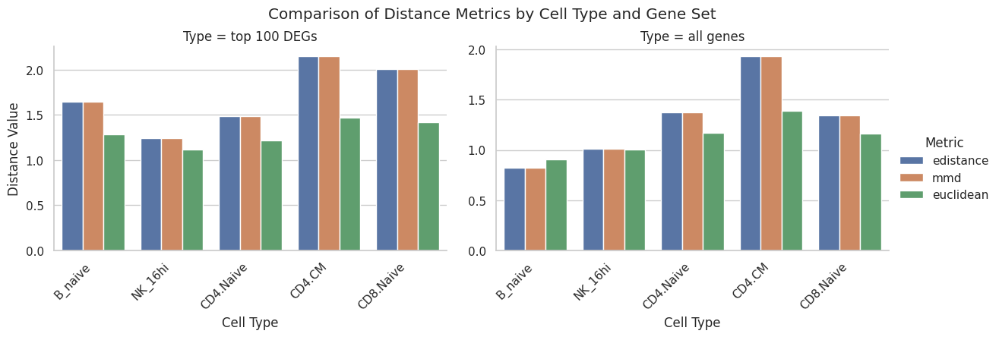

In [53]:
# 1) Melt the distance metrics into long form
dist_df = results_df.melt(
    id_vars=['celltype_to_predict', 'Type'],
    value_vars=['edistance', 'mmd', 'euclidean'],
    var_name='Metric',
    value_name='Distance'
)

# 2) Plot barplots faceted by gene-set (Type)
sns.set(style="whitegrid")
g = sns.catplot(
    data=dist_df,
    x='celltype_to_predict',
    y='Distance',
    hue='Metric',
    col='Type',
    kind='bar',
    height=4,
    aspect=1.5,
    sharey=False
)

# 3) Styling
g.set_axis_labels("Cell Type", "Distance Value")
g.set_xticklabels(rotation=45, ha="right")
g._legend.set_title("Metric")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("Comparison of Distance Metrics by Cell Type and Gene Set")

plt.show()

We will try to introduce the distance metrics provided by pertpy that are giving a statistically significant flavor on the distance metrics calculated:

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.79it/s, v_num=1, train_loss_step=6.9e+3, train_loss_epoch=7.55e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=6.9e+3, train_loss_epoch=7.55e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


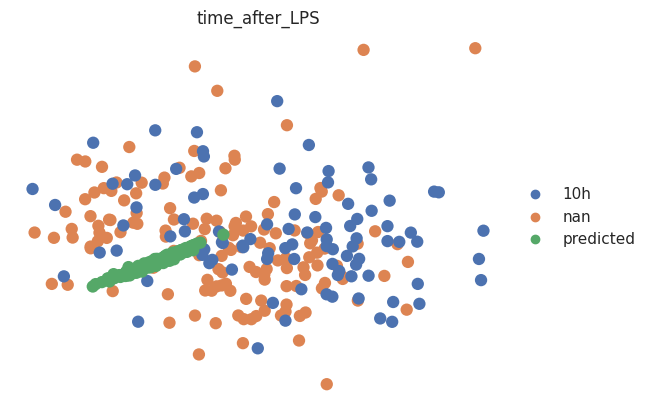

PCA plot created.



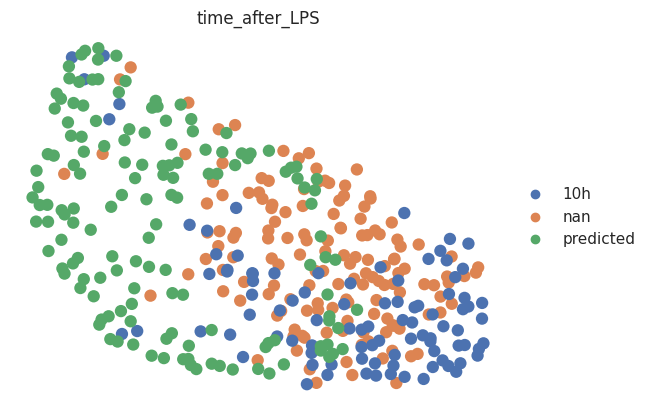

UMAP plot created.

Bootstrapped R²: 0.9352 ± 0.0016


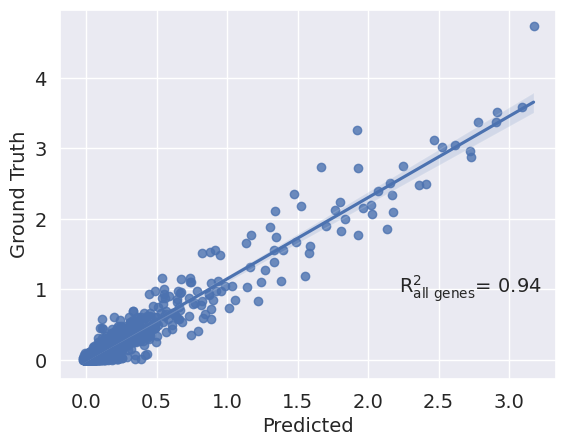

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.8504385664322853



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.8504385851067413



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.360308289527893



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.69it/s, v_num=1, train_loss_step=5.52e+3, train_loss_epoch=7.51e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=5.52e+3, train_loss_epoch=7.51e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


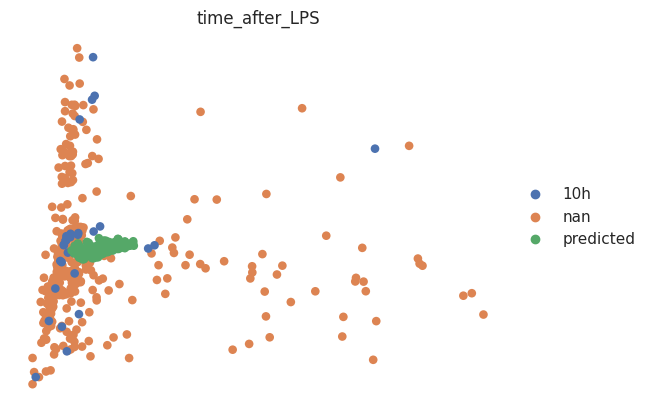

PCA plot created.



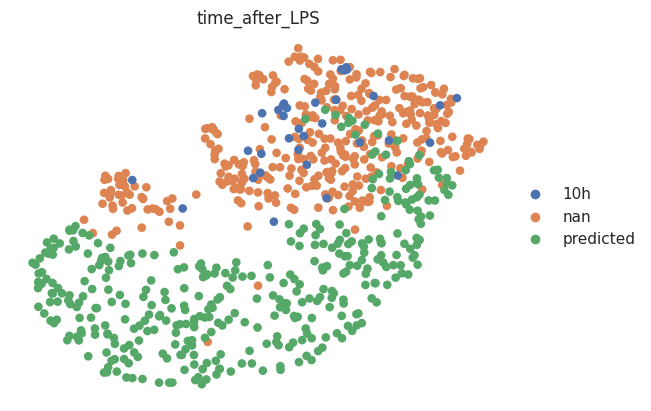

UMAP plot created.

Bootstrapped R²: 0.9286 ± 0.0035


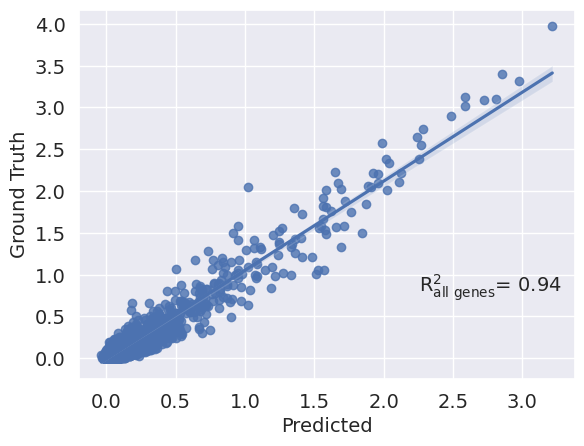

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.852809596757985



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.852809470969921



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.689026117324829



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  3.82it/s, v_num=1, train_loss_step=6.14e+3, train_loss_epoch=7.64e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s, v_num=1, train_loss_step=6.14e+3, train_loss_epoch=7.64e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


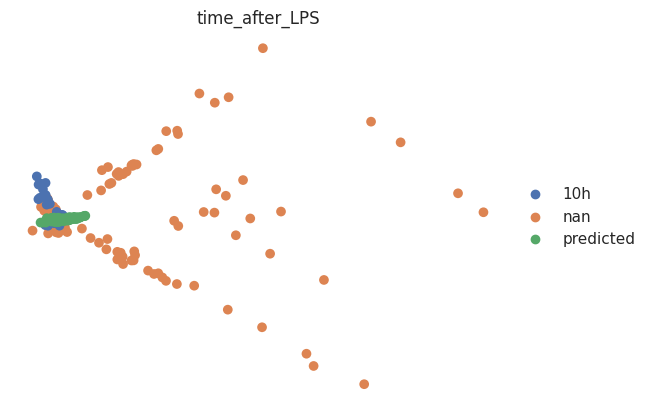

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


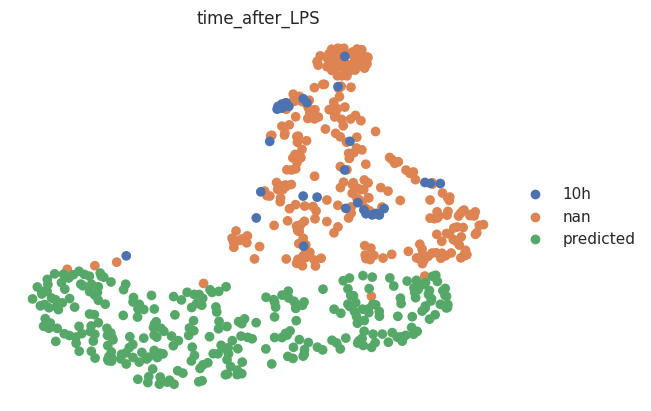

UMAP plot created.

Bootstrapped R²: 0.9407 ± 0.0021


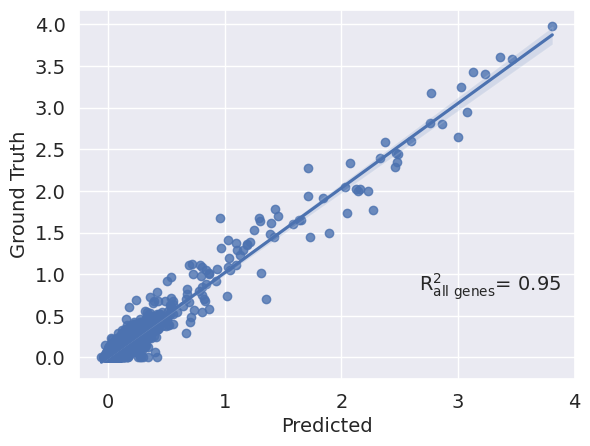

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.2941302873132083



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.2941303319437223



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.5146392583847046



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  3.76it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=7.62e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=7.62e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


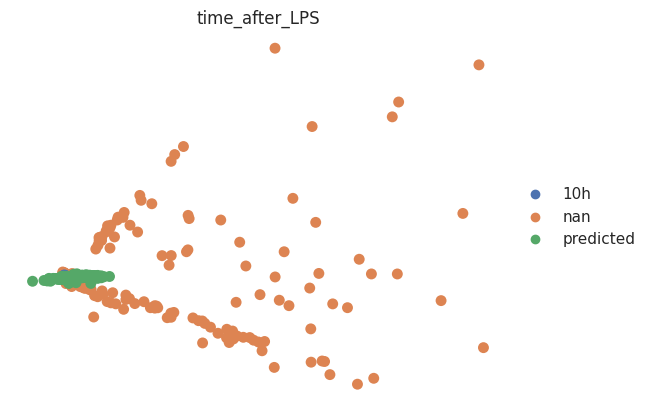

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


PCA plot created.



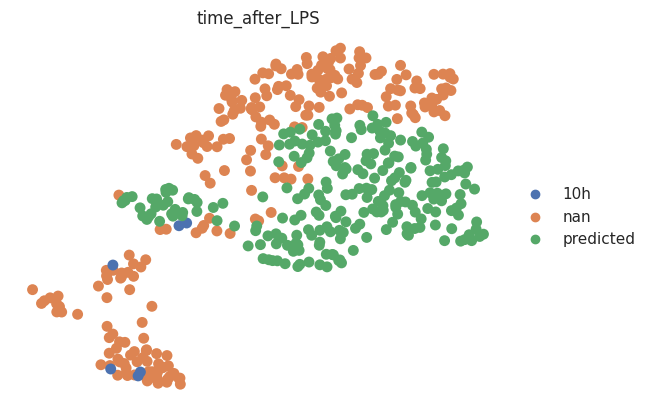

UMAP plot created.

Bootstrapped R²: 0.7869 ± 0.0286


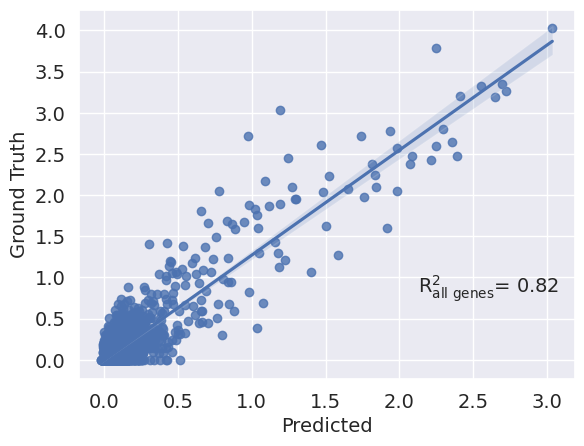

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.7101772739615708



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.7101773466562644



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.3077378273010254



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.70it/s, v_num=1, train_loss_step=6.25e+3, train_loss_epoch=7.65e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=6.25e+3, train_loss_epoch=7.65e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


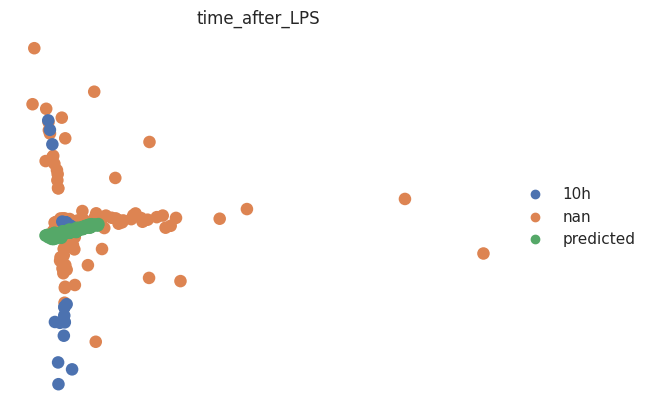

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


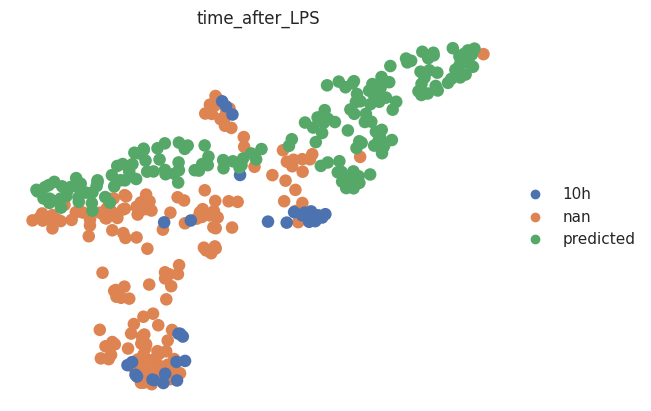

UMAP plot created.

Bootstrapped R²: 0.9279 ± 0.0027


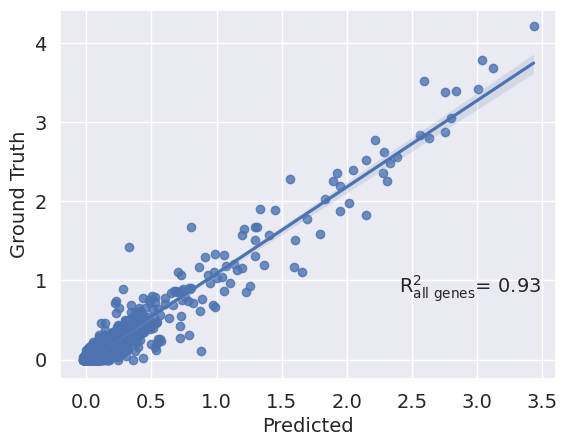

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.9035150553638047



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.903514852571806



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.7039703130722046



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.94it/s, v_num=1, train_loss_step=7.51e+3, train_loss_epoch=7.55e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=7.51e+3, train_loss_epoch=7.55e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


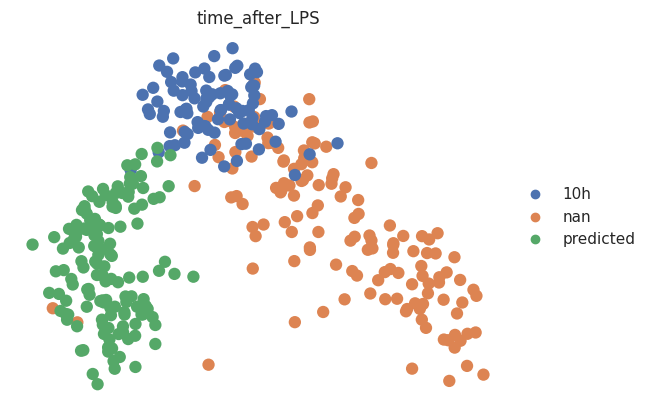

PCA plot created.



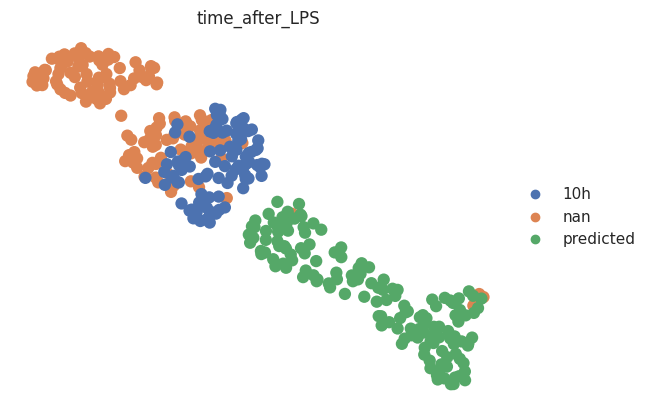

UMAP plot created.

Bootstrapped R²: 0.9139 ± 0.0019


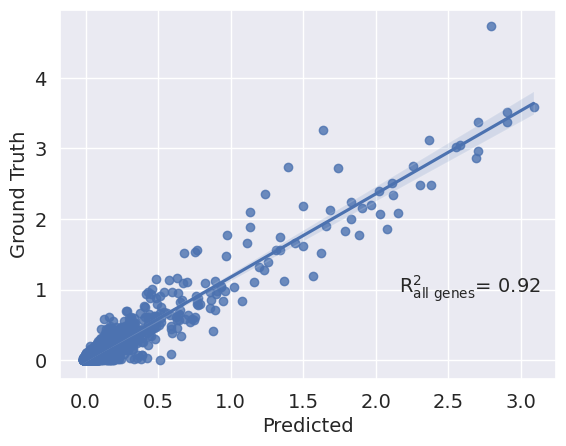

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.8820581461898611



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.8820581282580707



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.9391793608665466



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  3.80it/s, v_num=1, train_loss_step=5.78e+3, train_loss_epoch=7.51e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s, v_num=1, train_loss_step=5.78e+3, train_loss_epoch=7.51e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


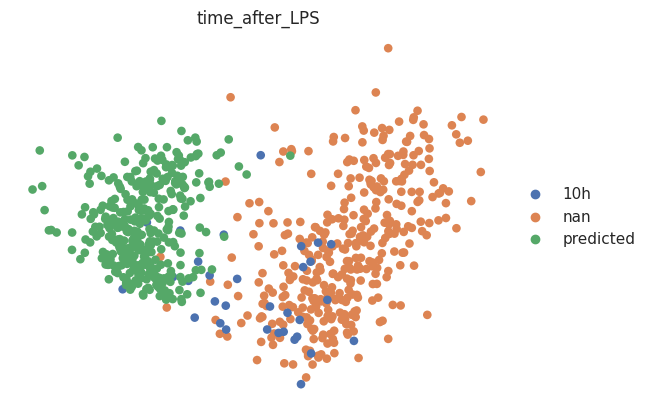

PCA plot created.



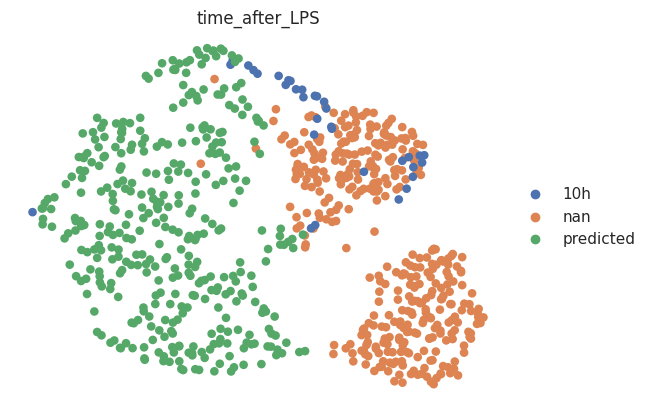

UMAP plot created.

Bootstrapped R²: 0.9256 ± 0.0025


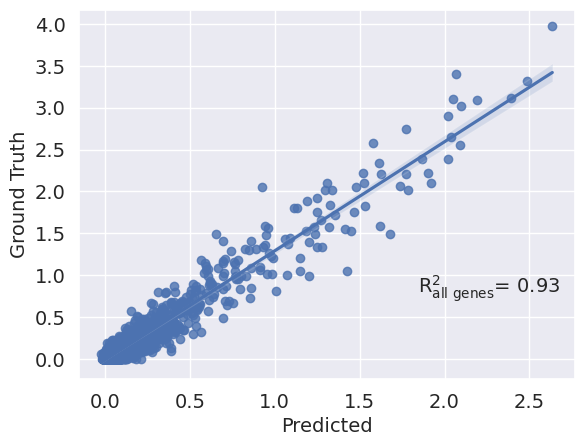

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.8335550726414392



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.8335551323347345



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.9129921793937683



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.94it/s, v_num=1, train_loss_step=6.4e+3, train_loss_epoch=7.56e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=6.4e+3, train_loss_epoch=7.56e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


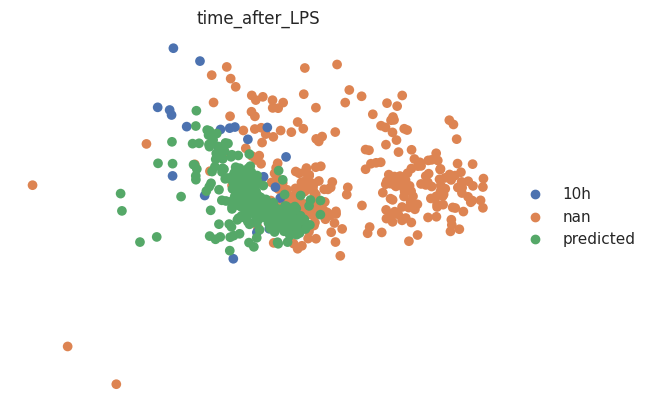

PCA plot created.



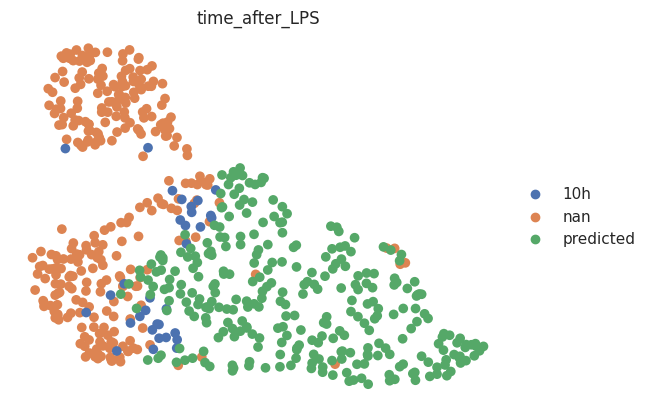

UMAP plot created.

Bootstrapped R²: 0.9392 ± 0.0022


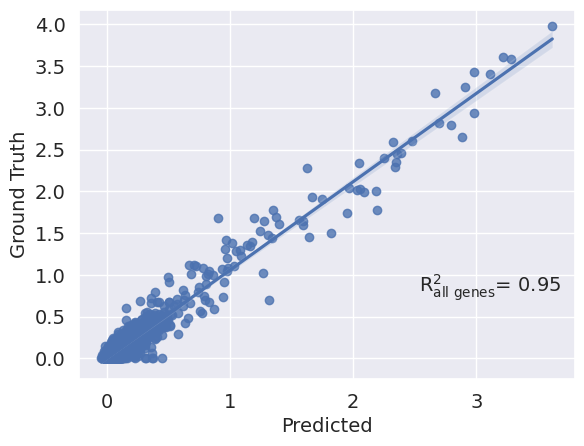

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.4477573906587777



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.447757447152272



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2032281160354614



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.69it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=7.65e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=1.32e+3, train_loss_epoch=7.65e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


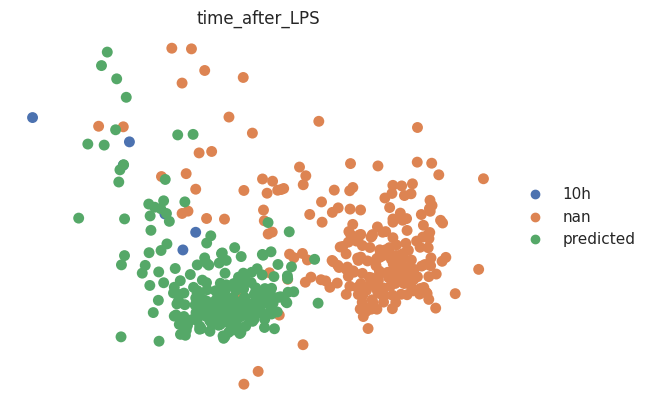

PCA plot created.



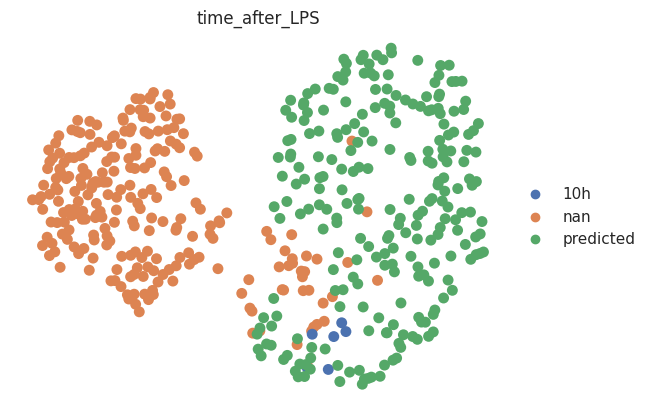

UMAP plot created.

Bootstrapped R²: 0.7699 ± 0.0286


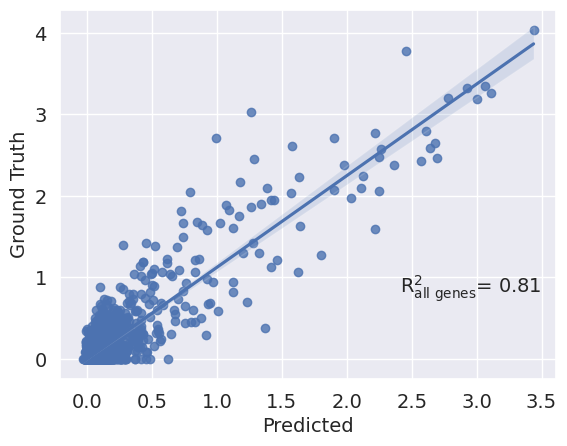

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.473369279522309



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.4733693002996713



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.5726948976516724



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.82it/s, v_num=1, train_loss_step=5.52e+3, train_loss_epoch=7.61e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=5.52e+3, train_loss_epoch=7.61e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


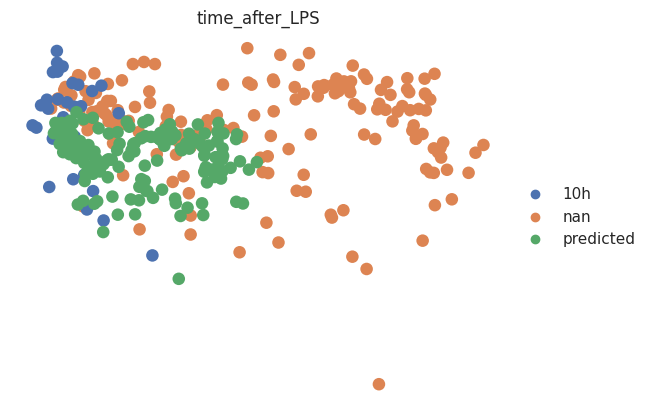

PCA plot created.



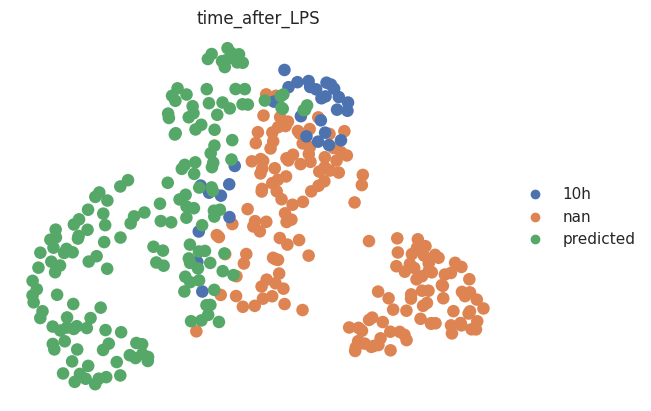

UMAP plot created.

Bootstrapped R²: 0.9288 ± 0.0028


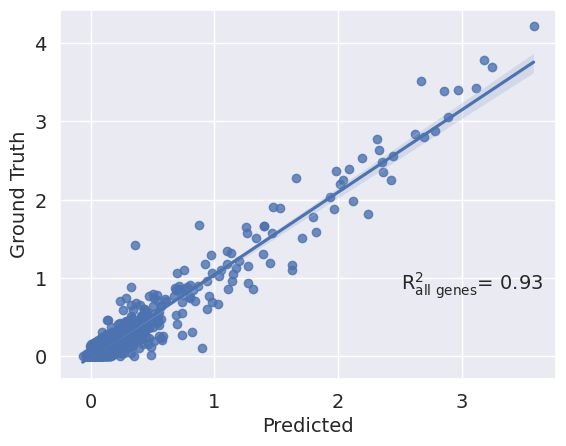

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.0189075143795459



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.0189074540325016



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Computing distance metric...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.0094095468521118



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

,celltype_to_predict,Type,r2_value,r2_std,edistance,mmd,euclidean,edistance_pval,edistance_significant,mmd_pval,mmd_significant,euclidean_pval,euclidean_significant
0,B_naive,top 100 DEGs,0.935208,0.001575,1.850439,1.850439,1.360308,0.002997,True,0.002997,True,0.002997,True
1,NK_16hi,top 100 DEGs,0.928635,0.003482,2.852810,2.852809,1.689026,0.002997,True,0.002997,True,0.002997,True
2,CD4.Naive,top 100 DEGs,0.940704,0.002120,2.294130,2.294130,1.514639,0.002997,True,0.002997,True,0.002997,True
3,CD4.CM,top 100 DEGs,0.786891,0.028607,1.710177,1.710177,1.307738,0.002997,True,0.002997,True,0.002997,True
4,CD8.Naive,top 100 DEGs,0.927920,0.002669,2.903515,2.903515,1.703970,0.002997,True,0.002997,True,0.002997,True
5,B_naive,all genes,0.913879,0.001903,0.882058,0.882058,0.939179,0.002997,True,0.002997,True,0.002997,True
6,NK_16hi,all genes,0.925592,0.002504,0.833555,0.833555,0.912992,0.002997,True,0.002997,True,0.002997,True
7,CD4.Naive,all genes,0.939230,0.002230,1.447757,1.447757,1.203228,0.002997,True,0.002997,True,0.002997,True
8,CD4.CM,all genes,0.769860,0.028624,2.473369,2.473369,1.572695,0.002997,True,0.002997,True,0.002997,True
9,CD8.Naive,all genes,0.928837,0.002783,1.018908,1.018907,1.009410,0.002997,True,0.002997,True,0.002997,True


In [56]:

results = []

for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # 1️⃣ Preprocess & train
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes           = hvgs if hvgs is not None else norm_data.n_vars,
            remove_conditions     = None,
            subsample_n           = None,
        )
        analysis.prepare_training_set(
            exclude_query=f'({celltype_col} == "{celltype}") & ({condition_col} == "{stim_key}")'
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs=n_epochs, batch_size=batch_size,
            accelerator="gpu", devices=1
        )

        # 2️⃣ Prediction & R²
        analysis.make_prediction(
            ctrl_key=ctrl_key, stim_key=stim_key,
            celltype_to_predict=celltype,
            condition_col=condition_col, cell_type_col=celltype_col
        )
        analysis.evaluate_prediction(
            condition_col=condition_col, cell_type_col=celltype_col,
            control_condition=ctrl_key, stimulated_condition=stim_key,
            celltype_to_evaluate=celltype, pca_components=pca_components
        )
        analysis.plot_mean_correlation(
            condition_col=condition_col, stimulated_condition=stim_key
        )
        r2_mean, r2_sd = analysis.r2_value, analysis.r2_std

        # 3️⃣ Distance metrics + permutation test
        # ensure PCA embedding exists
        sc.pp.pca(analysis.eval_adata, n_comps=pca_components)

        dist_scores = {}
        pvals       = {}
        signif      = {}

        for metric_name in ["edistance", "mmd", "euclidean"]:
            # compute raw distance
            analysis.compute_distance_metric(
                condition_col=condition_col,
                control_condition=ctrl_key,
                stimulated_condition=stim_key,
                pca_components=pca_components,
                metric=metric_name
            )
            dist_scores[metric_name] = analysis.perturbation_score

            # run permutation test
            etest = pt.tl.DistanceTest(
                metric_name,
                n_perms=1000,
                obsm_key="X_pca",
                alpha=0.05
            )
            tab = etest(
                analysis.eval_adata,
                groupby=condition_col,
                contrast=ctrl_key
            )
            # extract the row for "predicted"
            row_pred = tab.loc["predicted"]
            pvals[metric_name]  = float(row_pred["pvalue_adj"])
            signif[metric_name] = bool(row_pred["significant_adj"])

        # 4️⃣ Record results
        row = {
            "celltype_to_predict": celltype,
            "Type":                gene_label,
            "r2_value":            r2_mean,
            "r2_std":              r2_sd
        }
        # add raw distances
        row.update(dist_scores)
        # add p-values & significance
        for m in ["edistance", "mmd", "euclidean"]:
            row[f"{m}_pval"]       = pvals[m]
            row[f"{m}_significant"] = signif[m]

        results.append(row)

results_df = pd.DataFrame(results)
results_df


## Module 1b: Introducing more metrics

| Metric                                | What It Measures                                                                                  | Significance for Extrapolation to Unseen Events                                                                 |
|---------------------------------------|---------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------------------------|
| **Mean Squared Error (MSE)**          | The average of the squared differences between predicted and true expression values.               | Sensitive to large errors—if a model wildly mis-predicts novel cell states, MSE will spike, flagging poor extrapolation. |
| **Root MSE (RMSE)**                   | The square root of MSE, bringing the error back into the original expression units.                | Easier to interpret magnitude of error on unseen perturbations, making model comparisons more intuitive.         |
| **Mean Absolute Error (MAE)**         | The average of the absolute differences between predictions and observations.                      | Less sensitive to outliers, so it indicates whether the model’s “typical” error on new cell types remains small. |
| **L₂ Norm**                           | Euclidean length of the error vector (√∑(yi−ŷi)²).                                                  | Captures total error magnitude across all genes; large L₂ on held-out cell types signals systematic extrapolation failure. |
| **R² (Coefficient of Determination)** | Fraction of variance in real data explained by the model (1–RSS/TSS).                             | Shows whether the model still explains meaningful variance when pushed to predict entirely unseen conditions.    |
| **Pearson Correlation**               | Linear correlation between predicted and true expression profiles across genes.                    | If high on novel cell states, indicates the model correctly captures relative up/down trends under new perturbations. |
| **Cosine Similarity**                 | Angle-based similarity between prediction and truth vectors (yi·ŷi / ‖yi‖‖ŷi‖).                       | Reflects whether the “direction” of the perturbation response is preserved, even if magnitudes differ on unseen data. |
| **E-distance**                        | Average squared Euclidean distance between two cell-state distributions (control vs perturbed).    | Quantifies global population shift; large E-distance paves way to test significance of extrapolated perturbation effects. |
| **MMD (Maximum Mean Discrepancy)**    | Kernel-based measure of discrepancy between predicted and real distributions.                     | Sensitive to distribution-level differences; a tool to detect when the model fails to recapitulate unseen population heterogeneity. |
| **Euclidean Distance (in PCA space)** | Direct distance between mean embeddings of predicted vs real perturbed cells.                     | Simple measure of population-level shift—if small on unseen perturbations, suggests good extrapolation of latent trajectories. |


Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  4.00it/s, v_num=1, train_loss_step=6.68e+3, train_loss_epoch=7.55e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s, v_num=1, train_loss_step=6.68e+3, train_loss_epoch=7.55e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


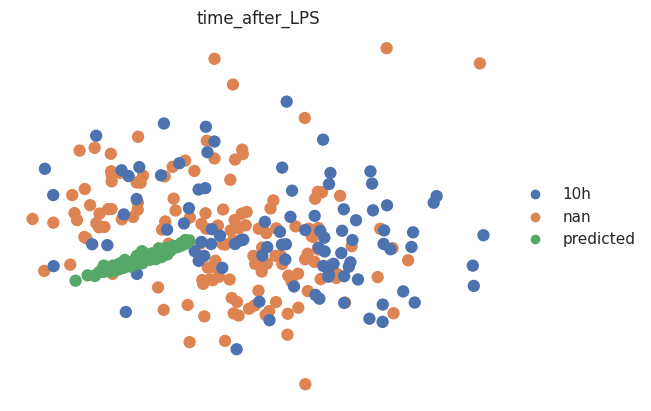

PCA plot created.



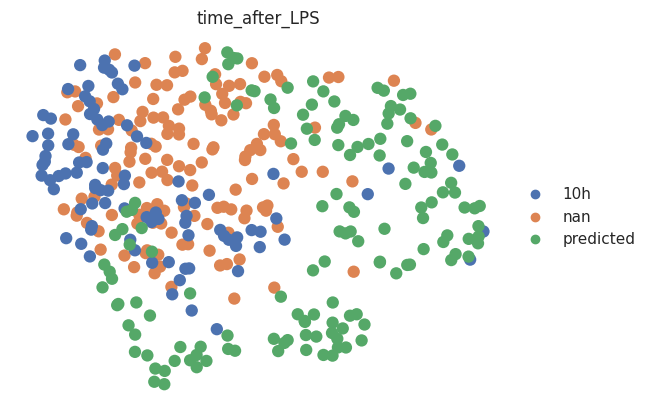

UMAP plot created.

Bootstrapped R²: 0.9305 ± 0.0014


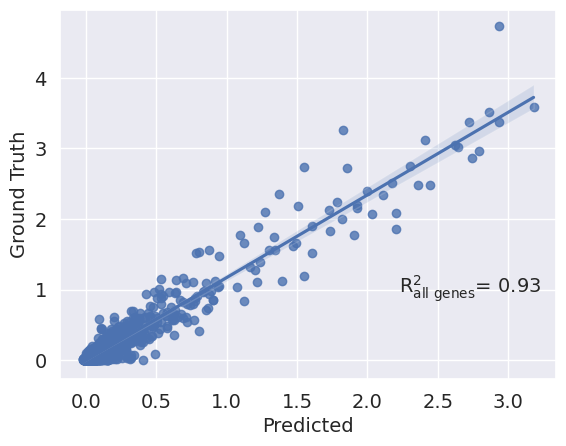

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.6302567276182023

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.6302567108781587

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2768150568008423

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch li

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.81it/s, v_num=1, train_loss_step=6.08e+3, train_loss_epoch=7.55e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=6.08e+3, train_loss_epoch=7.55e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


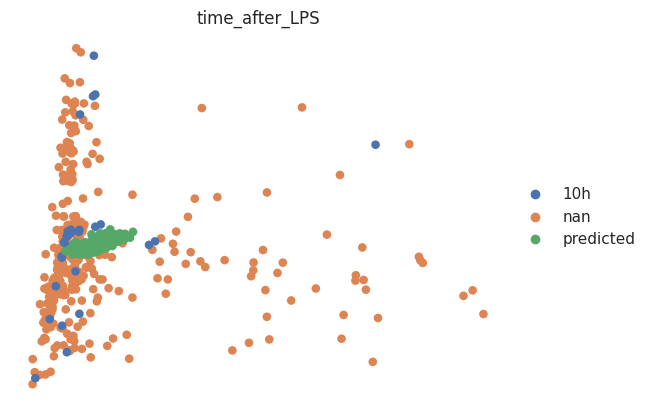

PCA plot created.



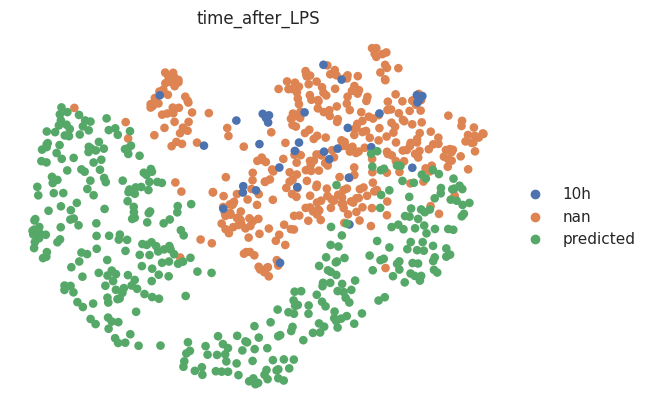

UMAP plot created.

Bootstrapped R²: 0.9276 ± 0.0033


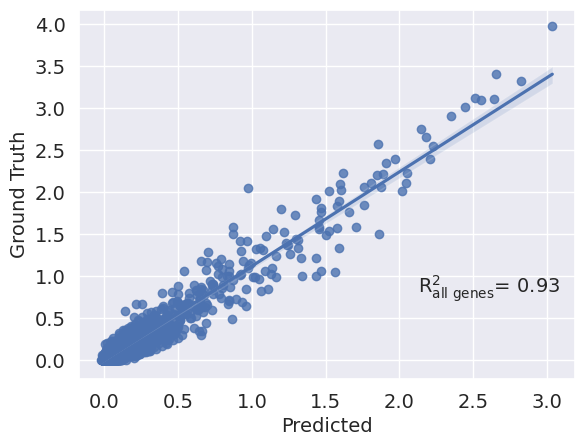

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.9731983052118414

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.973198163374655

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.4047058820724487

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch l

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.88it/s, v_num=1, train_loss_step=6.45e+3, train_loss_epoch=7.59e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s, v_num=1, train_loss_step=6.45e+3, train_loss_epoch=7.59e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


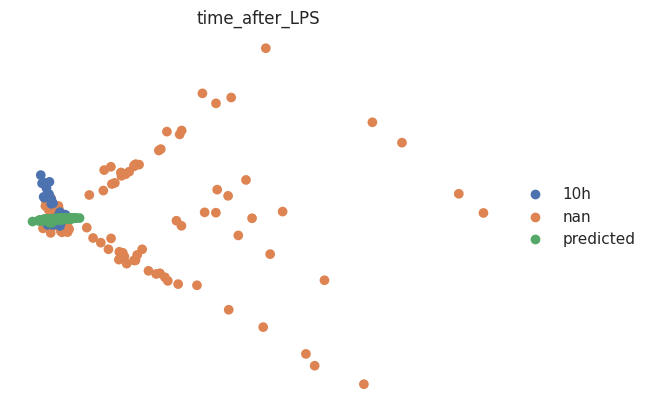

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


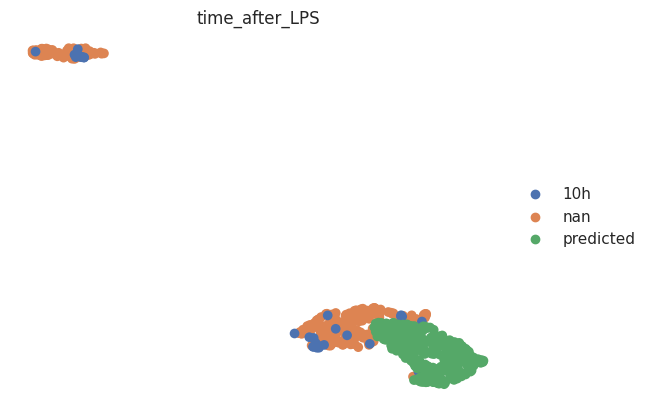

UMAP plot created.

Bootstrapped R²: 0.9381 ± 0.0024


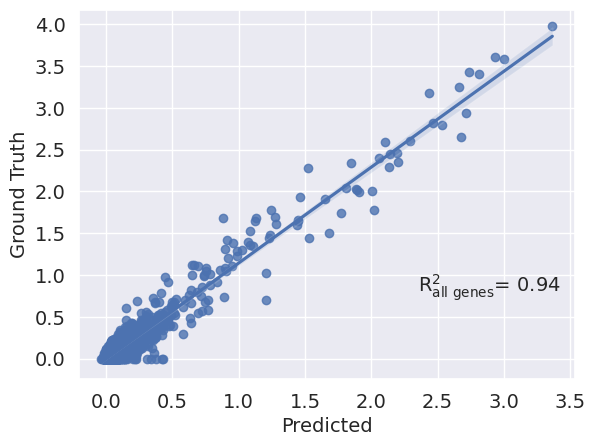

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.7599163687581687

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.7599161514430974

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.3266184329986572

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lig

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.80it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=7.68e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s, v_num=1, train_loss_step=1.25e+3, train_loss_epoch=7.68e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


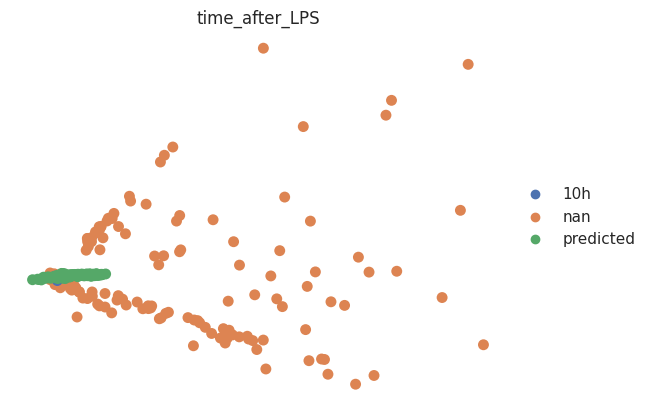

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


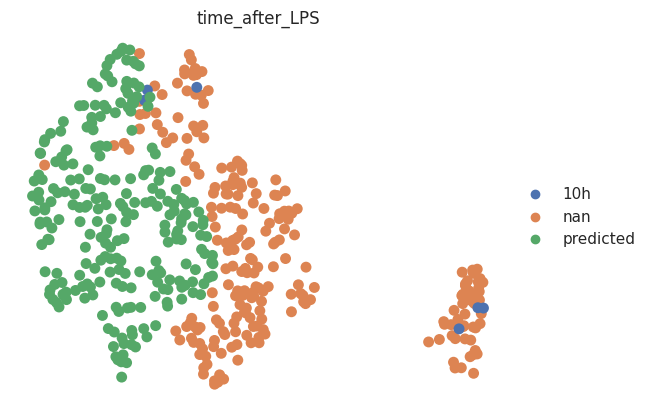

UMAP plot created.

Bootstrapped R²: 0.7654 ± 0.0314


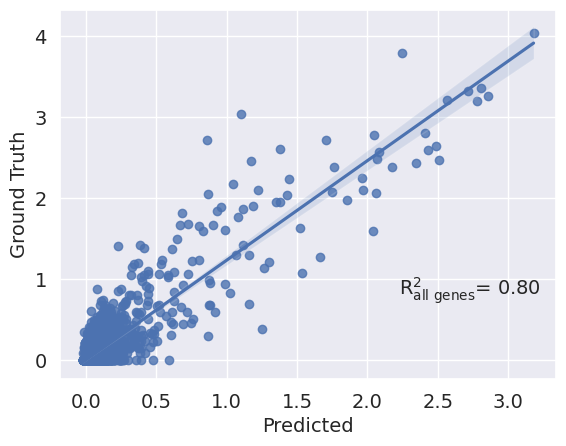

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.2629883111663798

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.2629885110571877

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.504323124885559

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch l

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.75it/s, v_num=1, train_loss_step=6.11e+3, train_loss_epoch=7.64e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s, v_num=1, train_loss_step=6.11e+3, train_loss_epoch=7.64e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


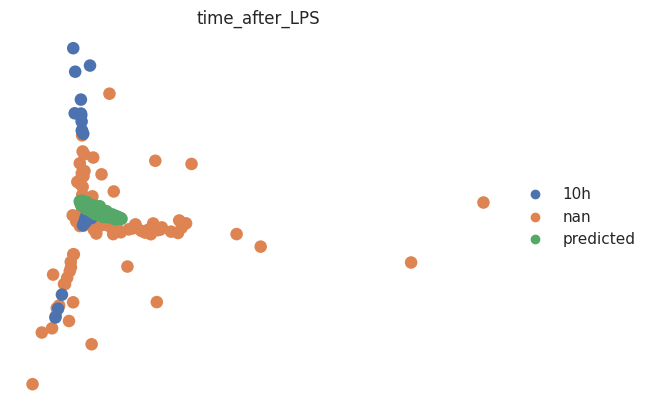

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


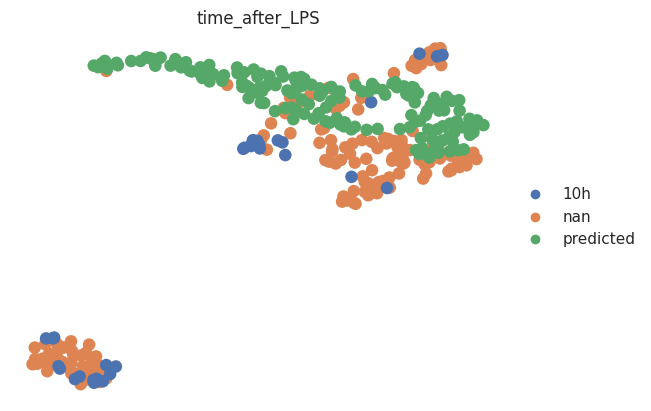

UMAP plot created.

Bootstrapped R²: 0.9265 ± 0.0030


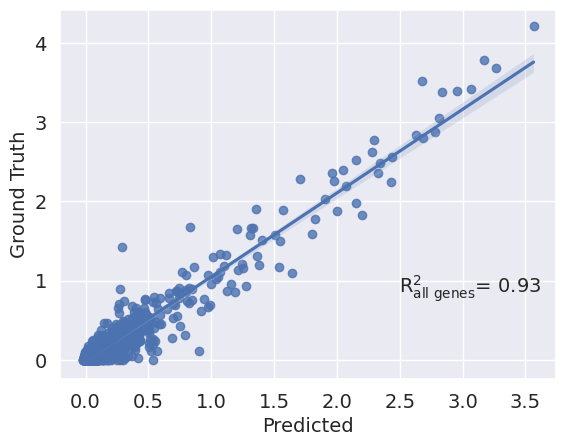

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.9460419875831527

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.946041871156607

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.716403603553772

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.88it/s, v_num=1, train_loss_step=6.58e+3, train_loss_epoch=7.46e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=6.58e+3, train_loss_epoch=7.46e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


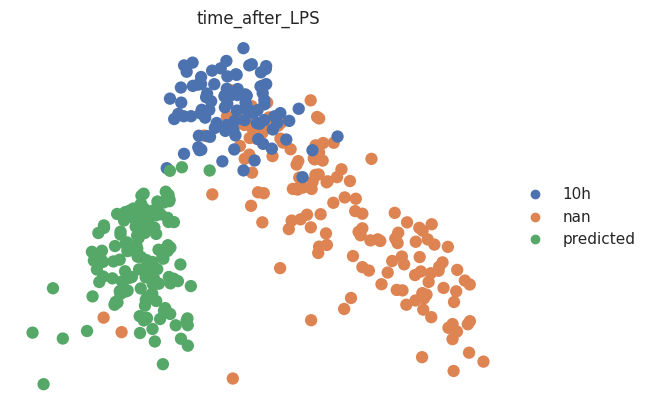

PCA plot created.



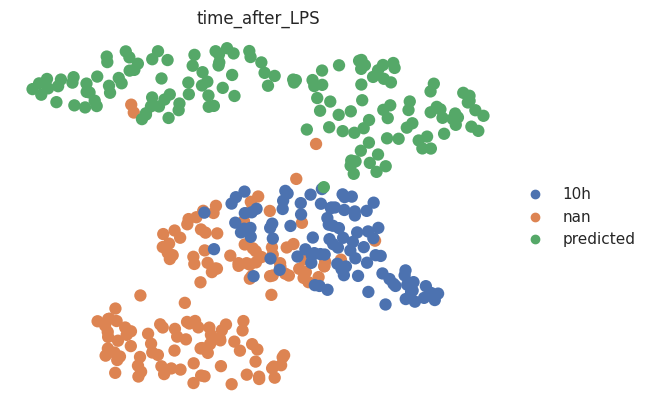

UMAP plot created.

Bootstrapped R²: 0.9260 ± 0.0017


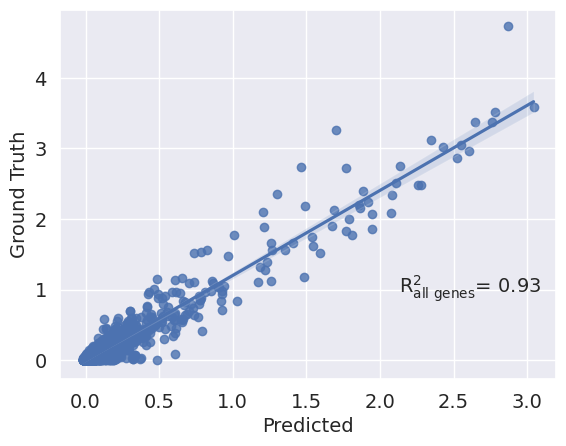

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.7737084965777284

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.7737084957058781

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.8796070218086243

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorc

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.76it/s, v_num=1, train_loss_step=5.37e+3, train_loss_epoch=7.61e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s, v_num=1, train_loss_step=5.37e+3, train_loss_epoch=7.61e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


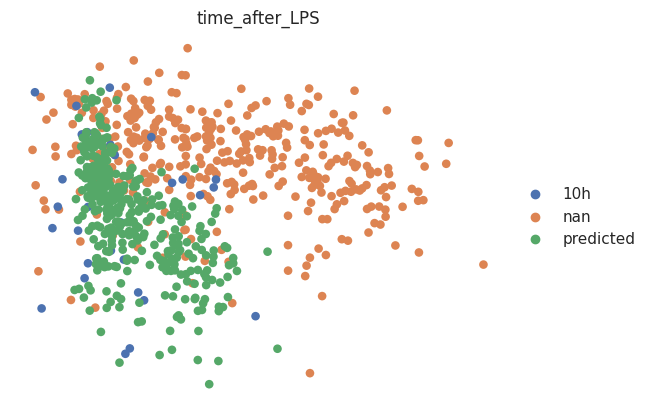

PCA plot created.



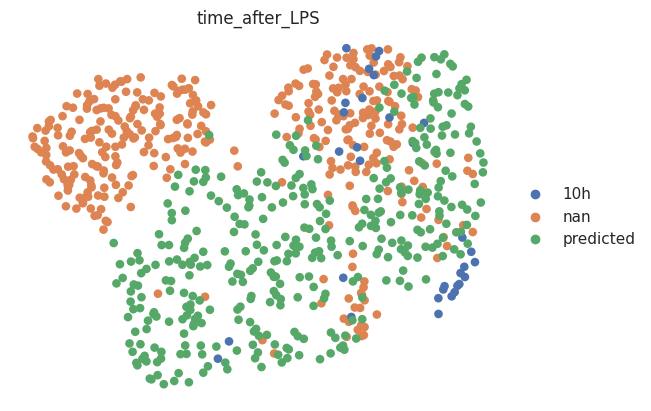

UMAP plot created.

Bootstrapped R²: 0.9304 ± 0.0029


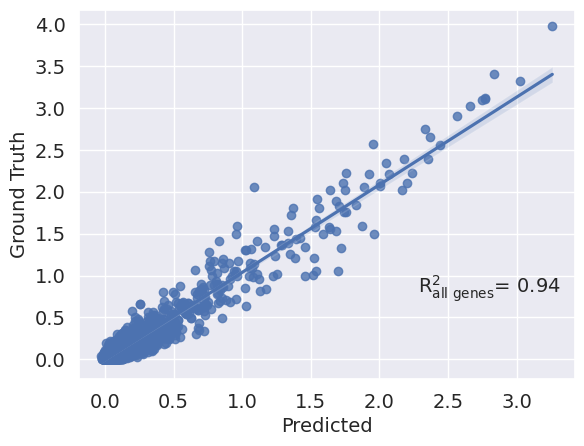

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.332813026385087

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3328131785430535

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.154475212097168

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorc

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.88it/s, v_num=1, train_loss_step=5.91e+3, train_loss_epoch=7.66e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=5.91e+3, train_loss_epoch=7.66e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


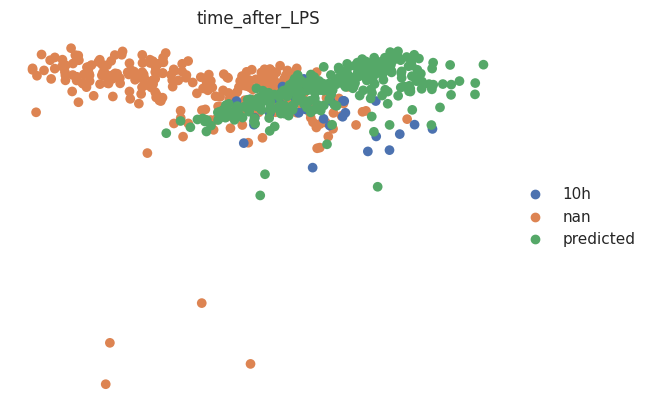

PCA plot created.



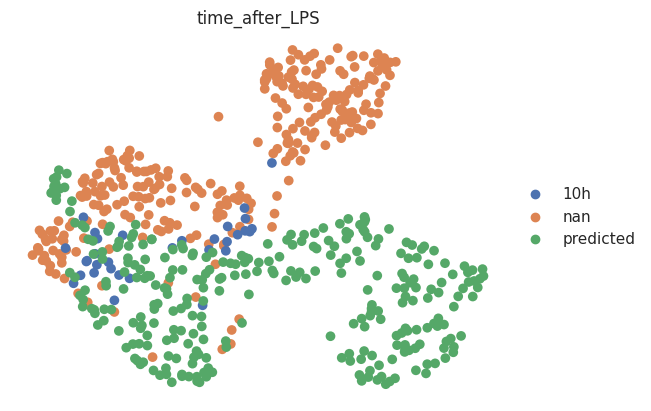

UMAP plot created.

Bootstrapped R²: 0.9399 ± 0.0024


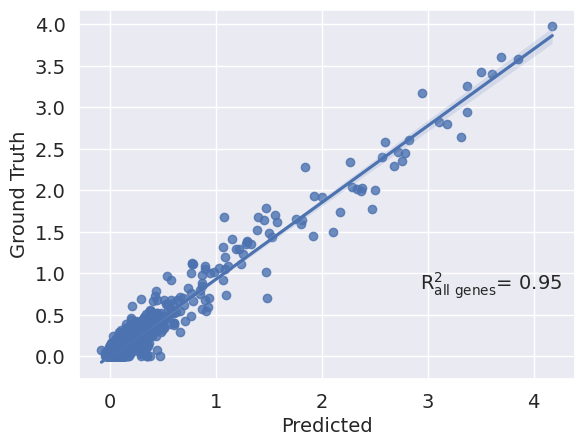

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.489514310234154

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.4895143723404898

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.220456838607788

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch l

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.64it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=7.65e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=1.37e+3, train_loss_epoch=7.65e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


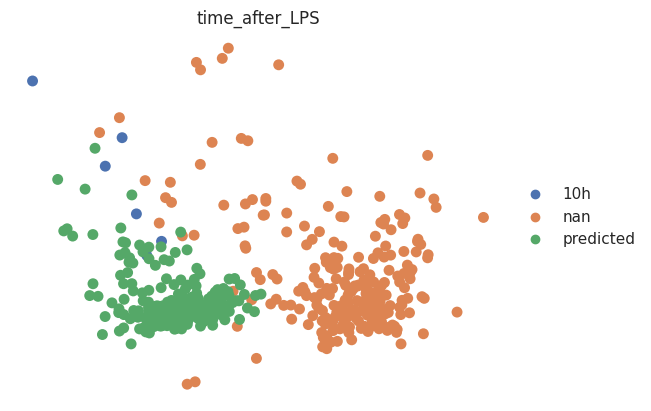

PCA plot created.



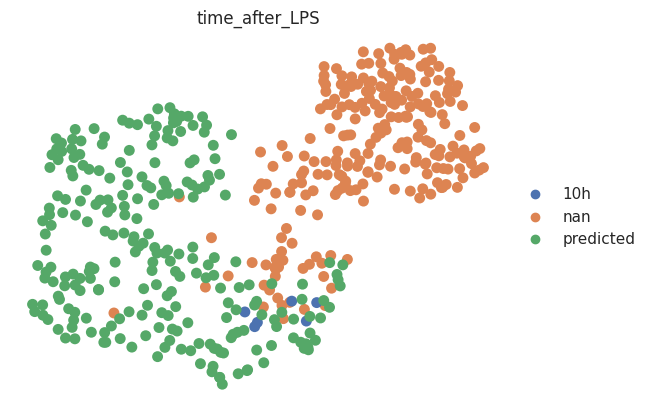

UMAP plot created.

Bootstrapped R²: 0.7610 ± 0.0294


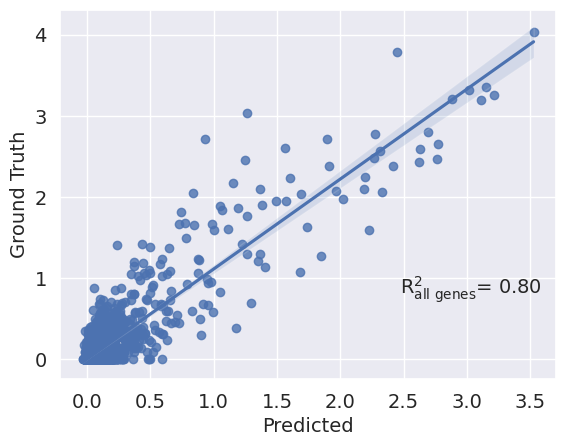

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.2265514075060544

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.226551366963429

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.4921634197235107

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytor

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.75it/s, v_num=1, train_loss_step=5.69e+3, train_loss_epoch=7.63e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s, v_num=1, train_loss_step=5.69e+3, train_loss_epoch=7.63e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


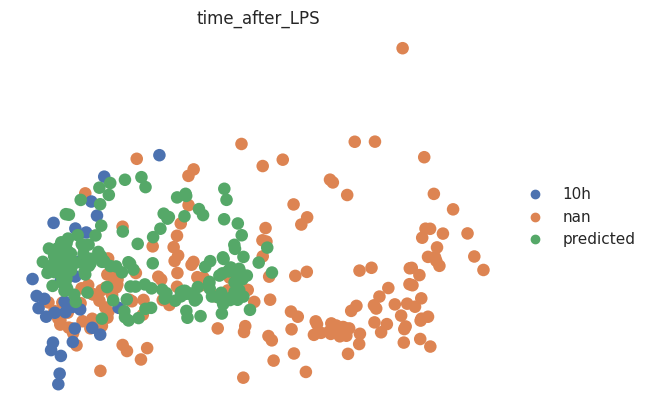

PCA plot created.



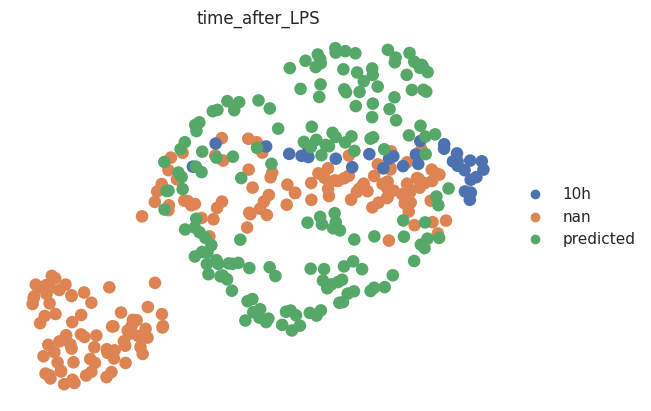

UMAP plot created.

Bootstrapped R²: 0.9312 ± 0.0029


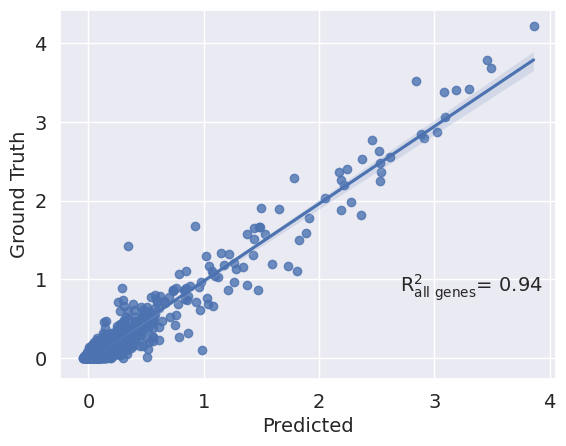

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.1915044020868786

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.1915043466610116

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.0915606021881104



,celltype_to_predict,Type,r2_value,r2_std,mse,pearson_r,edistance,mmd,euclidean
0,B_naive,top 100 DEGs,0.930483,0.001391,0.006029,0.965803,1.630257,1.630257,1.276815
1,NK_16hi,top 100 DEGs,0.927621,0.003305,0.005507,0.966881,1.973198,1.973198,1.404706
2,CD4.Naive,top 100 DEGs,0.938060,0.002368,0.004310,0.972013,1.759916,1.759916,1.326618
3,CD4.CM,top 100 DEGs,0.765418,0.031362,0.016915,0.896774,2.262988,2.262989,1.504323
4,CD8.Naive,top 100 DEGs,0.926462,0.003040,0.004359,0.965468,2.946042,2.946042,1.716404
5,B_naive,all genes,0.926008,0.001708,0.006800,0.963503,0.773708,0.773708,0.879607
6,NK_16hi,all genes,0.930423,0.002925,0.004614,0.968359,1.332813,1.332813,1.154475
7,CD4.Naive,all genes,0.939877,0.002391,0.003632,0.972913,1.489514,1.489514,1.220457
8,CD4.CM,all genes,0.761007,0.029351,0.015294,0.896751,2.226551,2.226551,1.492163
9,CD8.Naive,all genes,0.931187,0.002929,0.003939,0.967924,1.191504,1.191504,1.091561


In [58]:
import numpy as np
import pandas as pd
from scipy import sparse, stats

results = []

for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # 1️⃣ Preprocess & train
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes          = hvgs if hvgs is not None else norm_data.n_vars,
            remove_conditions    = None,
            subsample_n          = None,
        )
        analysis.prepare_training_set(
            exclude_query=f'({celltype_col} == "{celltype}") & ({condition_col} == "{stim_key}")'
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs=n_epochs, batch_size=batch_size,
            accelerator="gpu", devices=1
        )

        # 2️⃣ Predict & R²
        analysis.make_prediction(
            ctrl_key=ctrl_key, stim_key=stim_key,
            celltype_to_predict=celltype,
            condition_col=condition_col, cell_type_col=celltype_col
        )
        analysis.evaluate_prediction(
            condition_col=condition_col, cell_type_col=celltype_col,
            control_condition=ctrl_key, stimulated_condition=stim_key,
            celltype_to_evaluate=celltype, pca_components=pca_components
        )
        analysis.plot_mean_correlation(
            condition_col=condition_col, stimulated_condition=stim_key
        )
        r2_mean, r2_sd = analysis.r2_value, analysis.r2_std

        # 2.5️⃣ Error & Pearson‐r on mean expression
        ad = analysis.eval_adata[
            (analysis.eval_adata.obs[condition_col] == stim_key)
            | (analysis.eval_adata.obs[condition_col] == "predicted")
        ].copy()
        ad.obs.rename({condition_col: "condition"}, axis=1, inplace=True)
        X = ad.X.toarray() if sparse.issparse(ad.X) else ad.X
        real_mask = ad.obs["condition"] == stim_key
        pred_mask = ad.obs["condition"] == "predicted"
        x_bar = X[pred_mask].mean(axis=0)
        y_bar = X[real_mask].mean(axis=0)
        mse = np.mean((x_bar - y_bar) ** 2)
        pearson_r, _ = stats.pearsonr(x_bar, y_bar)

        # 3️⃣ Distance metrics
        dist_scores = {}
        for metric_name in ["edistance", "mmd", "euclidean"]:
            analysis.compute_distance_metric(
                condition_col=condition_col,
                control_condition=ctrl_key,
                stimulated_condition=stim_key,
                pca_components=pca_components,
                metric=metric_name
            )
            dist_scores[metric_name] = analysis.perturbation_score

        # 4️⃣ Record results
        row = {
            "celltype_to_predict": celltype,
            "Type": gene_label,
            "r2_value":    r2_mean,
            "r2_std":      r2_sd,
            "mse":         mse,
            "pearson_r":   pearson_r,
            **dist_scores
        }
        results.append(row)

results_df = pd.DataFrame(results)
results_df


Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:369: You have overridden `transfer_batch_to_device` in `LightningModule` but have passed in a `LightningDataModule`. It will use the implementation from `LightningModule` instance.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  4.16it/s, v_num=1, train_loss_step=6.58e+3, train_loss_epoch=7.61e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s, v_num=1, train_loss_step=6.58e+3, train_loss_epoch=7.61e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


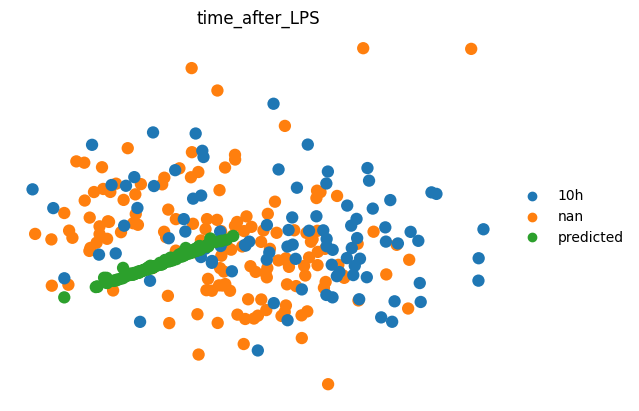

PCA plot created.



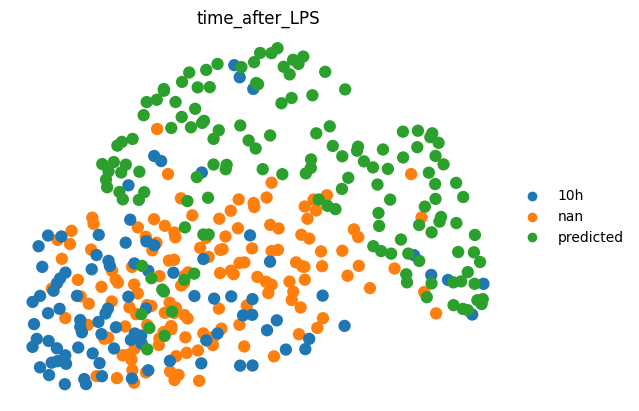

UMAP plot created.

Bootstrapped R²: 0.9345 ± 0.0015


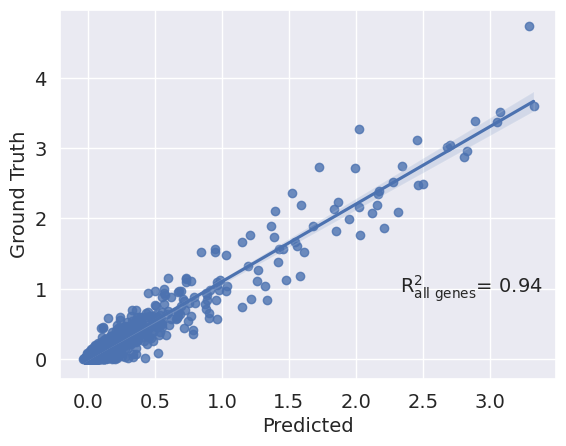

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.8526002021455379

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.8526001562672696

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.3611023426055908

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch li

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.94it/s, v_num=1, train_loss_step=6.67e+3, train_loss_epoch=7.59e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s, v_num=1, train_loss_step=6.67e+3, train_loss_epoch=7.59e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


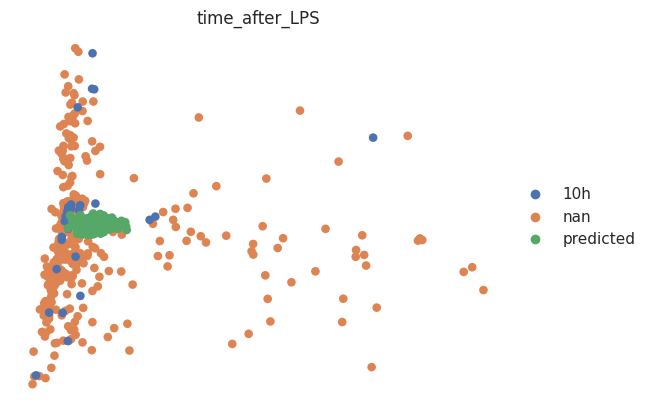

PCA plot created.



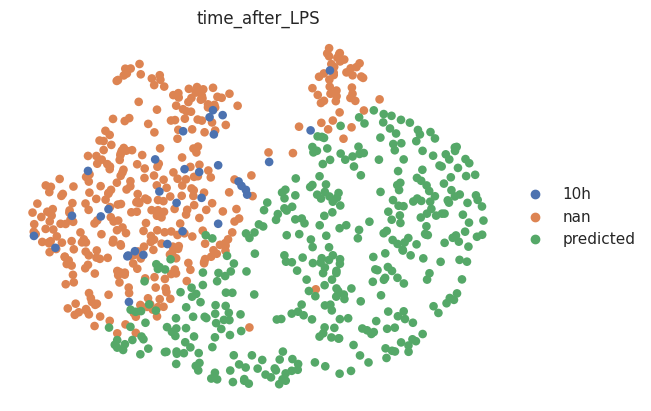

UMAP plot created.

Bootstrapped R²: 0.9289 ± 0.0030


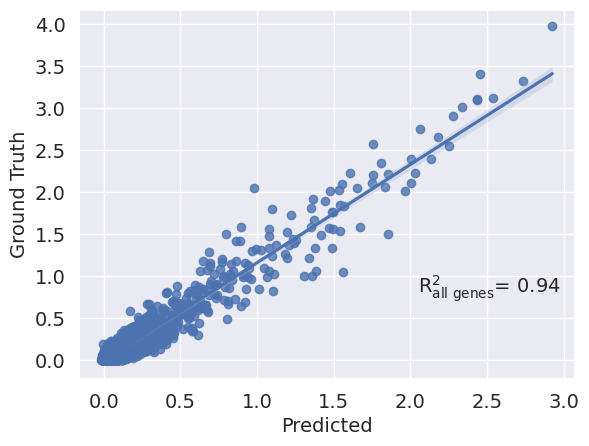

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.4468074834636502

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.4468075936227456

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2028330564498901

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.86it/s, v_num=1, train_loss_step=6.48e+3, train_loss_epoch=7.62e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s, v_num=1, train_loss_step=6.48e+3, train_loss_epoch=7.62e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


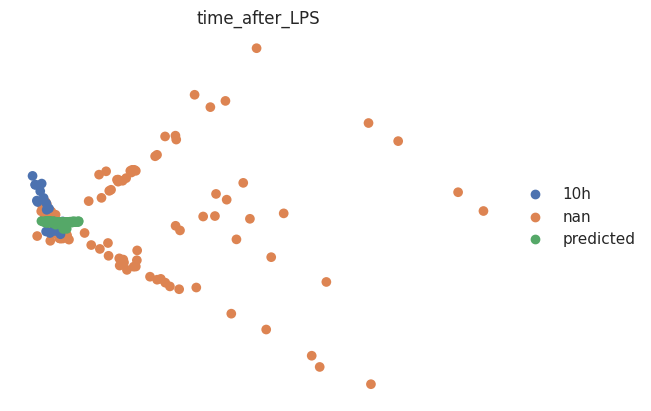

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


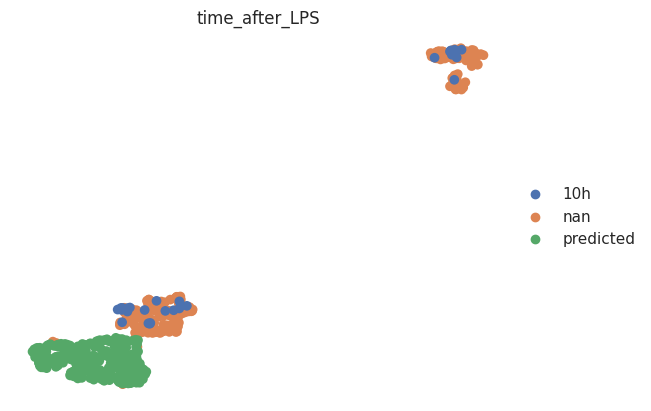

UMAP plot created.

Bootstrapped R²: 0.9401 ± 0.0022


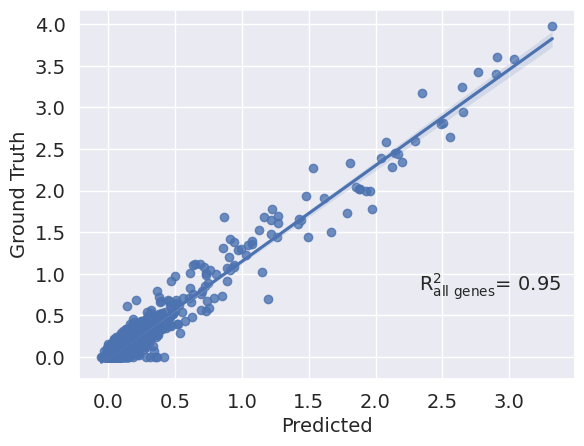

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.571654850107834

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.571654663316438

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.253656268119812

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightn

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  3.73it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=7.64e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s, v_num=1, train_loss_step=1.09e+3, train_loss_epoch=7.64e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


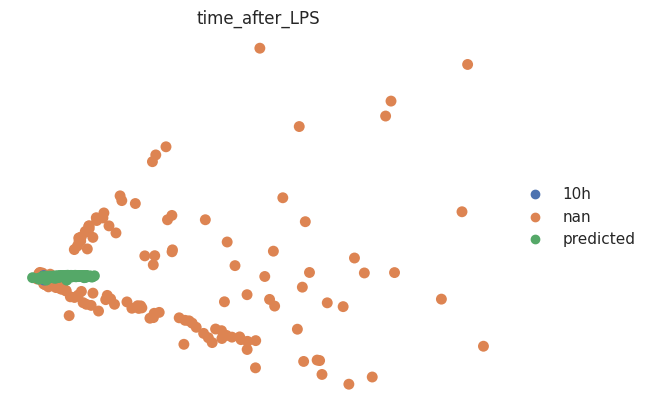

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


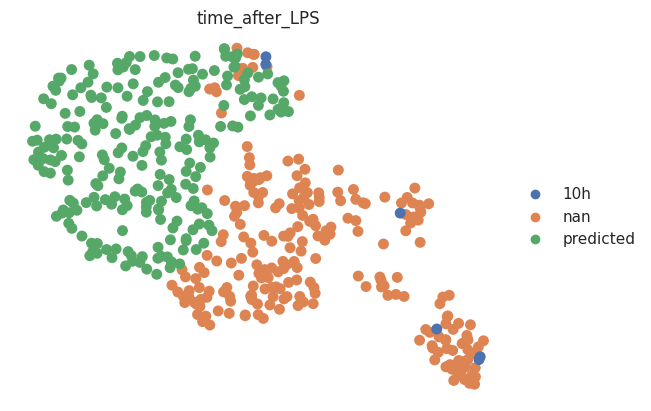

UMAP plot created.

Bootstrapped R²: 0.7733 ± 0.0299


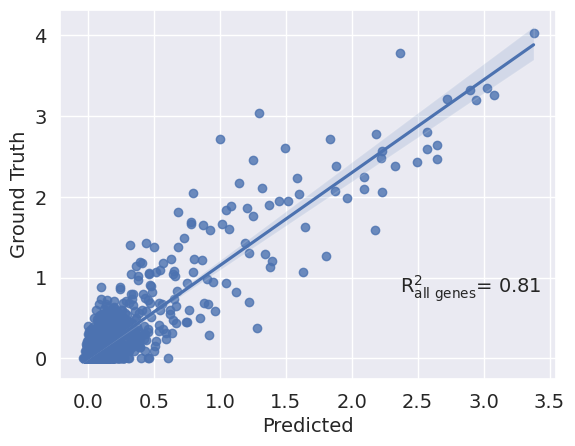

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.619713559367121

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.619713916392428

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.6185531616210938

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch li

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.84it/s, v_num=1, train_loss_step=6.49e+3, train_loss_epoch=7.68e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=6.49e+3, train_loss_epoch=7.68e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


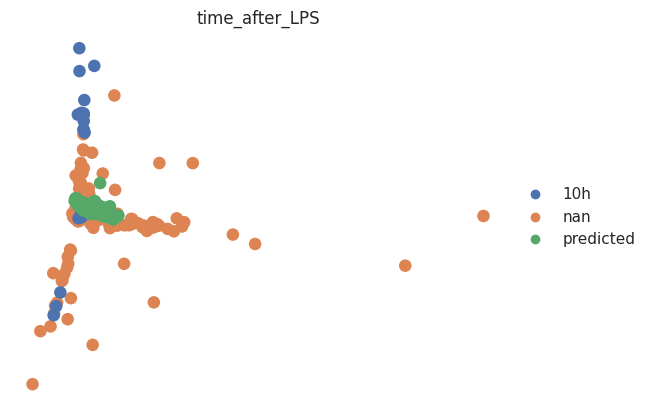

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


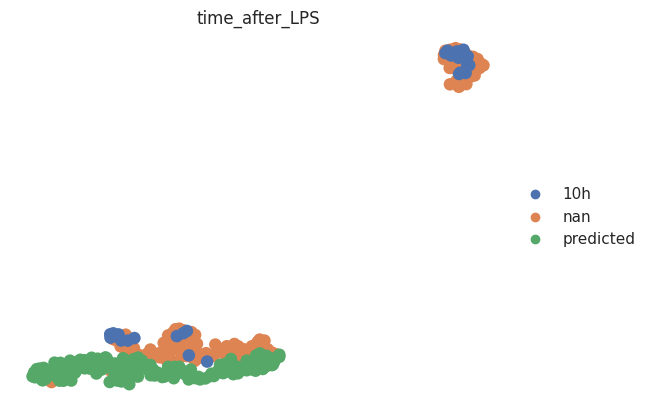

UMAP plot created.

Bootstrapped R²: 0.9226 ± 0.0024


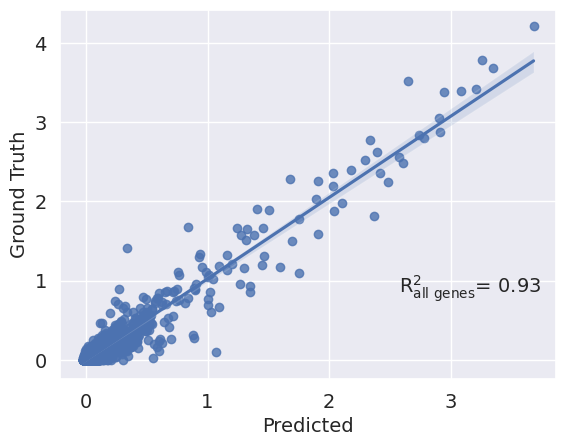

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 3.765374976414038

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 3.7653752946959873

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.9404573440551758

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  4.10it/s, v_num=1, train_loss_step=6.69e+3, train_loss_epoch=7.6e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s, v_num=1, train_loss_step=6.69e+3, train_loss_epoch=7.6e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


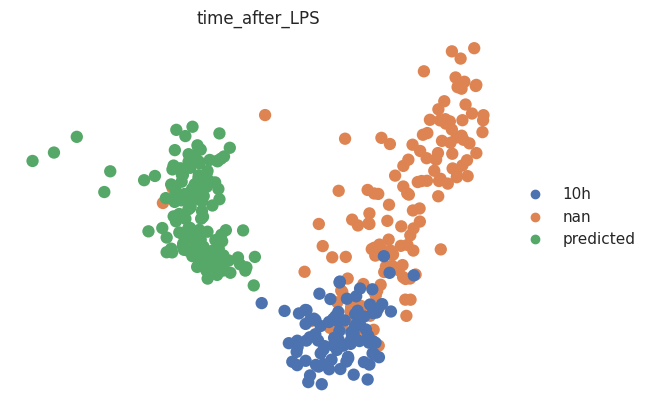

PCA plot created.



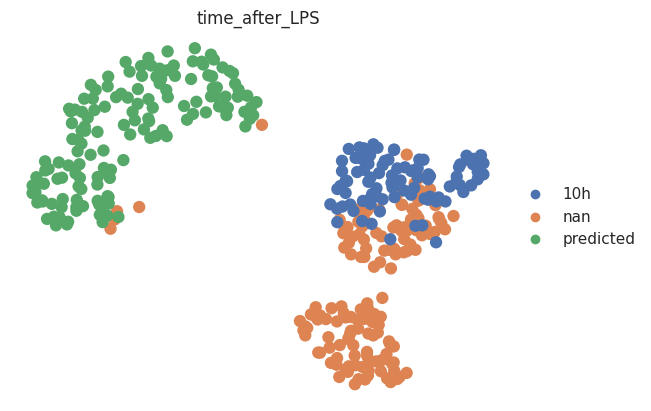

UMAP plot created.

Bootstrapped R²: 0.9129 ± 0.0015


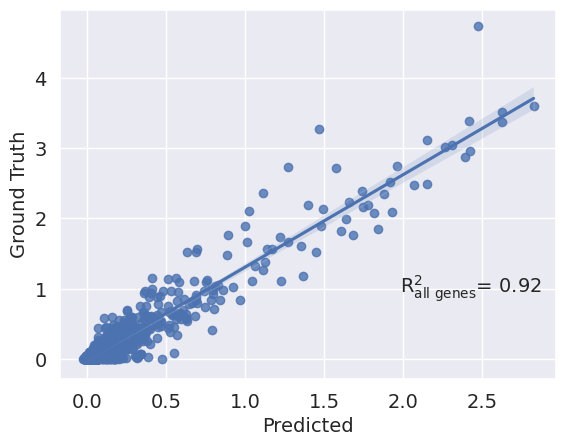

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.850727634371392

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.850727606618153

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.9223489761352539

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.84it/s, v_num=1, train_loss_step=5.32e+3, train_loss_epoch=7.53e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s, v_num=1, train_loss_step=5.32e+3, train_loss_epoch=7.53e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


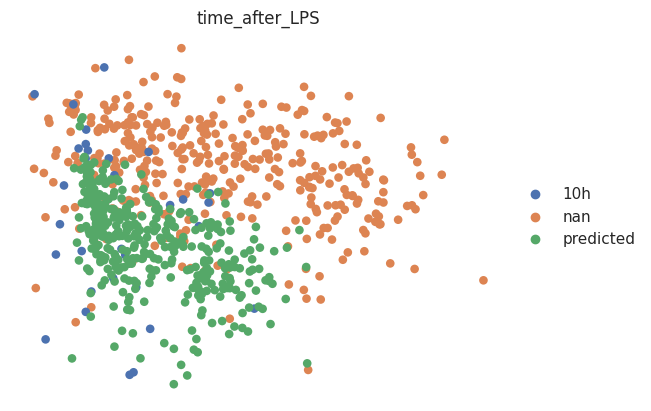

PCA plot created.



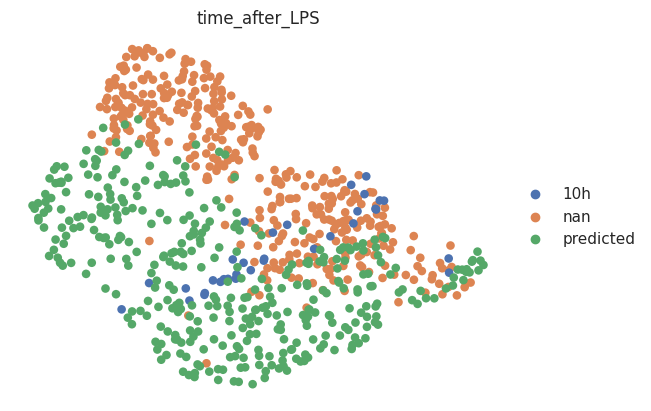

UMAP plot created.

Bootstrapped R²: 0.9268 ± 0.0030


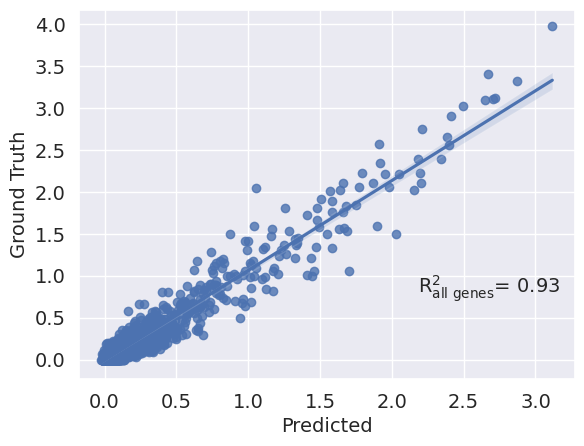

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.5233943204129856

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.5233942412629864

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2342586517333984

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pyto

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.89it/s, v_num=1, train_loss_step=6.27e+3, train_loss_epoch=7.68e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s, v_num=1, train_loss_step=6.27e+3, train_loss_epoch=7.68e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


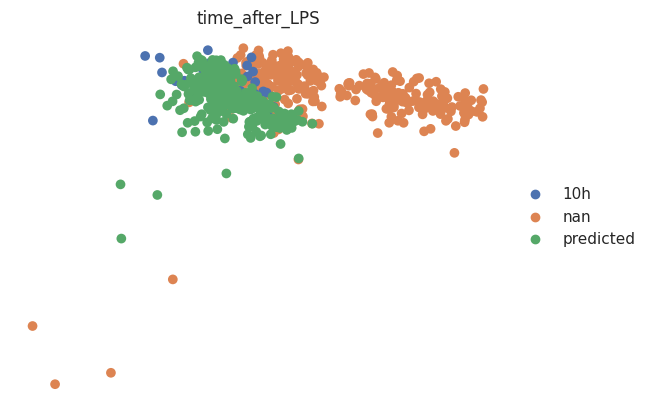

PCA plot created.



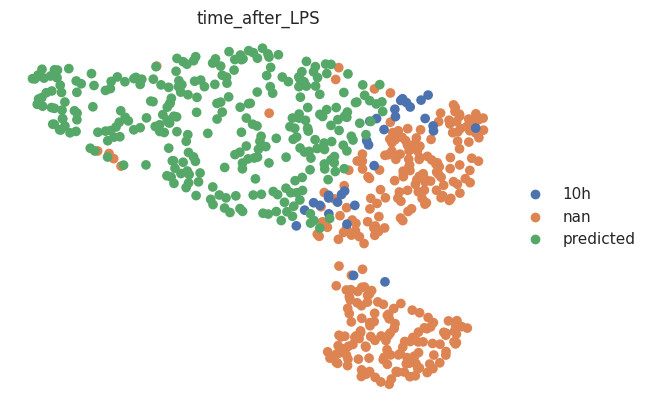

UMAP plot created.

Bootstrapped R²: 0.9403 ± 0.0022


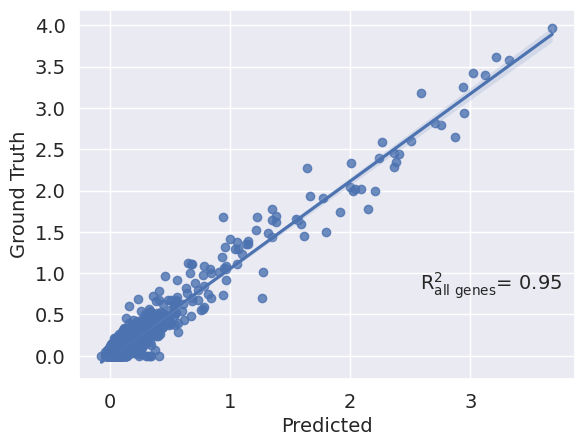

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.2385836010554703

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.2385834860911291

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1129165887832642

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.59it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=7.61e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s, v_num=1, train_loss_step=1.31e+3, train_loss_epoch=7.61e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


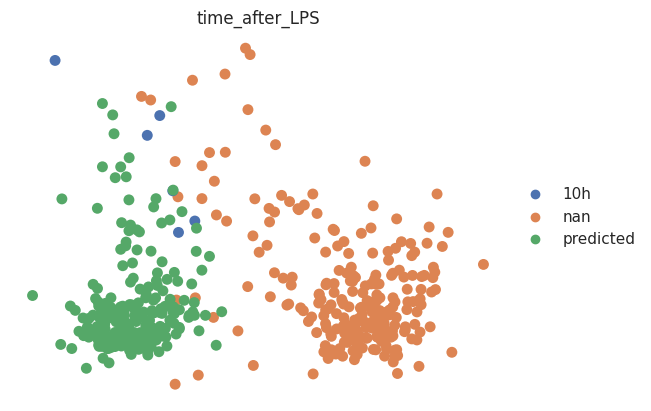

PCA plot created.



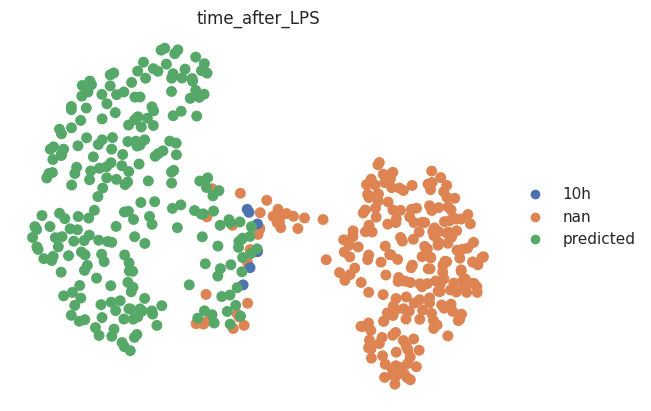

UMAP plot created.

Bootstrapped R²: 0.7686 ± 0.0306


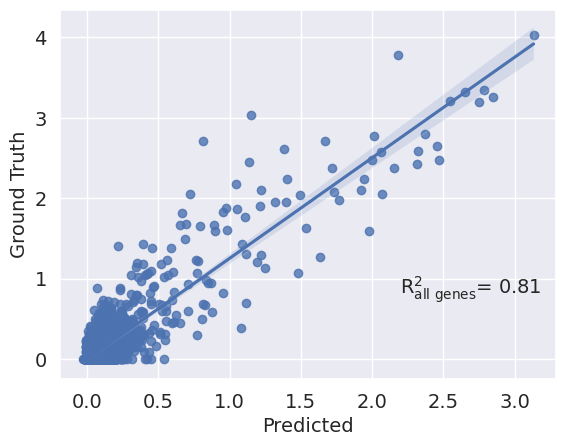

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.7525752819796743

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.7525752474930256

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.3238486051559448

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pyto

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.67it/s, v_num=1, train_loss_step=6.69e+3, train_loss_epoch=7.63e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=6.69e+3, train_loss_epoch=7.63e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


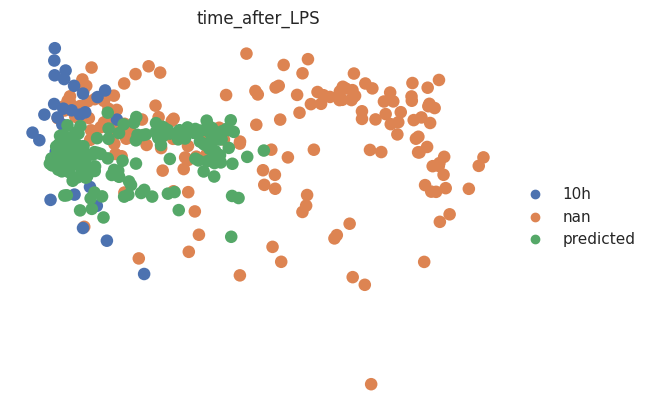

PCA plot created.



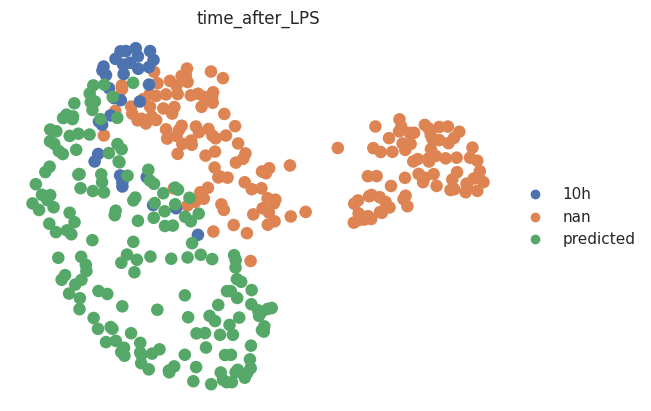

UMAP plot created.

Bootstrapped R²: 0.9324 ± 0.0026


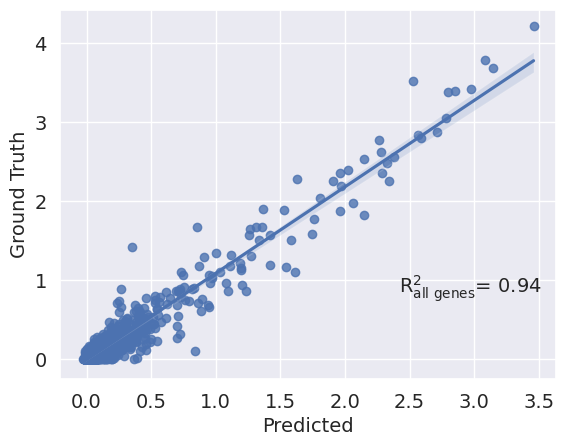

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.9199510397333287

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.919951012372099

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.959140956401825



,celltype_to_predict,Type,r2_mean,r2_std,MSE,RMSE,MAE,L2_norm,Pearson_r,Cosine_sim,edistance,mmd,euclidean
0,B_naive,top 100 DEGs,0.934462,0.001463,0.004891,0.069935,0.030038,4.945153,0.967717,0.970832,1.852600,1.852600,1.361102
1,NK_16hi,top 100 DEGs,0.928911,0.003016,0.006054,0.077806,0.038624,5.501750,0.967357,0.970903,1.446807,1.446808,1.202833
2,CD4.Naive,top 100 DEGs,0.940063,0.002247,0.004246,0.065165,0.033260,4.607828,0.973192,0.975478,1.571655,1.571655,1.253656
3,CD4.CM,top 100 DEGs,0.773283,0.029922,0.015337,0.123843,0.057911,8.757038,0.899927,0.907858,2.619714,2.619714,1.618553
4,CD8.Naive,top 100 DEGs,0.922624,0.002447,0.004468,0.066841,0.032659,4.726353,0.963483,0.966361,3.765375,3.765375,1.940457
5,B_naive,all genes,0.912942,0.001537,0.009533,0.097637,0.035900,6.903996,0.956617,0.960498,0.850728,0.850728,0.922349
6,NK_16hi,all genes,0.926827,0.003005,0.005045,0.071027,0.037872,5.022334,0.966437,0.970196,1.523394,1.523394,1.234259
7,CD4.Naive,all genes,0.940282,0.002248,0.003358,0.057951,0.031994,4.097730,0.973293,0.975627,1.238584,1.238583,1.112917
8,CD4.CM,all genes,0.768567,0.030642,0.016974,0.130285,0.059467,9.212528,0.898889,0.906970,1.752575,1.752575,1.323849
9,CD8.Naive,all genes,0.932405,0.002637,0.004242,0.065131,0.031799,4.605458,0.968543,0.970993,0.919951,0.919951,0.959141


In [8]:
import numpy as np
import pandas as pd
from scipy import sparse, stats
from scipy.spatial.distance import cosine as cosine_dist

results = []

for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # 1️⃣ Preprocess & train
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes          = hvgs if hvgs is not None else norm_data.n_vars,
            remove_conditions    = None,
            subsample_n          = None,
        )
        analysis.prepare_training_set(
            exclude_query=f'({celltype_col} == "{celltype}") & ({condition_col} == "{stim_key}")'
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs=n_epochs, batch_size=batch_size,
            accelerator="gpu", devices=1
        )

        # 2️⃣ Predict & R²
        analysis.make_prediction(
            ctrl_key=ctrl_key, stim_key=stim_key,
            celltype_to_predict=celltype,
            condition_col=condition_col, cell_type_col=celltype_col
        )
        analysis.evaluate_prediction(
            condition_col=condition_col, cell_type_col=celltype_col,
            control_condition=ctrl_key, stimulated_condition=stim_key,
            celltype_to_evaluate=celltype, pca_components=pca_components
        )
        analysis.plot_mean_correlation(
            condition_col=condition_col, stimulated_condition=stim_key
        )
        r2_mean, r2_sd = analysis.r2_value, analysis.r2_std

        # 2.5️⃣ Error & corr on the mean‐expression vectors
        ad = analysis.eval_adata[
            (analysis.eval_adata.obs[condition_col] == stim_key)
            | (analysis.eval_adata.obs[condition_col] == "predicted")
        ].copy()
        ad.obs.rename({condition_col: "condition"}, axis=1, inplace=True)

        # get a dense numpy array
        X = ad.X.toarray() if sparse.issparse(ad.X) else ad.X

        # masks for real vs predicted
        real_mask = ad.obs["condition"] == stim_key
        pred_mask = ad.obs["condition"] == "predicted"

        # cell‐wise means
        y_bar = X[real_mask].mean(axis=0)
        x_bar = X[pred_mask].mean(axis=0)

        # error metrics
        diff      = x_bar - y_bar
        mse       = np.mean(diff**2)
        rmse      = np.sqrt(mse)
        mae       = np.mean(np.abs(diff))
        l2_norm   = np.linalg.norm(diff)

        # correlations
        pearson_r, _   = stats.pearsonr(x_bar, y_bar)
        cosine_sim     = 1 - cosine_dist(x_bar, y_bar)  # 1 - (1 - cos)

        # 3️⃣ Distance metrics (E‐distance, MMD, Euclidean)
        dist_scores = {}
        for metric_name in ["edistance", "mmd", "euclidean"]:
            analysis.compute_distance_metric(
                condition_col=condition_col,
                control_condition=ctrl_key,
                stimulated_condition=stim_key,
                pca_components=pca_components,
                metric=metric_name
            )
            dist_scores[metric_name] = analysis.perturbation_score

        # 4️⃣ Record everything
        row = {
            "celltype_to_predict": celltype,
            "Type":               gene_label,

            # R² from bootstrapped regression
            "r2_mean":            r2_mean,
            "r2_std":             r2_sd,

            # raw error / correlation
            "MSE":                mse,
            "RMSE":               rmse,
            "MAE":                mae,
            "L2_norm":            l2_norm,
            "Pearson_r":          pearson_r,
            "Cosine_sim":         cosine_sim,

            # distance‐metric scores
            **dist_scores
        }
        results.append(row)

results_df = pd.DataFrame(results)
results_df


/tmp/ipykernel_404195/1718108222.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)
/tmp/ipykernel_404195/1718108222.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)
/tmp/ipykernel_404195/1718108222.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)
/tmp/ipykernel_404195/1718108222.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)
/tmp

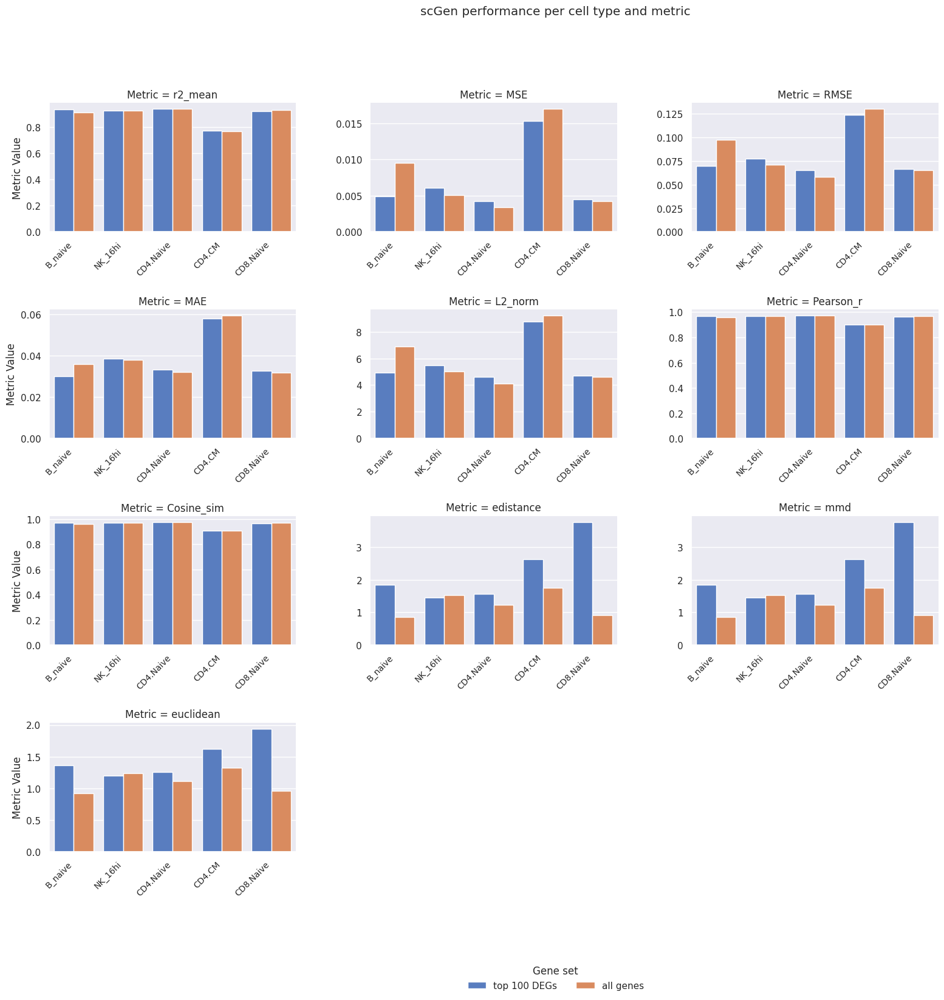

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

metrics = [
    "r2_mean", "MSE", "RMSE", "MAE", "L2_norm",
    "Pearson_r", "Cosine_sim", "edistance", "mmd", "euclidean"
]
df_long = results_df.melt(
    id_vars=["celltype_to_predict", "Type"],
    value_vars=metrics,
    var_name="Metric",
    value_name="Value",
)

g = sns.catplot(
    data=df_long,
    x="celltype_to_predict", y="Value", hue="Type",
    col="Metric", col_wrap=3, sharey=False, sharex=False,
    kind="bar", palette="muted",
    height=4, aspect=1.2,
    legend_out=True,
)

for ax in g.axes.flatten():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)

g.set_axis_labels("", "Metric Value")
g.fig.suptitle("scGen performance per cell type and metric", y=1.02)

# remove the default (outside) legend
if g._legend:
    g._legend.remove()

# add a single legend underneath, higher up (y=–0.02)
g.add_legend(
    title="Gene set",
    loc="lower center",
    ncol=2,
    bbox_to_anchor=(0.5, -0.001),
    frameon=False
)

# tighten bottom margin and increase vertical spacing
g.fig.subplots_adjust(
    bottom=0.15,  # bring panels and legend up
    top=0.92,
    hspace=0.6,
    wspace=0.3
)

plt.show()


Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch lightning will show GPU is not being used for the Trainer.       


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  3.96it/s, v_num=1, train_loss_step=7.14e+3, train_loss_epoch=7.49e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s, v_num=1, train_loss_step=7.14e+3, train_loss_epoch=7.49e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


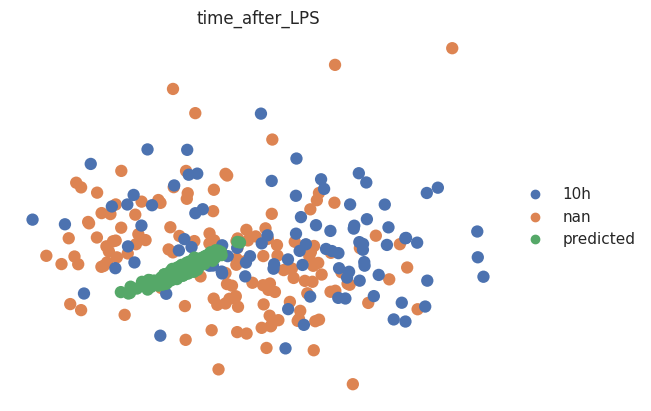

PCA plot created.



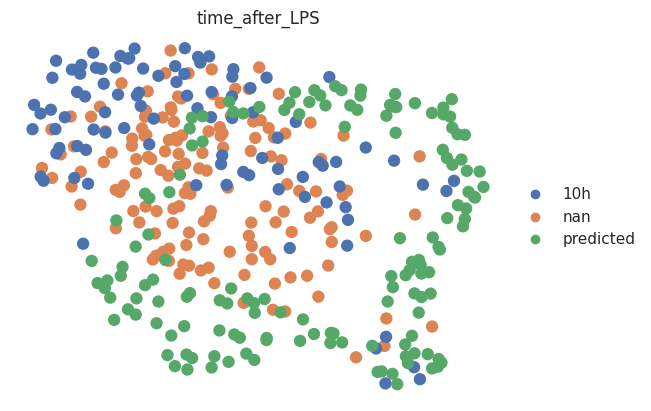

UMAP plot created.

Bootstrapped R²: 0.9457 ± 0.0013


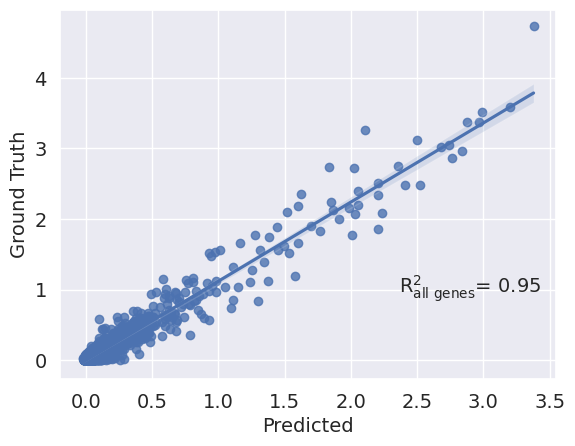

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.1216662736793594

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.1216664710516095

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.4565941095352173

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch li

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.87it/s, v_num=1, train_loss_step=6.73e+3, train_loss_epoch=7.65e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s, v_num=1, train_loss_step=6.73e+3, train_loss_epoch=7.65e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


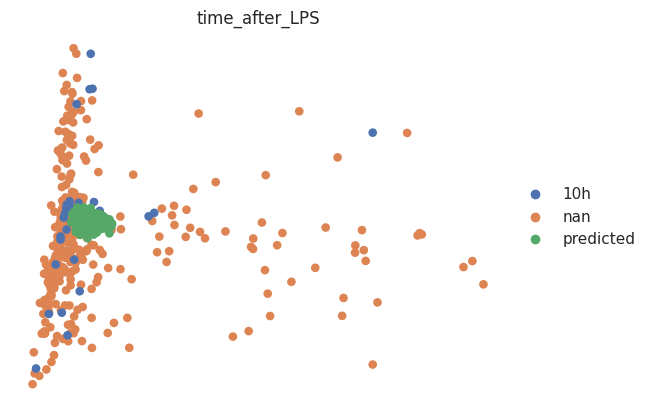

PCA plot created.



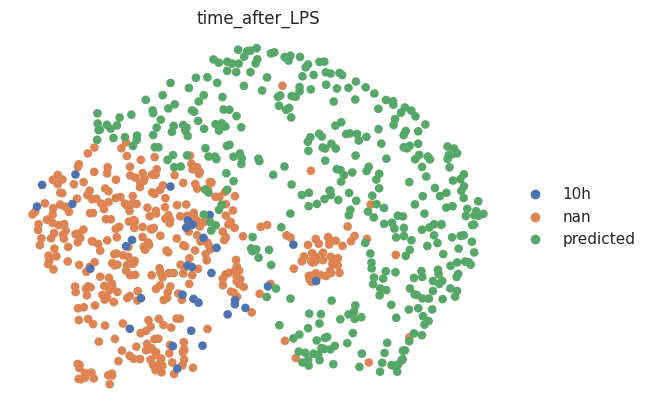

UMAP plot created.

Bootstrapped R²: 0.9292 ± 0.0024


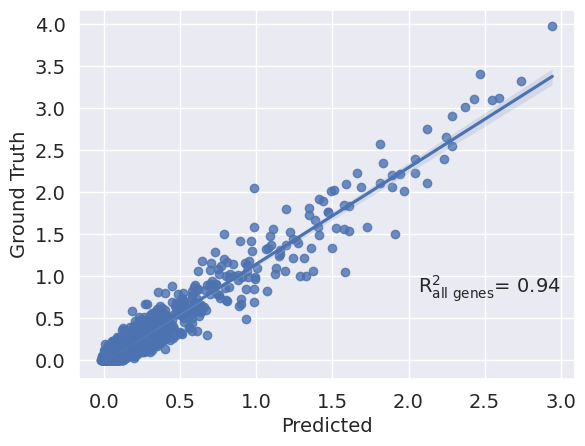

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.3466589307948196

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3466589108747085

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1604562997817993

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.73it/s, v_num=1, train_loss_step=6.6e+3, train_loss_epoch=7.56e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=6.6e+3, train_loss_epoch=7.56e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


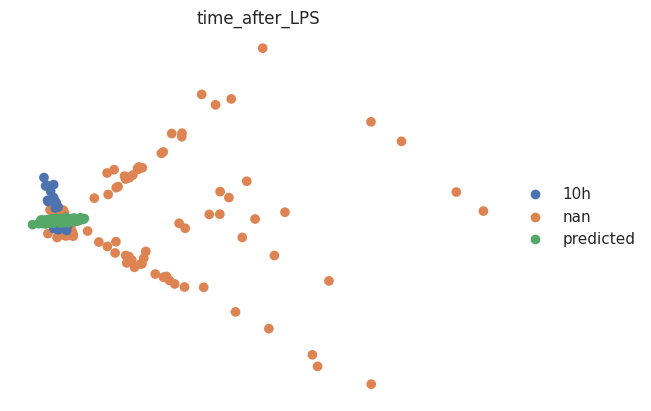

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


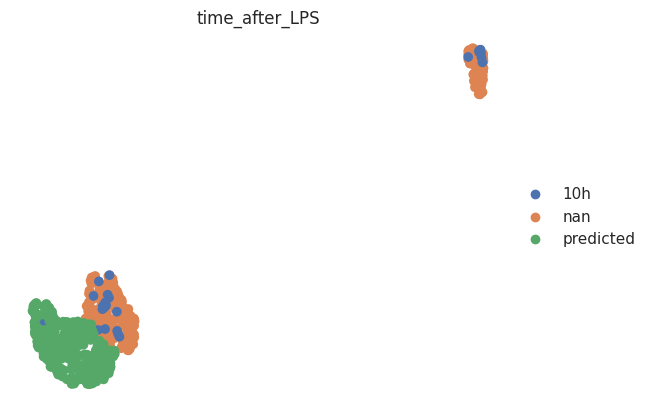

UMAP plot created.

Bootstrapped R²: 0.9416 ± 0.0023


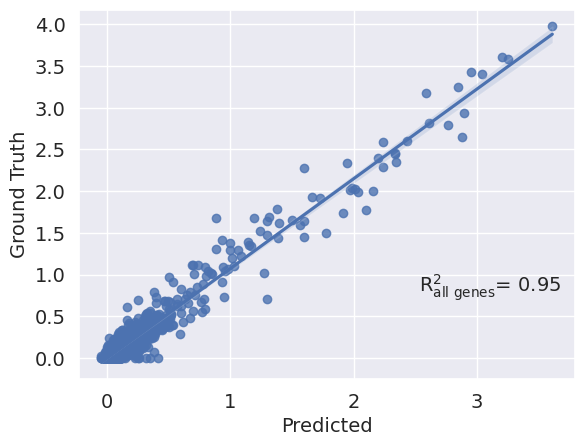

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.6883424502936988

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.688342451441765

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.299362063407898

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch light

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.64it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=7.59e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s, v_num=1, train_loss_step=1.27e+3, train_loss_epoch=7.59e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


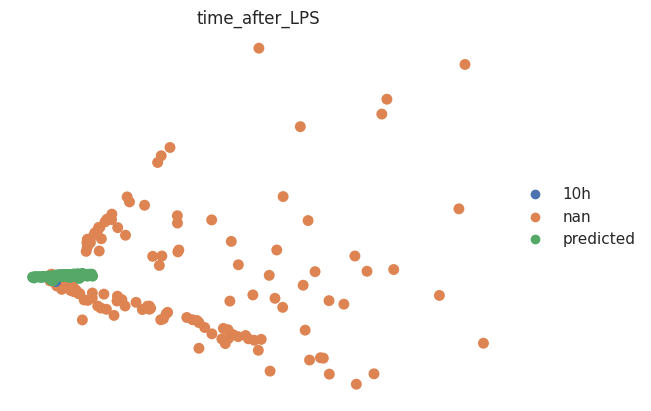

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


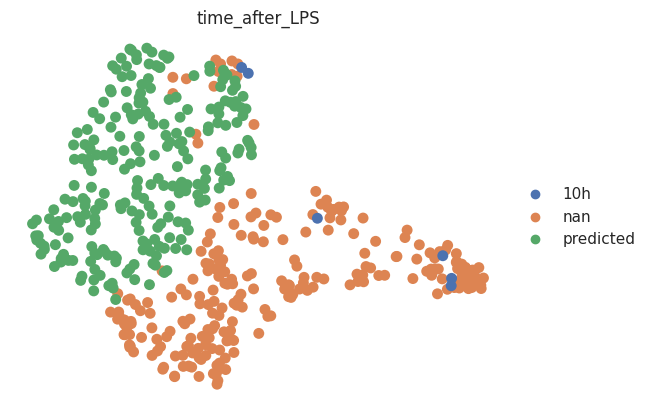

UMAP plot created.

Bootstrapped R²: 0.7807 ± 0.0283


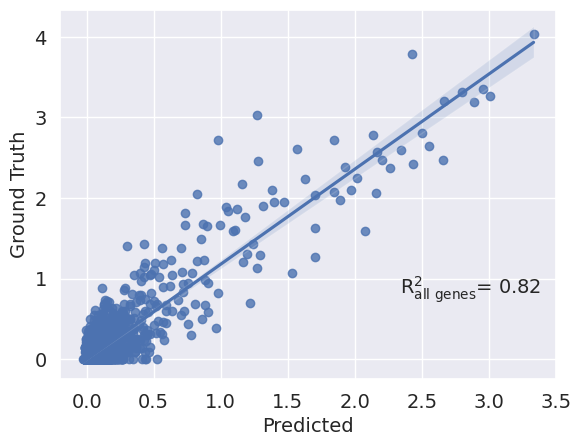

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.571931507019455

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.5719317357229925

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.2537668943405151

Preprocessing data for scGen...
Selected top 100 highly variable genes.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch l

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.78it/s, v_num=1, train_loss_step=5.8e+3, train_loss_epoch=7.69e+3] 

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=5.8e+3, train_loss_epoch=7.69e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


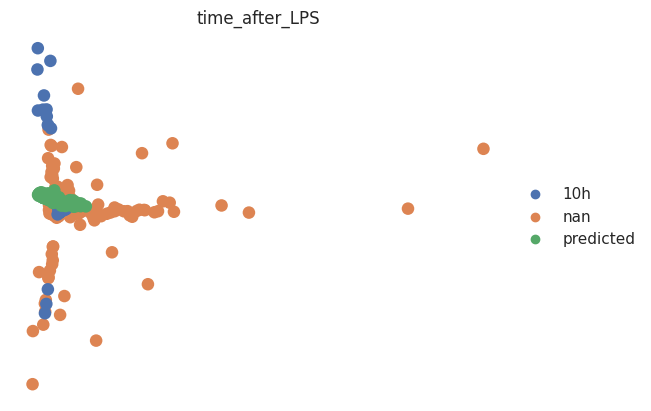

PCA plot created.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


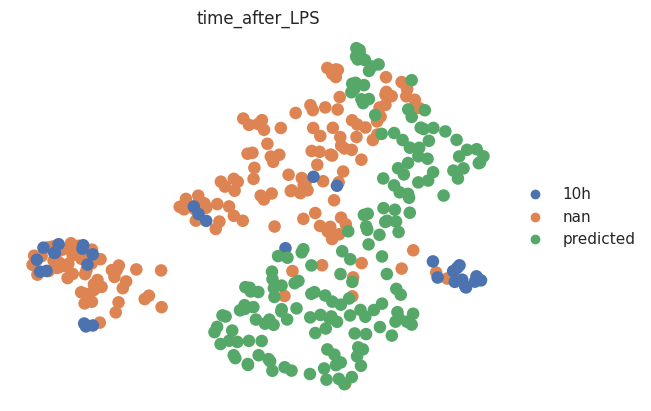

UMAP plot created.

Bootstrapped R²: 0.9247 ± 0.0030


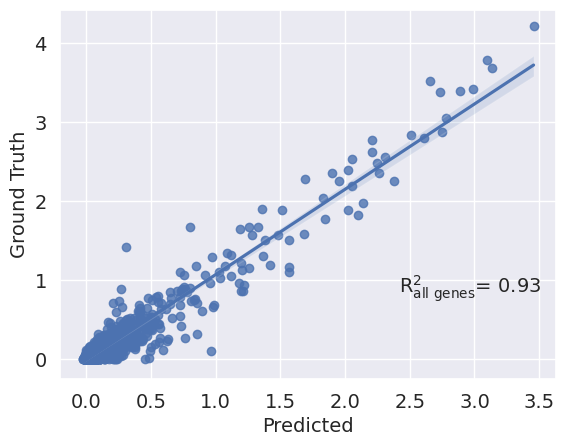

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.2673082902629735

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.267308338462963

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.5057584047317505

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "B_naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  4.00it/s, v_num=1, train_loss_step=7.66e+3, train_loss_epoch=7.57e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s, v_num=1, train_loss_step=7.66e+3, train_loss_epoch=7.57e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


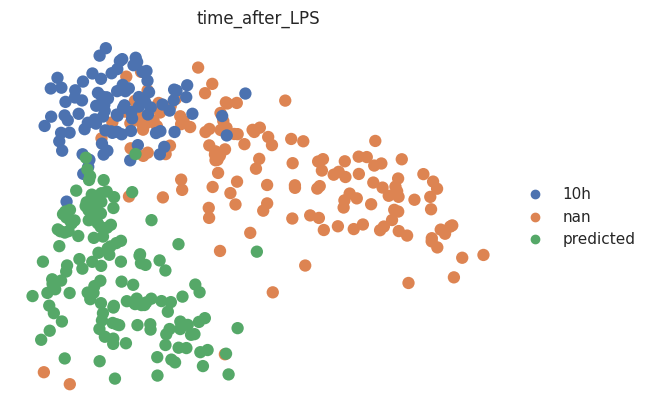

PCA plot created.



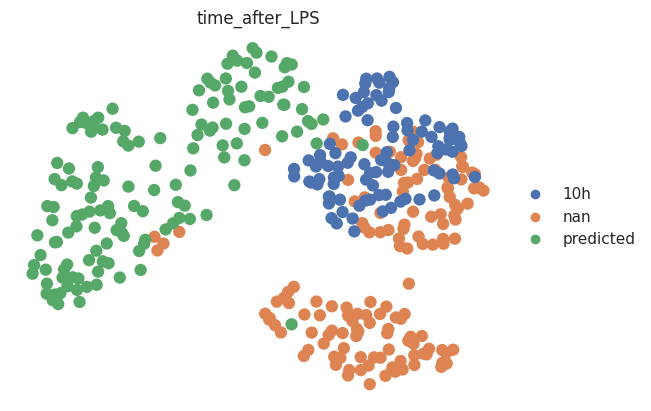

UMAP plot created.

Bootstrapped R²: 0.9250 ± 0.0017


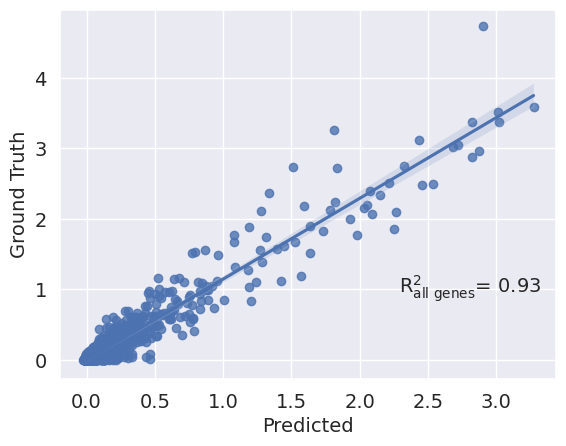

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 0.9700396260325499

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 0.9700396834835724

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 0.984906017780304

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "NK_16hi") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.86it/s, v_num=1, train_loss_step=5.77e+3, train_loss_epoch=7.57e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s, v_num=1, train_loss_step=5.77e+3, train_loss_epoch=7.57e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


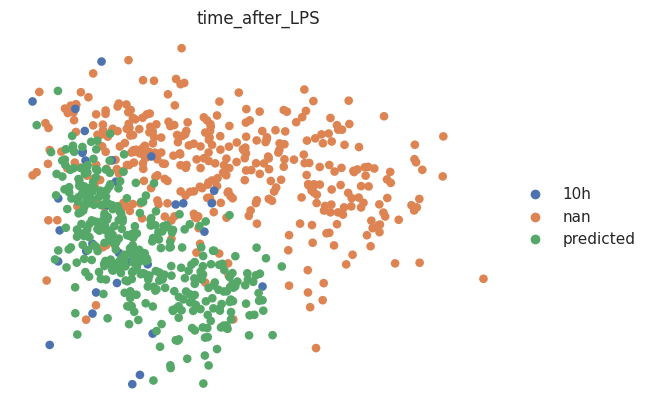

PCA plot created.



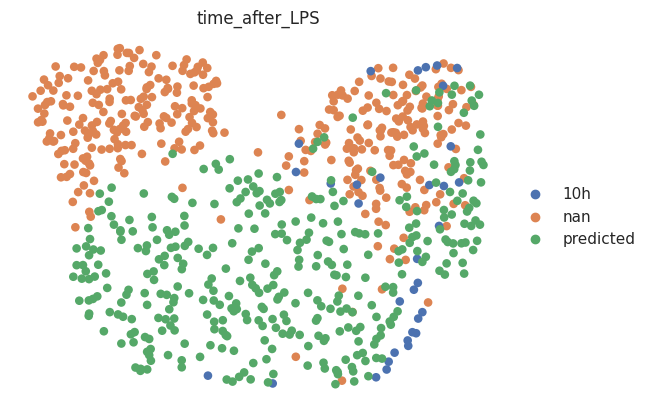

UMAP plot created.

Bootstrapped R²: 0.9300 ± 0.0029


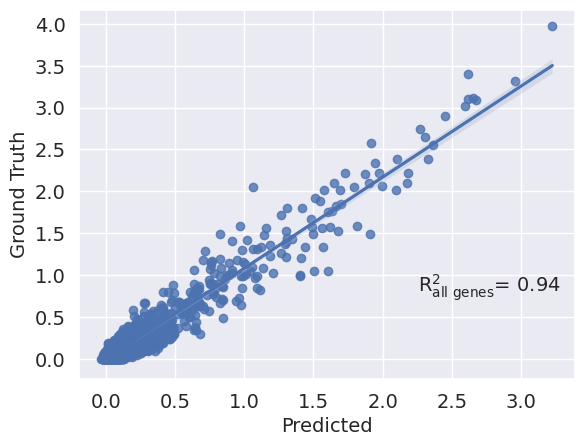

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.2125808000889555

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.2125807440074812

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1011724472045898

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pyto

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.77it/s, v_num=1, train_loss_step=5.68e+3, train_loss_epoch=7.58e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s, v_num=1, train_loss_step=5.68e+3, train_loss_epoch=7.58e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


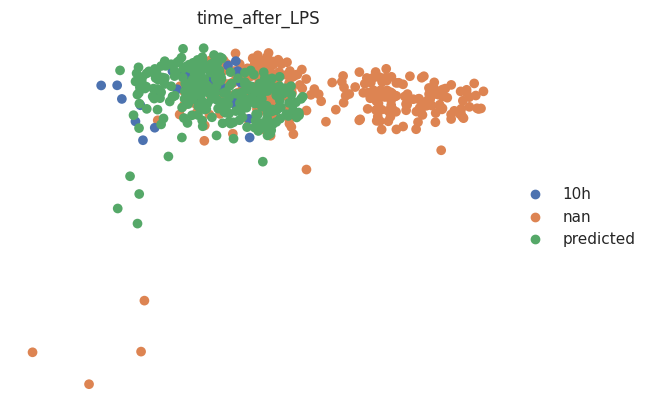

PCA plot created.



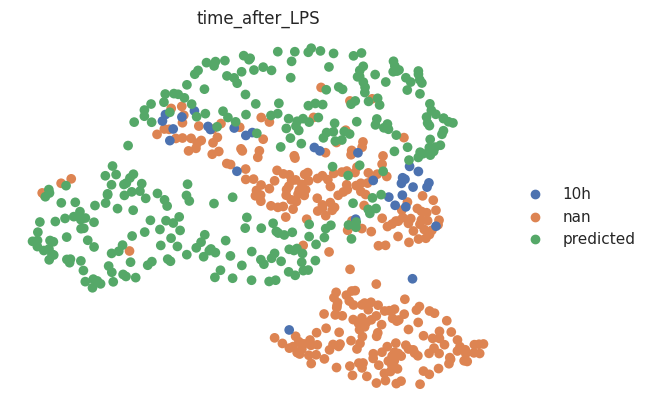

UMAP plot created.

Bootstrapped R²: 0.9394 ± 0.0026


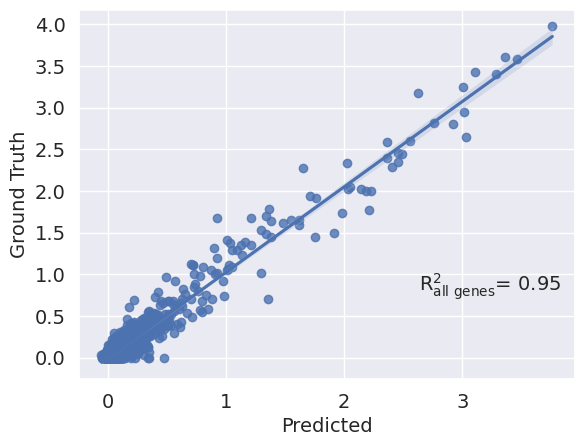

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.365380219742936

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3653800604488269

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1684948205947876

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD4.CM") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytorch 

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.69it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=7.57e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=7.57e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


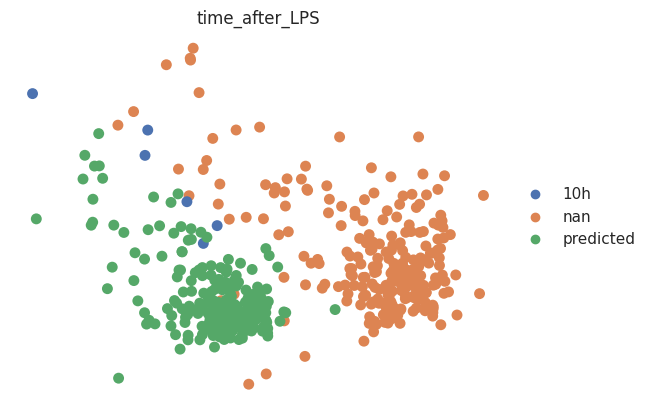

PCA plot created.



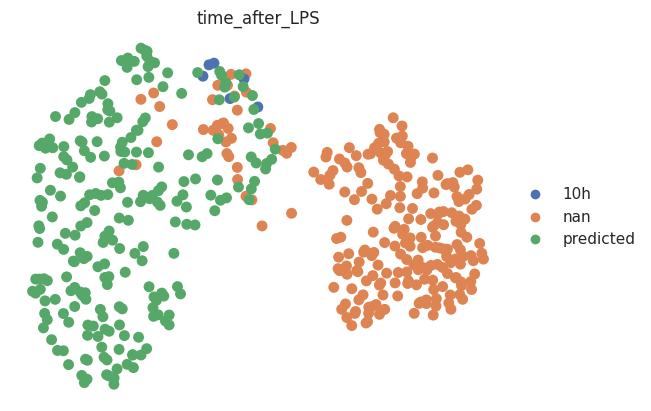

UMAP plot created.

Bootstrapped R²: 0.7571 ± 0.0301


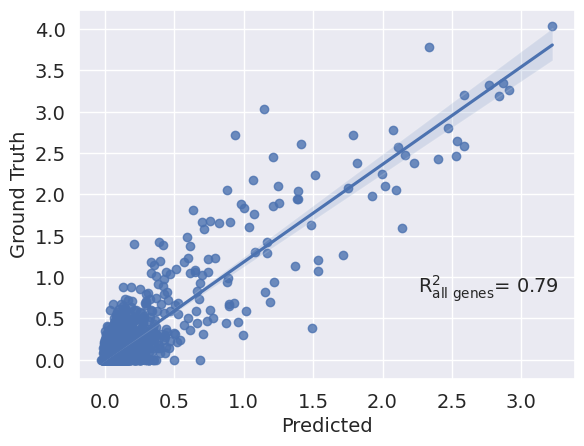

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 2.6505291129380364

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 2.6505294149610967

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.628044605255127

Preprocessing data for scGen...
Selection of highly variable genes skipped.

No conditions provided for removal.

Subsampling skipped.

Preprocessing completed.

Preparing training set by excluding specific conditions...
Excluded cells where: (author_cell_type == "CD8.Naive") & (time_after_LPS == "10h")

Setting up AnnData for scGen...
AnnData set up for scGen with batch_key='time_after_LPS' and labels_key='author_cell_type'.

Initializing and training scGen model...
scGen model initialized.

INFO     Jax module moved to cuda:0.Note: Pytor

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  3.73it/s, v_num=1, train_loss_step=6.29e+3, train_loss_epoch=7.69e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s, v_num=1, train_loss_step=6.29e+3, train_loss_epoch=7.69e+3]
scGen model trained.

scGen model saved to 'model_perturbation_prediction.pt'.

Making predictions...
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
Predictions made.

Evaluating predictions...
Evaluation data prepared.



/home/ubuntu/miniforge3/envs/ppy/lib/python3.12/site-packages/anndata/_core/merge.py:1434: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


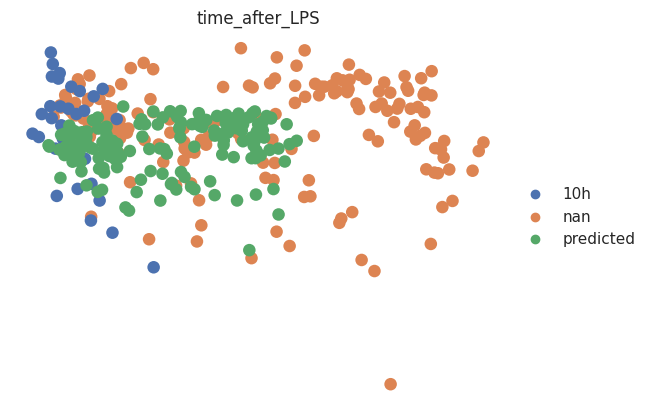

PCA plot created.



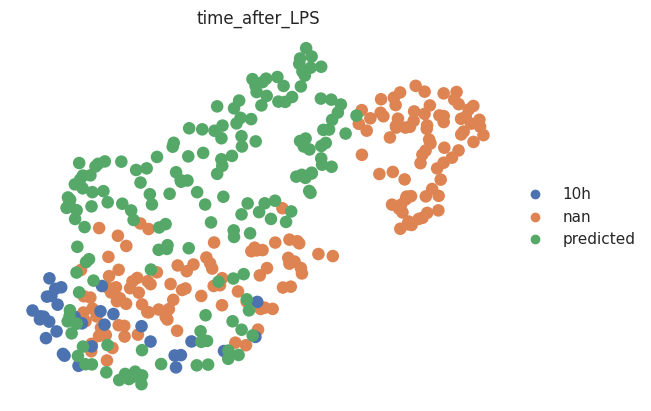

UMAP plot created.

Bootstrapped R²: 0.9241 ± 0.0026


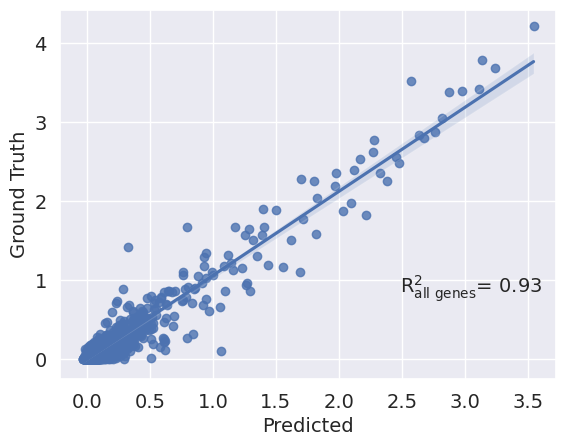

Computing distance metric...
PCA with 30 components computed.

Distance metric 'edistance' initialized.

Perturbation score computed: 1.3682785898725183

Computing distance metric...
PCA with 30 components computed.

Distance metric 'mmd' initialized.

Perturbation score computed: 1.3682784763432938

Computing distance metric...
PCA with 30 components computed.

Distance metric 'euclidean' initialized.

Perturbation score computed: 1.1697343587875366

  celltype_to_predict          Type   r2_mean    r2_std  MSE_mean   MSE_std  \
0             B_naive  top 100 DEGs  0.945740  0.001333  0.005117  0.000284   
1             NK_16hi  top 100 DEGs  0.929213  0.002440  0.008238  0.000861   
2           CD4.Naive  top 100 DEGs  0.941576  0.002287  0.005447  0.000726   
3              CD4.CM  top 100 DEGs  0.780742  0.028268  0.025070  0.009575   
4           CD8.Naive  top 100 DEGs  0.924722  0.002975  0.006237  0.000606   
5             B_naive     all genes  0.925017  0.001731  0.006875  0.0

In [20]:
import numpy as np
import pandas as pd
from scipy import sparse, stats
from scipy.spatial.distance import cosine as cosine_dist

def bootstrap_cell_metrics(X, real_mask, pred_mask, n_boot=200, frac=0.8, random_seed=42):
    """
    Bootstrap mean‐expression metrics by sampling cells within each group.

    Returns a dict mapping:
      MSE_mean,   MSE_std,
      RMSE_mean,  RMSE_std,
      MAE_mean,   MAE_std,
      L2_mean,    L2_std,
      Pearson_mean, Pearson_std,
      Cosine_mean,  Cosine_std
    """
    rng = np.random.default_rng(random_seed)
    real_idx = np.where(real_mask)[0]
    pred_idx = np.where(pred_mask)[0]
    n_real, n_pred = len(real_idx), len(pred_idx)
    sample_real = max(1, int(frac * n_real))
    sample_pred = max(1, int(frac * n_pred))

    mse_vals = []
    rmse_vals = []
    mae_vals = []
    l2_vals = []
    pear_vals = []
    cos_vals = []

    for _ in range(n_boot):
        r = rng.choice(real_idx, size=sample_real, replace=True)
        p = rng.choice(pred_idx, size=sample_pred, replace=True)
        y = X[r].mean(axis=0)
        x = X[p].mean(axis=0)
        diff = x - y

        mse_vals.append(np.mean(diff ** 2))
        rmse_vals.append(np.sqrt(np.mean(diff ** 2)))
        mae_vals.append(np.mean(np.abs(diff)))
        l2_vals.append(np.linalg.norm(diff))
        pear_vals.append(stats.pearsonr(x, y)[0])
        cos_vals.append(1 - cosine_dist(x, y))

    def mean_std(arr):
        return float(np.mean(arr)), float(np.std(arr))

    mse_m, mse_s       = mean_std(mse_vals)
    rmse_m, rmse_s     = mean_std(rmse_vals)
    mae_m, mae_s       = mean_std(mae_vals)
    l2_m,  l2_s        = mean_std(l2_vals)
    pear_m, pear_s     = mean_std(pear_vals)
    cos_m,  cos_s      = mean_std(cos_vals)

    return {
        "MSE_mean":       mse_m,
        "MSE_std":        mse_s,
        "RMSE_mean":      rmse_m,
        "RMSE_std":       rmse_s,
        "MAE_mean":       mae_m,
        "MAE_std":        mae_s,
        "L2_mean":        l2_m,
        "L2_std":         l2_s,
        "Pearson_mean":   pear_m,
        "Pearson_std":    pear_s,
        "Cosine_mean":    cos_m,
        "Cosine_std":     cos_s,
    }

results = []

for gene_label, hvgs in [("top 100 DEGs", 100), ("all genes", None)]:
    for celltype in common_celltypes:
        analysis = scGenPerturbationAnalysis(norm_data)

        # 1️⃣ Preprocess & train
        analysis.preprocess_data(
            highly_variable_genes = (hvgs is not None),
            n_top_genes           = hvgs if hvgs is not None else norm_data.n_vars,
        )
        analysis.prepare_training_set(
            exclude_query=(
                f'({celltype_col} == "{celltype}") '
                f'& ({condition_col} == "{stim_key}")'
            )
        )
        analysis.setup_anndata(batch_key=condition_col, labels_key=celltype_col)
        analysis.train_model(
            max_epochs=n_epochs, batch_size=batch_size,
            accelerator="gpu", devices=1
        )

        # 2️⃣ Predict & R²
        analysis.make_prediction(
            ctrl_key=ctrl_key, stim_key=stim_key,
            celltype_to_predict=celltype,
            condition_col=condition_col, cell_type_col=celltype_col
        )
        analysis.evaluate_prediction(
            condition_col=condition_col, cell_type_col=celltype_col,
            control_condition=ctrl_key, stimulated_condition=stim_key,
            celltype_to_evaluate=celltype, pca_components=pca_components
        )
        analysis.plot_mean_correlation(
            condition_col=condition_col,
            stimulated_condition=stim_key
        )
        r2_mean, r2_std = analysis.r2_value, analysis.r2_std

        # 2.5️⃣ Bootstrap all mean‐expression based metrics
        ad = analysis.eval_adata[
            analysis.eval_adata.obs[condition_col].isin([stim_key, "predicted"])
        ].copy()
        ad.obs.rename({condition_col: "condition"}, axis=1, inplace=True)
        X = ad.X.toarray() if sparse.issparse(ad.X) else ad.X
        real_mask = ad.obs["condition"] == stim_key
        pred_mask = ad.obs["condition"] == "predicted"

        boot = bootstrap_cell_metrics(X, real_mask, pred_mask)

        # 3️⃣ Distance metrics
        dist_scores = {}
        for metric_name in ["edistance", "mmd", "euclidean"]:
            analysis.compute_distance_metric(
                condition_col=condition_col,
                control_condition=ctrl_key,
                stimulated_condition=stim_key,
                pca_components=pca_components,
                metric=metric_name
            )
            dist_scores[metric_name] = analysis.perturbation_score

        # 4️⃣ Record everything
        row = {
            "celltype_to_predict": celltype,
            "Type":               gene_label,
            "r2_mean":            r2_mean,
            "r2_std":             r2_std,
            **boot,
            **dist_scores
        }
        results.append(row)

results_df = pd.DataFrame(results)
print(results_df)


/tmp/ipykernel_404195/3731243701.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/tmp/ipykernel_404195/3731243701.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/tmp/ipykernel_404195/3731243701.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/tmp/ipykernel_404195/3731243701.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
/tmp/ipykernel_404195/3731243701.py:42: UserWarning: set

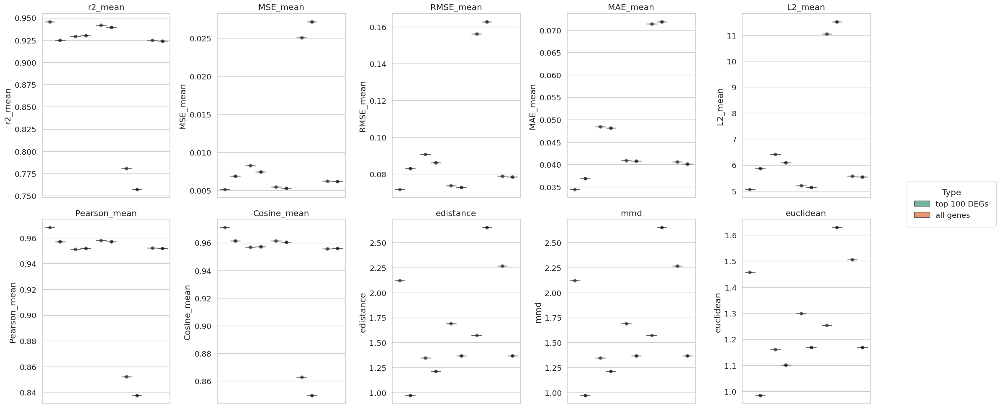

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# list of the metrics you want to plot
metrics = [
    "r2_mean", "MSE_mean", "RMSE_mean", "MAE_mean", "L2_mean",
    "Pearson_mean", "Cosine_mean", "edistance", "mmd", "euclidean"
]

# set a nice style
sns.set(style="whitegrid", font_scale=1.2)

# make subplots: 2 rows × 5 cols
fig, axes = plt.subplots(2, 5, figsize=(24, 10), sharex=True)
axes = axes.flatten()

for ax, metric in zip(axes, metrics):
    # boxplot without fliers
    sns.boxplot(
        x="celltype_to_predict",
        y=metric,
        hue="Type",
        data=results_df,
        ax=ax,
        showfliers=False,
        palette="Set2"
    )
    # overlay the raw points, dodged by hue
    sns.stripplot(
        x="celltype_to_predict",
        y=metric,
        hue="Type",
        data=results_df,
        ax=ax,
        dodge=True,
        color="black",
        size=6,
        alpha=0.7
    )
    ax.set_title(metric)
    ax.set_xlabel("")      # remove x‐axis label
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    # remove the inner legend so we only get one overall
    ax.legend_.remove()

# place a single legend to the right
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles[:2],               # two handles (one per Type)
    labels[:2],                # their labels
    title="Type",
    loc="center right",
    frameon=True,
    borderpad=1
)

plt.tight_layout(rect=[0,0,0.88,1])  # leave room on the right for legend
plt.show()


### Why Bootstrap Our Metrics?

Bootstrapping here means repeatedly resampling your cells (with replacement) to get a distribution of each summary metric—instead of computing one single MSE or Pearson-r on the full “predicted vs. real” means, you:

1. **Randomly pick** (say) 80% of your predicted cells and 80% of your real cells  
2. **Compute** the summary (MSE, RMSE, MAE, L2 norm, Pearson’s r or cosine) on *just* that subsample  
3. **Repeat** steps 1–2 hundreds of times (we used 200)  
4. **Aggregate** the results to get a mean and standard deviation for each metric

---

#### Why This Helps

- **Uncertainty quantification**  
  A single MSE or Pearson-r doesn’t tell you how much sampling noise there is. Bootstrapping gives you an *estimate of the variability* (the “_std_” column) around that metric.

- **Robustness check**  
  If one cell or a small batch of cells drives your metric, bootstrapping will reveal that high variance. Conversely, a tight distribution (small std) means your result is stable.

- **Fair comparisons**  
  When you compare cell-type A vs. B, or “top 100 DEGs” vs. “all genes,” you can ask: is A’s MSE really lower than B’s, or are they within each other’s error bars? Bootstrapped standard deviations let you do that.

---

**In short**, instead of  
```python
# single-point estimate
MSE = np.mean((x̄ – ȳ)**2)



MSE_mean ± MSE_std
